# =================================
# STARTING FROM THE BOTTOM
# =================================


1. OBTAIN DATA
2. SCRUB DATA
3. EXPLORE DATA
4. MODEL DATA
5. INTERPRET DATA


# MVP -- Minimum Viable Product:
(simpliest submission possible, no modeling)

In [0]:
import pandas as pd
import numpy as np
## GLOBAL WK 2
train_file = "https://raw.githubusercontent.com/danielcaraway/data/master/covid19-global-forecasting-week-2/train.csv"
test_file = "https://raw.githubusercontent.com/danielcaraway/data/master/covid19-global-forecasting-week-2/test.csv"
sub_file = "https://raw.githubusercontent.com/danielcaraway/data/master/covid19-global-forecasting-week-2/submission.csv"

train = pd.read_csv(train_file)
test = pd.read_csv(test_file)
sub = pd.read_csv(sub_file)

In [0]:
# BEFORE
sub.head()

In [4]:
# AFTER
sub['ConfirmedCases'] = 100
sub['Fatalities'] = 18
sub.head()

,ForecastId,ConfirmedCases,Fatalities
0,1,100,18
1,2,100,18
2,3,100,18
3,4,100,18
4,5,100,18


In [0]:
sub.to_csv('submission', index=False)
from google.colab import files
files.download("submission.csv")

Ok so what's the problem with this picture? 
Well, we're saying that every single country on every single day has exactly 100 cases of COVID and exactly 18 deaths. BUT, we have proved we can manipulate the submission DF so we've got that going for us which is nice. 

Now, it would also be nice to actually take into account the country and the date, right? 

In [0]:
merged = pd.merge(sub, test, on="ForecastId", how="left")

In [9]:
df = merged.copy()
df

,ForecastId,ConfirmedCases,Fatalities,Province_State,Country_Region,Date
0,1,100,18,NaN,Afghanistan,2020-03-19
1,2,100,18,NaN,Afghanistan,2020-03-20
2,3,100,18,NaN,Afghanistan,2020-03-21
3,4,100,18,NaN,Afghanistan,2020-03-22
4,5,100,18,NaN,Afghanistan,2020-03-23
...,...,...,...,...,...,...
12637,12638,100,18,NaN,Zimbabwe,2020-04-26
12638,12639,100,18,NaN,Zimbabwe,2020-04-27
12639,12640,100,18,NaN,Zimbabwe,2020-04-28
12640,12641,100,18,NaN,Zimbabwe,2020-04-29


OK great! Now we have the country AND the date with our corecast ID!! So we know we can successfully merge our testing df into our submission df.

But... our ConfirmedCases and Fatalities are still 100 and 18 without regard to the country...

In [0]:
df['Date'] = pd.to_datetime(df['Date'])
df['days_from'] = df['Date'] - (df['Date'].min())
df['days_from'] = df['days_from'] / np.timedelta64(1, 'D')

In [15]:
df['CC_v2'] = df.apply(lambda x: x['days_from']*x['days_from'] , axis=1)
df['F_v2'] = df.apply(lambda x: x['days_from'] * 2 , axis=1)
df

,ForecastId,ConfirmedCases,Fatalities,Province_State,Country_Region,Date,days_from,CC_v2,F_v2
0,1,100,18,NaN,Afghanistan,2020-03-19,0.0,0.0,0.0
1,2,100,18,NaN,Afghanistan,2020-03-20,1.0,1.0,2.0
2,3,100,18,NaN,Afghanistan,2020-03-21,2.0,4.0,4.0
3,4,100,18,NaN,Afghanistan,2020-03-22,3.0,9.0,6.0
4,5,100,18,NaN,Afghanistan,2020-03-23,4.0,16.0,8.0
...,...,...,...,...,...,...,...,...,...
12637,12638,100,18,NaN,Zimbabwe,2020-04-26,38.0,1444.0,76.0
12638,12639,100,18,NaN,Zimbabwe,2020-04-27,39.0,1521.0,78.0
12639,12640,100,18,NaN,Zimbabwe,2020-04-28,40.0,1600.0,80.0
12640,12641,100,18,NaN,Zimbabwe,2020-04-29,41.0,1681.0,82.0


OK great! Now each country is different! I call this VAMPIRE DATA where the number of people bitten (infected) is logarathmic and the number of deaths is simply linear (because not everyone dies from bites, duh)

In [17]:
spain = df[df['Country_Region'] == 'Spain']
spain.head()

,ForecastId,ConfirmedCases,Fatalities,Province_State,Country_Region,Date,days_from,CC_v2,F_v2
8987,8988,100,18,NaN,Spain,2020-03-19,0.0,0.0,0.0
8988,8989,100,18,NaN,Spain,2020-03-20,1.0,1.0,2.0
8989,8990,100,18,NaN,Spain,2020-03-21,2.0,4.0,4.0
8990,8991,100,18,NaN,Spain,2020-03-22,3.0,9.0,6.0
8991,8992,100,18,NaN,Spain,2020-03-23,4.0,16.0,8.0


In [0]:
import seaborn as sns; sns.set()
import matplotlib.pyplot as plt

graph_df = df[['days_from', 'CC_v2', 'F_v2']]

In [21]:
data = pd.melt(graph_df, id_vars=['days_from'], value_vars=['CC_v2','F_v2'])
data.head()

,days_from,variable,value
0,0.0,CC_v2,0.0
1,1.0,CC_v2,1.0
2,2.0,CC_v2,4.0
3,3.0,CC_v2,9.0
4,4.0,CC_v2,16.0


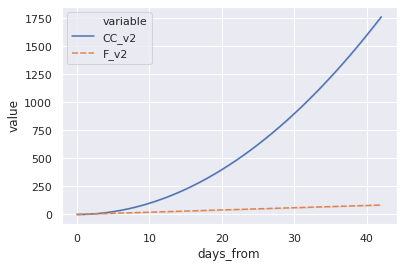

In [22]:
ax = sns.lineplot(x="days_from", y="value",
                  hue="variable", style="variable", data=data)

OMG SO FUN!! Vampires!! But, like, can we actually use data instead of just... you know, like... the date?

EXCELLENT QUESTION! In one case (for `ConfirmedCases`), we actualy ONLY have the date and the country to work with. (For `Fatalities` we can use the number we generated for `ConfirmedCases`).

Forgive me, I should have said, we only have the data and the country and the past historical data with which to create a model to apply to the date and country. So our only inputs can be date and country but we get to create the function that will generate a prediction for number of cases based on that date and country. 

In [0]:
train['Date'] = pd.to_datetime(train['Date'])
test = df.merge(train, on=['Country_Region', 'Date'], how='left')

In [31]:
test

,ForecastId,ConfirmedCases_x,Fatalities_x,Province_State_x,Country_Region,Date,days_from,CC_v2,F_v2,Id,Province_State_y,ConfirmedCases_y,Fatalities_y
0,1,100,18,NaN,Afghanistan,2020-03-19,0.0,0.0,0.0,58.0,NaN,22.0,0.0
1,2,100,18,NaN,Afghanistan,2020-03-20,1.0,1.0,2.0,59.0,NaN,24.0,0.0
2,3,100,18,NaN,Afghanistan,2020-03-21,2.0,4.0,4.0,60.0,NaN,24.0,0.0
3,4,100,18,NaN,Afghanistan,2020-03-22,3.0,9.0,6.0,61.0,NaN,40.0,1.0
4,5,100,18,NaN,Afghanistan,2020-03-23,4.0,16.0,8.0,62.0,NaN,40.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
50563,12638,100,18,NaN,Zimbabwe,2020-04-26,38.0,1444.0,76.0,NaN,NaN,NaN,NaN
50564,12639,100,18,NaN,Zimbabwe,2020-04-27,39.0,1521.0,78.0,NaN,NaN,NaN,NaN
50565,12640,100,18,NaN,Zimbabwe,2020-04-28,40.0,1600.0,80.0,NaN,NaN,NaN,NaN
50566,12641,100,18,NaN,Zimbabwe,2020-04-29,41.0,1681.0,82.0,NaN,NaN,NaN,NaN


# =================================
# STARTING CONNOR FOR REAL
# =================================



# STEP 1: GET THAT DATA



In [0]:
import pandas as pd
import numpy as np
## GLOBAL WK 2
train_file = "https://raw.githubusercontent.com/danielcaraway/data/master/covid19-global-forecasting-week-2/train.csv"
test_file = "https://raw.githubusercontent.com/danielcaraway/data/master/covid19-global-forecasting-week-2/test.csv"
sub_file = "https://raw.githubusercontent.com/danielcaraway/data/master/covid19-global-forecasting-week-2/submission.csv"

train = pd.read_csv(train_file)
test = pd.read_csv(test_file)
sub = pd.read_csv(sub_file)

# STEP 2: PREP THAT DATA

* Deal with states + countries
* Deal with datetimes
* Deal with categoricals (LabelEncoder)


In [0]:
# subset = train.sample(n=500)

In [14]:
# subset

,Id,Province_State,Country_Region,Date,ConfirmedCases,Fatalities
2152,3241,NaN,Burkina Faso,2020-03-02,0.0,0.0
15094,22847,California,US,2020-03-08,0.0,0.0
4248,6425,Inner Mongolia,China,2020-02-15,68.0,0.0
12675,19204,NaN,Qatar,2020-01-25,0.0,0.0
3696,5601,Guizhou,China,2020-01-22,1.0,0.0
...,...,...,...,...,...,...
15851,24012,Iowa,US,2020-02-02,0.0,0.0
18449,27936,NaN,Ukraine,2020-02-26,0.0,0.0
18746,28403,Gibraltar,United Kingdom,2020-01-24,0.0,0.0
6906,10443,NaN,Eswatini,2020-03-04,0.0,0.0


In [0]:
# train = subset.copy()
def use_country(state, country):
  if pd.isna(state):
    return country
  else:
    return state

train['Province_State'] = train.apply(lambda x: use_country(x['Province_State'], x['Country_Region']), axis=1)
test['Province_State'] = test.apply(lambda x: use_country(x['Province_State'], x['Country_Region']), axis=1)

In [0]:
train_d = pd.get_dummies(train)
test_d = pd.get_dummies(test)

In [47]:
train_dummies

,Id,ConfirmedCases,Fatalities,Province_State_Afghanistan,Province_State_Alabama,Province_State_Alaska,Province_State_Alberta,Province_State_Algeria,Province_State_Angola,Province_State_Anhui,Province_State_Antigua and Barbuda,Province_State_Argentina,Province_State_Arizona,Province_State_Armenia,Province_State_Australian Capital Territory,Province_State_Azerbaijan,Province_State_Bahamas,Province_State_Bangladesh,Province_State_Barbados,Province_State_Beijing,Province_State_Belarus,Province_State_Belize,Province_State_Bhutan,Province_State_Bosnia and Herzegovina,Province_State_Brazil,Province_State_British Columbia,Province_State_Brunei,Province_State_Bulgaria,Province_State_Burkina Faso,Province_State_Cabo Verde,Province_State_California,Province_State_Cambodia,Province_State_Cameroon,Province_State_Cayman Islands,Province_State_Chad,Province_State_Channel Islands,Province_State_Chile,Province_State_Colombia,Province_State_Colorado,Province_State_Congo (Brazzaville),...,Date_2020-02-17,Date_2020-02-18,Date_2020-02-19,Date_2020-02-20,Date_2020-02-21,Date_2020-02-22,Date_2020-02-23,Date_2020-02-24,Date_2020-02-25,Date_2020-02-26,Date_2020-02-27,Date_2020-02-28,Date_2020-02-29,Date_2020-03-01,Date_2020-03-02,Date_2020-03-03,Date_2020-03-04,Date_2020-03-05,Date_2020-03-06,Date_2020-03-07,Date_2020-03-08,Date_2020-03-09,Date_2020-03-10,Date_2020-03-11,Date_2020-03-12,Date_2020-03-13,Date_2020-03-14,Date_2020-03-15,Date_2020-03-16,Date_2020-03-17,Date_2020-03-18,Date_2020-03-19,Date_2020-03-20,Date_2020-03-21,Date_2020-03-22,Date_2020-03-23,Date_2020-03-24,Date_2020-03-25,Date_2020-03-26,Date_2020-03-27
2152,3241,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
15094,22847,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4248,6425,68.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
12675,19204,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3696,5601,1.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15851,24012,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
18449,27936,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
18746,28403,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
6906,10443,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


# STEP 3: MODEL THAT DATA
* GridSearchCV
* XGBRegressor

In [0]:
from sklearn.model_selection import GridSearchCV 
import time 
param_grid = {'n_estimators': [1000]}

def gridSearchCV(model, X_Train, y_Train, param_grid, cv=10, scoring='neg_mean_squared_error'): 
  start = time.time()

In [0]:
X_Train = train.copy()
y1_Train = X_Train['ConfirmedCases']
y2_Train = X_Train['Fatalities']

In [0]:
from xgboost import XGBRegressor

model = XGBRegressor()
model1 = gridSearchCV(model, X_Train, y1_Train, param_grid, 10, 'neg_mean_squared_error') 
model2 = gridSearchCV(model, X_Train, y2_Train, param_grid, 10, 'neg_mean_squared_error')

In [0]:
countries = set(X_Train['Country_Region'])

#models_C = {}
#models_F = {}

df_out = pd.DataFrame({'ForecastId': [], 'ConfirmedCases': [], 'Fatalities': []})

for country in countries:
    states = set(X_Train['Province_State'])
    # states = X_Train.loc[X_Train.Country == country, :].State.unique()
    #print(country, states)
    # check whether string is nan or not
    for state in states:
        X_Train_CS = X_Train.loc[(X_Train.Country == country) & (X_Train.State == state), ['State', 'Country', 'Date', 'ConfirmedCases', 'Fatalities']]
        
        y1_Train_CS = X_Train_CS.loc[:, 'ConfirmedCases']
        y2_Train_CS = X_Train_CS.loc[:, 'Fatalities']
        
        X_Train_CS = X_Train_CS.loc[:, ['State', 'Country', 'Date']]
        
        X_Train_CS.Country = le.fit_transform(X_Train_CS.Country)
        X_Train_CS['State'] = le.fit_transform(X_Train_CS['State'])
        
        X_Test_CS = X_Test.loc[(X_Test.Country == country) & (X_Test.State == state), ['State', 'Country', 'Date', 'ForecastId']]
        
        X_Test_CS_Id = X_Test_CS.loc[:, 'ForecastId']
        X_Test_CS = X_Test_CS.loc[:, ['State', 'Country', 'Date']]
        
        X_Test_CS.Country = le.fit_transform(X_Test_CS.Country)
        X_Test_CS['State'] = le.fit_transform(X_Test_CS['State'])
        
        #models_C[country] = gridSearchCV(model, X_Train_CS, y1_Train_CS, param_grid, 10, 'neg_mean_squared_error')
        #models_F[country] = gridSearchCV(model, X_Train_CS, y2_Train_CS, param_grid, 10, 'neg_mean_squared_error')
        
        model1 = XGBRegressor(n_estimators=1000)
        model1.fit(X_Train_CS, y1_Train_CS)
        y1_pred = model1.predict(X_Test_CS)
        
        model2 = XGBRegressor(n_estimators=1000)
        model2.fit(X_Train_CS, y2_Train_CS)
        y2_pred = model2.predict(X_Test_CS)
        
        df = pd.DataFrame({'ForecastId': X_Test_CS_Id, 'ConfirmedCases': y1_pred, 'Fatalities': y2_pred})
        df_out = pd.concat([df_out, df], axis=0)
    # Done for state loop
# Done for country Loop

# SIDEQUEST: More on XGBoost

In [0]:
b_train = train.copy()
b_test = test.copy()


### California Test

In [82]:
b_train['Date'].min()

Timestamp('2020-01-22 00:00:00')

In [0]:
b_train_ca = b_train[b_train['Province_State'] == 'California']
b_train = b_train_ca.copy()
b_train['Date'] = pd.to_datetime(b_train['Date'])



In [86]:
b_train['days_from'] = b_train['Date'] - (b_train['Date'].min())
b_train['days_from'] = b_train['days_from'] / np.timedelta64(1, 'D')
b_train

,Id,Province_State,Country_Region,Date,ConfirmedCases,Fatalities,days_from
15048,22801,California,US,2020-01-22,0.0,0.0,0.0
15049,22802,California,US,2020-01-23,0.0,0.0,1.0
15050,22803,California,US,2020-01-24,0.0,0.0,2.0
15051,22804,California,US,2020-01-25,0.0,0.0,3.0
15052,22805,California,US,2020-01-26,0.0,0.0,4.0
...,...,...,...,...,...,...,...
15109,22862,California,US,2020-03-23,2108.0,39.0,61.0
15110,22863,California,US,2020-03-24,2538.0,50.0,62.0
15111,22864,California,US,2020-03-25,2998.0,65.0,63.0
15112,22865,California,US,2020-03-26,3899.0,81.0,64.0


In [88]:
b_train_y1 = b_train['ConfirmedCases']
b_train_y2 = b_train['Fatalities']
# b_train_X = b_train.drop(['ConfirmedCases','Fatalities'], axis=1)
b_train_X = b_train.drop(['Fatalities', 'Date'], axis=1)
b_train_X

,Id,Province_State,Country_Region,ConfirmedCases,days_from
15048,22801,California,US,0.0,0.0
15049,22802,California,US,0.0,1.0
15050,22803,California,US,0.0,2.0
15051,22804,California,US,0.0,3.0
15052,22805,California,US,0.0,4.0
...,...,...,...,...,...
15109,22862,California,US,2108.0,61.0
15110,22863,California,US,2538.0,62.0
15111,22864,California,US,2998.0,63.0
15112,22865,California,US,3899.0,64.0


In [0]:
## CA TEST
# b_train_X_ca = b_train_X[b_train_X['Province_State'] == 'California']
# b_train_X = b_train_X_ca.copy()

b_train_X_d = pd.get_dummies(b_train_X)

In [80]:
# b_train_X_d['']

,Id,Date,ConfirmedCases,Province_State_California,Country_Region_US
15048,22801,2020-01-22,0.0,1,1
15049,22802,2020-01-23,0.0,1,1
15050,22803,2020-01-24,0.0,1,1
15051,22804,2020-01-25,0.0,1,1
15052,22805,2020-01-26,0.0,1,1
...,...,...,...,...,...
15109,22862,2020-03-23,2108.0,1,1
15110,22863,2020-03-24,2538.0,1,1
15111,22864,2020-03-25,2998.0,1,1
15112,22865,2020-03-26,3899.0,1,1


XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0,
             importance_type='gain', learning_rate=0.1, max_delta_step=0,
             max_depth=3, min_child_weight=1, missing=None, n_estimators=100,
             n_jobs=1, nthread=None, objective='reg:linear', random_state=0,
             reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
             silent=None, subsample=1, verbosity=1)
[23:23:46] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[23:23:46] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[23:23:46] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[23:23:46] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[23:23:46]

/usr/local/lib/python3.6/dist-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/usr/local/lib/python3.6/dist-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/usr/local/lib/python3.6/dist-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/usr/local/lib/python3.6/dist-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/usr/local/lib/python3.6/dist-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/usr/local/lib/python3.6/dist-packages/x

K-fold CV average score: 0.72
MSE: 7067.87
RMSE: 84.07


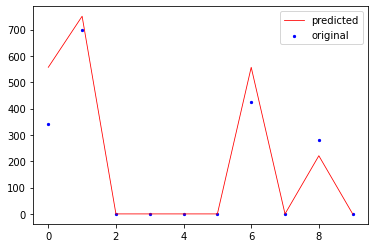

In [94]:
import xgboost as xgb
from sklearn.datasets import load_boston
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score, KFold
from sklearn.metrics import mean_squared_error
import matplotlib.pyplot as plt 
import numpy as np
 
boston = load_boston()
# x, y = boston.data, boston.target

x,y = b_train_X_d, b_train_y1
# x,y = b_train_X_d, b_train_y2
xtrain, xtest, ytrain, ytest=train_test_split(x, y, test_size=0.15)

xgbr = xgb.XGBRegressor()
print(xgbr)

xgbr.fit(xtrain, ytrain)
 
# - cross validataion 
scores = cross_val_score(xgbr, xtrain, ytrain, cv=5)
print("Mean cross-validation score: %.2f" % scores.mean())

kfold = KFold(n_splits=10, shuffle=True)
kf_cv_scores = cross_val_score(xgbr, xtrain, ytrain, cv=kfold )
print("K-fold CV average score: %.2f" % kf_cv_scores.mean())
 
ypred = xgbr.predict(xtest)
mse = mean_squared_error(ytest, ypred)
print("MSE: %.2f" % mse)
print("RMSE: %.2f" % np.sqrt(mse))

x_ax = range(len(ytest))
plt.scatter(x_ax, ytest, s=5, color="blue", label="original")
plt.plot(x_ax, ypred, lw=0.8, color="red", label="predicted")
plt.legend()
plt.show()


In [0]:
# BUILDING FORCAST ID:


In [29]:
boston.data

array([[6.3200e-03, 1.8000e+01, 2.3100e+00, ..., 1.5300e+01, 3.9690e+02,
        4.9800e+00],
       [2.7310e-02, 0.0000e+00, 7.0700e+00, ..., 1.7800e+01, 3.9690e+02,
        9.1400e+00],
       [2.7290e-02, 0.0000e+00, 7.0700e+00, ..., 1.7800e+01, 3.9283e+02,
        4.0300e+00],
       ...,
       [6.0760e-02, 0.0000e+00, 1.1930e+01, ..., 2.1000e+01, 3.9690e+02,
        5.6400e+00],
       [1.0959e-01, 0.0000e+00, 1.1930e+01, ..., 2.1000e+01, 3.9345e+02,
        6.4800e+00],
       [4.7410e-02, 0.0000e+00, 1.1930e+01, ..., 2.1000e+01, 3.9690e+02,
        7.8800e+00]])

In [31]:
boston.data.shape

(506, 13)

In [39]:
boston.target.shape

(506,)

#### BOSTON
* K-fold CV average score: 0.89
* MSE: 11.69
* RMSE: 3.42

#### V1
* K-fold CV average score: -107.07
* MSE: 36809.57
* RMSE: 191.86

#### V2 -- California
* K-fold CV average score: 0.61
* MSE: 139454.95
* RMSE: 373.44

#### V3 -- California, days_from, get_dummies

* K-fold CV average score: 0.93
* MSE: 9027.82
* RMSE: 95.01

ValueError: ignored

In [95]:
print(ypred)

[5.5687274e+02 7.5082043e+02 3.1586111e-02 3.1586111e-02 3.1586111e-02
 3.1586111e-02 5.5687274e+02 3.1586111e-02 2.2094861e+02 3.1586111e-02]


# PROPHET PARTY

In [0]:
import pandas as pd
import numpy as np
## GLOBAL WK 2
train_file = "https://raw.githubusercontent.com/danielcaraway/data/master/covid19-global-forecasting-week-2/train.csv"
test_file = "https://raw.githubusercontent.com/danielcaraway/data/master/covid19-global-forecasting-week-2/test.csv"
sub_file = "https://raw.githubusercontent.com/danielcaraway/data/master/covid19-global-forecasting-week-2/submission.csv"

train = pd.read_csv(train_file)
test = pd.read_csv(test_file)
sub = pd.read_csv(sub_file)

In [0]:

# train = subset.copy()
def use_country(state, country):
  if pd.isna(state):
    return country
  else:
    return state

train['Province_State'] = train.apply(lambda x: use_country(x['Province_State'], x['Country_Region']), axis=1)
test['Province_State'] = test.apply(lambda x: use_country(x['Province_State'], x['Country_Region']), axis=1)

In [0]:
from fbprophet import Prophet 
def get_prof_preds_for(df, n):
  m = Prophet(daily_seasonality=True)
  m.fit(df)
  future = m.make_future_dataframe(periods=n)
  forecast = m.predict(future)
  fig1 = m.plot(forecast)
  return forecast
  

In [0]:
sm = train[['Date','ConfirmedCases']]
sm.columns = ['ds', 'y']

INFO:numexpr.utils:NumExpr defaulting to 2 threads.
INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


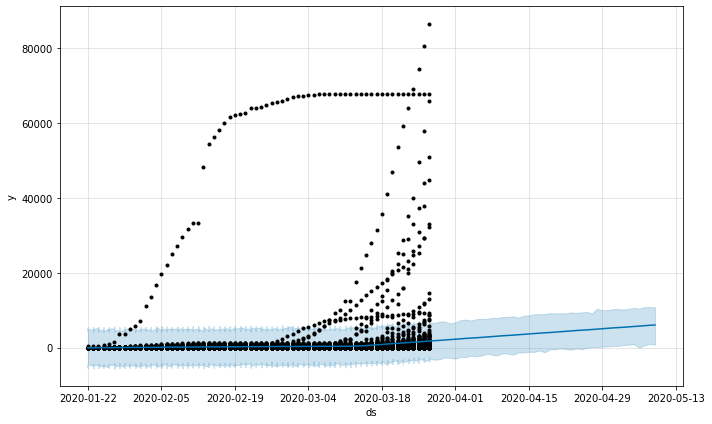

In [108]:
spain = 
get_prof_preds_for(sm, 43)

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 15.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 13.


COUNTRY: Malta
           ds       trend  ...  multiplicative_terms_upper        yhat
0  2020-03-07   -1.430856  ...                         0.0  -21.759509
1  2020-03-08    6.151689  ...                         0.0  -15.098138
2  2020-03-09   13.734234  ...                         0.0   -6.437629
3  2020-03-10   21.316779  ...                         0.0   -2.110366
4  2020-03-11   28.899323  ...                         0.0    4.549267
5  2020-03-12   36.481868  ...                         0.0   11.207623
6  2020-03-13   44.064413  ...                         0.0   18.532390
7  2020-03-14   51.646958  ...                         0.0   31.318305
8  2020-03-15   59.232023  ...                         0.0   37.982196
9  2020-03-16   66.819282  ...                         0.0   46.647420
10 2020-03-17   74.407861  ...                         0.0   50.980716
11 2020-03-18   81.998490  ...                         0.0   57.648434
12 2020-03-19   89.591802  ...                         0.0   6

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 19.


COUNTRY: Tennessee
           ds        trend  ...  multiplicative_terms_upper         yhat
0  2020-03-10   -15.786215  ...                         0.0  -213.291253
1  2020-03-11    55.329768  ...                         0.0  -162.920131
2  2020-03-12   126.445752  ...                         0.0   -74.541319
3  2020-03-13   197.561736  ...                         0.0    28.177631
4  2020-03-14   268.677719  ...                         0.0   -47.145146
5  2020-03-15   339.793703  ...                         0.0    23.416600
6  2020-03-16   410.909686  ...                         0.0    84.477799
7  2020-03-17   482.025670  ...                         0.0   284.520633
8  2020-03-18   553.141654  ...                         0.0   334.891754
9  2020-03-19   624.258316  ...                         0.0   423.271245
10 2020-03-20   695.374978  ...                         0.0   525.990874
11 2020-03-21   766.491641  ...                         0.0   450.668776
12 2020-03-22   837.608491  ... 

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 12.


COUNTRY: Argentina
           ds        trend  ...  multiplicative_terms_upper         yhat
0  2020-03-03    -6.673578  ...                         0.0   -90.287633
1  2020-03-04    13.197480  ...                         0.0   -87.048346
2  2020-03-05    33.068539  ...                         0.0   -53.827903
3  2020-03-06    52.939597  ...                         0.0   -21.103967
4  2020-03-07    72.810655  ...                         0.0   -72.236694
5  2020-03-08    92.681713  ...                         0.0   -31.282799
6  2020-03-09   112.552771  ...                         0.0   -15.972318
7  2020-03-10   132.423829  ...                         0.0    48.809773
8  2020-03-11   152.294887  ...                         0.0    52.049061
9  2020-03-12   172.165945  ...                         0.0    85.269504
10 2020-03-13   192.037003  ...                         0.0   117.993440
11 2020-03-14   211.908239  ...                         0.0    66.860890
12 2020-03-15   231.779474  ... 

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 19.


COUNTRY: Cote d'Ivoire
           ds       trend  ...  multiplicative_terms_upper        yhat
0  2020-03-11   -1.874364  ...                         0.0  -12.792135
1  2020-03-12    4.093786  ...                         0.0   -6.437642
2  2020-03-13   10.061935  ...                         0.0   -4.763730
3  2020-03-14   16.030084  ...                         0.0  -13.496723
4  2020-03-15   21.998233  ...                         0.0  -13.496059
5  2020-03-16   27.966382  ...                         0.0   -7.977660
6  2020-03-17   33.934532  ...                         0.0   18.108187
7  2020-03-18   39.902681  ...                         0.0   28.984909
8  2020-03-19   45.870876  ...                         0.0   35.339449
9  2020-03-20   51.839072  ...                         0.0   37.013407
10 2020-03-21   57.807267  ...                         0.0   28.280460
11 2020-03-22   63.775462  ...                         0.0   28.281170
12 2020-03-23   69.743658  ...                        

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 1.


COUNTRY: Senegal
           ds       trend  ...  multiplicative_terms_upper        yhat
0  2020-03-02   -1.286820  ...                         0.0  -18.363646
1  2020-03-03    3.033783  ...                         0.0  -15.864870
2  2020-03-04    7.354387  ...                         0.0  -10.864971
3  2020-03-05   11.674990  ...                         0.0   -9.366695
4  2020-03-06   15.995593  ...                         0.0   -2.616135
5  2020-03-07   20.316196  ...                         0.0   -9.915651
6  2020-03-08   24.636799  ...                         0.0    1.421216
7  2020-03-09   28.957402  ...                         0.0   11.880576
8  2020-03-10   33.278005  ...                         0.0   14.379352
9  2020-03-11   37.598608  ...                         0.0   19.379251
10 2020-03-12   41.919212  ...                         0.0   20.877527
11 2020-03-13   46.240114  ...                         0.0   27.628387
12 2020-03-14   50.561020  ...                         0.0  

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 12.


COUNTRY: Saint Kitts and Nevis
           ds  trend  ...  multiplicative_terms_upper  yhat
0  2020-03-25    2.0  ...                         0.0   2.0
1  2020-03-26    2.0  ...                         0.0   2.0
2  2020-03-27    2.0  ...                         0.0   2.0
3  2020-03-28    2.0  ...                         0.0   2.0
4  2020-03-29    2.0  ...                         0.0   2.0
5  2020-03-30    2.0  ...                         0.0   2.0
6  2020-03-31    2.0  ...                         0.0   2.0
7  2020-04-01    2.0  ...                         0.0   2.0
8  2020-04-02    2.0  ...                         0.0   2.0
9  2020-04-03    2.0  ...                         0.0   2.0
10 2020-04-04    2.0  ...                         0.0   2.0
11 2020-04-05    2.0  ...                         0.0   2.0
12 2020-04-06    2.0  ...                         0.0   2.0
13 2020-04-07    2.0  ...                         0.0   2.0
14 2020-04-08    2.0  ...                         0.0   2.0
15 2020-0

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 19.


COUNTRY: Arkansas
           ds        trend  ...  multiplicative_terms_upper         yhat
0  2020-03-11    -4.095577  ...                         0.0   -57.378351
1  2020-03-12    19.057341  ...                         0.0   -27.703169
2  2020-03-13    42.210258  ...                         0.0    -1.026883
3  2020-03-14    65.363176  ...                         0.0   -14.024136
4  2020-03-15    88.516093  ...                         0.0     9.490641
5  2020-03-16   111.669011  ...                         0.0    26.005598
6  2020-03-17   134.821929  ...                         0.0    39.520608
7  2020-03-18   157.974846  ...                         0.0   104.692072
8  2020-03-19   181.127764  ...                         0.0   134.367254
9  2020-03-20   204.280681  ...                         0.0   161.043540
10 2020-03-21   227.434636  ...                         0.0   148.047324
11 2020-03-22   250.588591  ...                         0.0   171.563139
12 2020-03-23   273.742545  ...  

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 8.


COUNTRY: Tasmania
           ds      trend  ...  multiplicative_terms_upper       yhat
0  2020-03-02  -0.486313  ...                         0.0  -7.078012
1  2020-03-03   1.092308  ...                         0.0  -7.079562
2  2020-03-04   2.670928  ...                         0.0  -4.081235
3  2020-03-05   4.249548  ...                         0.0  -1.333065
4  2020-03-06   5.828168  ...                         0.0  -0.835113
5  2020-03-07   7.406788  ...                         0.0  -3.718309
6  2020-03-08   8.985408  ...                         0.0  -1.053574
7  2020-03-09  10.564029  ...                         0.0   3.972329
8  2020-03-10  12.142649  ...                         0.0   3.970779
9  2020-03-11  13.721269  ...                         0.0   6.969106
10 2020-03-12  15.300127  ...                         0.0   9.717514
11 2020-03-13  16.878985  ...                         0.0  10.215703
12 2020-03-14  18.457842  ...                         0.0   7.332745
13 2020-03-15  2

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 21.


COUNTRY: Bahamas
           ds      trend  ...  multiplicative_terms_upper       yhat
0  2020-03-16  -0.010831  ...                         0.0   0.100304
1  2020-03-17   0.730079  ...                         0.0   0.841213
2  2020-03-18   1.470988  ...                         0.0   1.582122
3  2020-03-19   2.211897  ...                         0.0   2.323031
4  2020-03-20   2.952806  ...                         0.0   3.063940
5  2020-03-21   3.693715  ...                         0.0   3.804850
6  2020-03-22   4.434624  ...                         0.0   4.545759
7  2020-03-23   5.175533  ...                         0.0   5.286668
8  2020-03-24   5.916443  ...                         0.0   6.027577
9  2020-03-25   6.657352  ...                         0.0   6.768486
10 2020-03-26   7.398261  ...                         0.0   7.509395
11 2020-03-27   8.139170  ...                         0.0   8.250304
12 2020-03-28   8.880079  ...                         0.0   8.991214
13 2020-03-29   9

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 3.


COUNTRY: Monaco
           ds      trend  ...  multiplicative_terms_upper       yhat
0  2020-02-29  -0.413728  ...                         0.0  -8.476841
1  2020-03-01   0.750709  ...                         0.0  -5.477193
2  2020-03-02   1.915147  ...                         0.0  -4.227511
3  2020-03-03   3.079585  ...                         0.0  -4.227809
4  2020-03-04   4.244023  ...                         0.0  -2.228245
..        ...        ...  ...                         ...        ...
57 2020-04-26  65.961479  ...                         0.0  59.733576
58 2020-04-27  67.125970  ...                         0.0  60.983312
59 2020-04-28  68.290462  ...                         0.0  60.983068
60 2020-04-29  69.454954  ...                         0.0  62.982686
61 2020-04-30  70.619445  ...                         0.0  63.732324

[62 rows x 19 columns]


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 13.


COUNTRY: Grenada
           ds      trend  ...  multiplicative_terms_upper       yhat
0  2020-03-22  -0.025539  ...                         0.0  -0.417452
1  2020-03-23   1.340706  ...                         0.0   0.948793
2  2020-03-24   2.706951  ...                         0.0   2.315038
3  2020-03-25   4.073196  ...                         0.0   3.681283
4  2020-03-26   5.439441  ...                         0.0   5.047528
5  2020-03-27   6.805686  ...                         0.0   6.413773
6  2020-03-28   8.171931  ...                         0.0   7.780018
7  2020-03-29   9.538176  ...                         0.0   9.146263
8  2020-03-30  10.904421  ...                         0.0  10.512508
9  2020-03-31  12.270666  ...                         0.0  11.878754
10 2020-04-01  13.636912  ...                         0.0  13.244999
11 2020-04-02  15.003157  ...                         0.0  14.611244
12 2020-04-03  16.369402  ...                         0.0  15.977489
13 2020-04-04  17

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


COUNTRY: Pennsylvania
           ds        trend  ...  multiplicative_terms_upper         yhat
0  2020-03-10   -24.577866  ...                         0.0  -375.782861
1  2020-03-11    80.056801  ...                         0.0  -256.452069
2  2020-03-12   184.691468  ...                         0.0   -58.123348
3  2020-03-13   289.326135  ...                         0.0   163.871169
4  2020-03-14   393.960802  ...                         0.0  -144.717769
5  2020-03-15   498.595469  ...                         0.0   -78.719328
6  2020-03-16   603.230136  ...                         0.0    21.277983
7  2020-03-17   707.864802  ...                         0.0   356.659808
8  2020-03-18   812.499469  ...                         0.0   475.990599
9  2020-03-19   917.134136  ...                         0.0   674.319321
10 2020-03-20  1021.768803  ...                         0.0   896.313837
11 2020-03-21  1126.403470  ...                         0.0   587.724900
12 2020-03-22  1231.038141  .

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 19.


COUNTRY: Malaysia
           ds        trend  ...  multiplicative_terms_upper         yhat
0  2020-01-25     0.260780  ...                         0.0    -0.352636
1  2020-01-26     0.919632  ...                         0.0     2.808317
2  2020-01-27     1.578484  ...                         0.0    11.074762
3  2020-01-28     2.237336  ...                         0.0     3.004702
4  2020-01-29     2.896188  ...                         0.0     5.376775
..        ...          ...  ...                         ...          ...
92 2020-04-26  6346.633206  ...                         0.0  6348.521891
93 2020-04-27  6488.829627  ...                         0.0  6498.325905
94 2020-04-28  6631.026049  ...                         0.0  6631.793414
95 2020-04-29  6773.222470  ...                         0.0  6775.703056
96 2020-04-30  6915.418891  ...                         0.0  6921.833290

[97 rows x 19 columns]


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 4.


COUNTRY: Indonesia
           ds        trend  ...  multiplicative_terms_upper         yhat
0  2020-03-02   -12.278340  ...                         0.0  -201.338244
1  2020-03-03    24.371339  ...                         0.0  -163.089012
2  2020-03-04    61.021017  ...                         0.0  -121.590396
3  2020-03-05    97.670696  ...                         0.0   -74.841751
4  2020-03-06   134.320375  ...                         0.0   -12.842980
5  2020-03-07   170.970053  ...                         0.0   -73.228440
6  2020-03-08   207.619732  ...                         0.0   -44.229121
7  2020-03-09   244.269410  ...                         0.0    55.209506
8  2020-03-10   280.919089  ...                         0.0    93.458738
9  2020-03-11   317.568770  ...                         0.0   134.957356
10 2020-03-12   354.218451  ...                         0.0   181.706004
11 2020-03-13   390.868133  ...                         0.0   243.704778
12 2020-03-14   427.517904  ... 

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


COUNTRY: Uganda
           ds       trend  ...  multiplicative_terms_upper        yhat
0  2020-03-21   -0.014511  ...                         0.0   -0.245520
1  2020-03-22    3.448283  ...                         0.0    3.217274
2  2020-03-23    6.911077  ...                         0.0    6.680067
3  2020-03-24   10.373870  ...                         0.0   10.142861
4  2020-03-25   13.836664  ...                         0.0   13.605654
5  2020-03-26   17.299457  ...                         0.0   17.068448
6  2020-03-27   20.762251  ...                         0.0   20.531242
7  2020-03-28   24.225044  ...                         0.0   23.994035
8  2020-03-29   27.687838  ...                         0.0   27.456829
9  2020-03-30   31.150631  ...                         0.0   30.919622
10 2020-03-31   34.613425  ...                         0.0   34.382416
11 2020-04-01   38.076218  ...                         0.0   37.845209
12 2020-04-02   41.539012  ...                         0.0   

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 13.


COUNTRY: Hong Kong
           ds        trend  ...  multiplicative_terms_upper         yhat
0  2020-01-23    -0.371285  ...                         0.0    -5.542964
1  2020-01-24     2.236060  ...                         0.0     2.909374
2  2020-01-25     4.843404  ...                         0.0    -3.090630
3  2020-01-26     7.450749  ...                         0.0    -0.253988
4  2020-01-27    10.058094  ...                         0.0     2.693761
..        ...          ...  ...                         ...          ...
94 2020-04-26  1200.796384  ...                         0.0  1193.091647
95 2020-04-27  1225.637227  ...                         0.0  1218.272894
96 2020-04-28  1250.478070  ...                         0.0  1242.454142
97 2020-04-29  1275.318912  ...                         0.0  1267.413165
98 2020-04-30  1300.159755  ...                         0.0  1294.988076

[99 rows x 19 columns]


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 1.


COUNTRY: California
           ds         trend  ...  multiplicative_terms_upper          yhat
0  2020-03-10    -35.771630  ...                         0.0   -471.765470
1  2020-03-11    192.445252  ...                         0.0   -289.702049
2  2020-03-12    420.662134  ...                         0.0     92.432842
3  2020-03-13    648.879016  ...                         0.0    440.523544
4  2020-03-14    877.095899  ...                         0.0     51.938815
5  2020-03-15   1105.312781  ...                         0.0    236.012341
6  2020-03-16   1333.529664  ...                         0.0    532.700455
7  2020-03-17   1561.746546  ...                         0.0   1125.752706
8  2020-03-18   1789.963428  ...                         0.0   1307.816127
9  2020-03-19   2018.184209  ...                         0.0   1689.954917
10 2020-03-20   2246.404990  ...                         0.0   2038.049518
11 2020-03-21   2474.631608  ...                         0.0   1649.474524
12 20

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


COUNTRY: Mali
           ds       trend  ...  multiplicative_terms_upper        yhat
0  2020-03-25    0.068749  ...                         0.0    1.163723
1  2020-03-26    4.568648  ...                         0.0    5.663622
2  2020-03-27    9.068547  ...                         0.0   10.163521
3  2020-03-28   13.568446  ...                         0.0   14.663420
4  2020-03-29   18.068345  ...                         0.0   19.163319
5  2020-03-30   22.568245  ...                         0.0   23.663218
6  2020-03-31   27.068144  ...                         0.0   28.163118
7  2020-04-01   31.568043  ...                         0.0   32.663017
8  2020-04-02   36.067942  ...                         0.0   37.162916
9  2020-04-03   40.567841  ...                         0.0   41.662815
10 2020-04-04   45.067740  ...                         0.0   46.162714
11 2020-04-05   49.567640  ...                         0.0   50.662613
12 2020-04-06   54.067539  ...                         0.0   55

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 16.


COUNTRY: Shanghai
           ds       trend  ...  multiplicative_terms_upper        yhat
0  2020-01-22   -0.851707  ...                         0.0  -11.914997
1  2020-01-23   16.543226  ...                         0.0    4.617446
2  2020-01-24   33.938159  ...                         0.0   22.850820
3  2020-01-25   51.333092  ...                         0.0   38.001049
4  2020-01-26   68.728025  ...                         0.0   53.593916
..        ...         ...  ...                         ...         ...
95 2020-04-26  645.360250  ...                         0.0  630.226141
96 2020-04-27  651.907148  ...                         0.0  635.770258
97 2020-04-28  658.454046  ...                         0.0  641.648128
98 2020-04-29  665.000944  ...                         0.0  653.937654
99 2020-04-30  671.547842  ...                         0.0  659.622062

[100 rows x 19 columns]


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 13.


COUNTRY: Togo
           ds      trend  ...  multiplicative_terms_upper       yhat
0  2020-03-06  -0.372899  ...                         0.0  -4.221947
1  2020-03-07   0.886153  ...                         0.0  -2.813487
2  2020-03-08   2.145205  ...                         0.0  -2.813932
3  2020-03-09   3.404258  ...                         0.0  -2.147815
4  2020-03-10   4.663310  ...                         0.0  -1.481608
5  2020-03-11   5.922362  ...                         0.0  -0.482138
6  2020-03-12   7.181415  ...                         0.0  -0.482495
7  2020-03-13   8.440467  ...                         0.0   4.591420
8  2020-03-14   9.699519  ...                         0.0   5.999879
9  2020-03-15  10.958572  ...                         0.0   5.999434
10 2020-03-16  12.217624  ...                         0.0   6.665551
11 2020-03-17  13.476676  ...                         0.0   7.331759
12 2020-03-18  14.735729  ...                         0.0   8.331229
13 2020-03-19  15.99

/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 16.


COUNTRY: Maryland
           ds        trend  ...  multiplicative_terms_upper         yhat
0  2020-03-10    -7.418671  ...                         0.0  -113.811442
1  2020-03-11    28.708047  ...                         0.0   -79.779939
2  2020-03-12    64.834764  ...                         0.0   -18.738545
3  2020-03-13   100.961482  ...                         0.0    61.334179
4  2020-03-14   137.088200  ...                         0.0   -16.880163
5  2020-03-15   173.214917  ...                         0.0    11.685789
6  2020-03-16   209.349340  ...                         0.0    39.244216
7  2020-03-17   245.483762  ...                         0.0   139.090991
8  2020-03-18   281.618184  ...                         0.0   173.130199
9  2020-03-19   317.752607  ...                         0.0   234.179297
10 2020-03-20   353.890737  ...                         0.0   314.263434
11 2020-03-21   390.028867  ...                         0.0   236.060505
12 2020-03-22   426.166997  ...  

/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 13.


COUNTRY: Cameroon
           ds       trend  ...  multiplicative_terms_upper        yhat
0  2020-03-06   -1.289773  ...                         0.0  -13.210731
1  2020-03-07    2.686427  ...                         0.0  -17.821103
2  2020-03-08    6.662626  ...                         0.0  -13.147499
3  2020-03-09   10.638826  ...                         0.0   -7.140614
4  2020-03-10   14.615026  ...                         0.0   -1.798486
5  2020-03-11   18.591226  ...                         0.0    1.212594
6  2020-03-12   22.567425  ...                         0.0    2.223483
7  2020-03-13   26.543625  ...                         0.0   14.622667
8  2020-03-14   30.519825  ...                         0.0   10.012295
9  2020-03-15   34.496025  ...                         0.0   14.685899
10 2020-03-16   38.472224  ...                         0.0   20.692784
11 2020-03-17   42.448424  ...                         0.0   26.034912
12 2020-03-18   46.424624  ...                         0.0 

/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


COUNTRY: Washington
           ds        trend  ...  multiplicative_terms_upper         yhat
0  2020-03-10    -4.306831  ...                         0.0   -28.433921
1  2020-03-11   174.463839  ...                         0.0    71.386503
2  2020-03-12   353.234507  ...                         0.0   422.509261
3  2020-03-13   532.005173  ...                         0.0   603.597286
4  2020-03-14   710.775843  ...                         0.0   556.436804
5  2020-03-15   889.546512  ...                         0.0   693.683790
6  2020-03-16  1068.318992  ...                         0.0   935.927689
7  2020-03-17  1247.107431  ...                         0.0  1222.980342
8  2020-03-18  1425.927823  ...                         0.0  1322.850487
9  2020-03-19  1604.838948  ...                         0.0  1674.113702
10 2020-03-20  1783.855767  ...                         0.0  1855.447881
11 2020-03-21  1962.952078  ...                         0.0  1808.613039
12 2020-03-22  2142.134809  ...

/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


COUNTRY: Korea, South
           ds         trend  ...  multiplicative_terms_upper          yhat
0  2020-01-22    -41.055809  ...                         0.0   -710.750977
1  2020-01-23     10.817683  ...                         0.0   -693.344351
2  2020-01-24     62.691174  ...                         0.0   -670.553355
3  2020-01-25    114.564665  ...                         0.0   -464.031021
4  2020-01-26    166.438156  ...                         0.0   -438.010388
..        ...           ...  ...                         ...           ...
95 2020-04-26  18997.810853  ...                         0.0  18393.362309
96 2020-04-27  19257.187921  ...                         0.0  18604.663823
97 2020-04-28  19516.564989  ...                         0.0  18829.408876
98 2020-04-29  19775.942057  ...                         0.0  19106.246889
99 2020-04-30  20035.319125  ...                         0.0  19331.157092

[100 rows x 19 columns]


/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 19.


COUNTRY: Cambodia
           ds      trend  ...  multiplicative_terms_upper       yhat
0  2020-01-27  -1.055185  ...                         0.0 -18.294078
1  2020-01-28   0.001222  ...                         0.0 -14.964389
2  2020-01-29   1.057629  ...                         0.0 -14.079390
3  2020-01-30   2.114036  ...                         0.0 -13.861263
4  2020-01-31   3.170442  ...                         0.0 -11.754298
..        ...        ...  ...                         ...        ...
90 2020-04-26  94.244025  ...                         0.0  75.272202
91 2020-04-27  95.304317  ...                         0.0  78.065424
92 2020-04-28  96.364610  ...                         0.0  81.398999
93 2020-04-29  97.424903  ...                         0.0  82.287884
94 2020-04-30  98.485196  ...                         0.0  82.509897

[95 rows x 19 columns]


/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 5.


COUNTRY: Latvia
           ds       trend  ...  multiplicative_terms_upper        yhat
0  2020-03-02   -3.224952  ...                         0.0  -52.528092
1  2020-03-03    7.041529  ...                         0.0  -44.029486
2  2020-03-04   17.308010  ...                         0.0  -32.033400
3  2020-03-05   27.574492  ...                         0.0  -22.537010
4  2020-03-06   37.840973  ...                         0.0   -5.543514
5  2020-03-07   48.107454  ...                         0.0  -21.506480
6  2020-03-08   58.373935  ...                         0.0  -14.841584
7  2020-03-09   68.640417  ...                         0.0   19.337276
8  2020-03-10   78.906898  ...                         0.0   27.835882
9  2020-03-11   89.174077  ...                         0.0   39.832667
10 2020-03-12   99.441645  ...                         0.0   49.330144
11 2020-03-13  109.709214  ...                         0.0   66.324727
12 2020-03-14  119.978668  ...                         0.0   

/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 10.


COUNTRY: Angola
           ds      trend  ...  multiplicative_terms_upper       yhat
0  2020-03-20   0.078465  ...                         0.0   1.333611
1  2020-03-21   0.483150  ...                         0.0   1.738296
2  2020-03-22   0.887835  ...                         0.0   2.142981
3  2020-03-23   1.292520  ...                         0.0   2.547666
4  2020-03-24   1.697198  ...                         0.0   2.952344
5  2020-03-25   2.101876  ...                         0.0   3.357022
6  2020-03-26   2.506553  ...                         0.0   3.761699
7  2020-03-27   2.911231  ...                         0.0   4.166377
8  2020-03-28   3.315909  ...                         0.0   4.571055
9  2020-03-29   3.720586  ...                         0.0   4.975732
10 2020-03-30   4.125264  ...                         0.0   5.380410
11 2020-03-31   4.529942  ...                         0.0   5.785088
12 2020-04-01   4.934619  ...                         0.0   6.189765
13 2020-04-02   5.

/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 11.


COUNTRY: Suriname
           ds      trend  ...  multiplicative_terms_upper       yhat
0  2020-03-14  -0.022381  ...                         0.0  -0.427967
1  2020-03-15   0.647759  ...                         0.0   0.242173
2  2020-03-16   1.317898  ...                         0.0   0.912313
3  2020-03-17   1.988038  ...                         0.0   1.582452
4  2020-03-18   2.658178  ...                         0.0   2.252592
5  2020-03-19   3.328317  ...                         0.0   2.922732
6  2020-03-20   3.998457  ...                         0.0   3.592871
7  2020-03-21   4.668597  ...                         0.0   4.263011
8  2020-03-22   5.338737  ...                         0.0   4.933151
9  2020-03-23   6.008876  ...                         0.0   5.603290
10 2020-03-24   6.679016  ...                         0.0   6.273430
11 2020-03-25   7.349156  ...                         0.0   6.943570
12 2020-03-26   8.019295  ...                         0.0   7.613709
13 2020-03-27   

/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


COUNTRY: Kenya
           ds       trend  ...  multiplicative_terms_upper        yhat
0  2020-03-13   -0.243613  ...                         0.0   -3.193550
1  2020-03-14    2.069822  ...                         0.0   -4.097441
2  2020-03-15    4.383257  ...                         0.0    0.903347
3  2020-03-16    6.696692  ...                         0.0    1.402853
4  2020-03-17    9.010127  ...                         0.0    5.903499
5  2020-03-18   11.323562  ...                         0.0    7.403290
6  2020-03-19   13.636997  ...                         0.0   10.903650
7  2020-03-20   15.950432  ...                         0.0   13.000496
8  2020-03-21   18.263868  ...                         0.0   12.096606
9  2020-03-22   20.577304  ...                         0.0   17.097395
10 2020-03-23   22.890740  ...                         0.0   17.596902
11 2020-03-24   25.204176  ...                         0.0   22.097548
12 2020-03-25   27.517612  ...                         0.0   2

/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


COUNTRY: Guangdong
           ds        trend  ...  multiplicative_terms_upper         yhat
0  2020-01-22    -6.345998  ...                         0.0   -97.642136
1  2020-01-23    61.647352  ...                         0.0   -35.987652
2  2020-01-24   129.640702  ...                         0.0    29.695792
3  2020-01-25   197.634052  ...                         0.0    95.013279
4  2020-01-26   265.627402  ...                         0.0   163.844564
..        ...          ...  ...                         ...          ...
95 2020-04-26  1599.072908  ...                         0.0  1497.290070
96 2020-04-27  1601.796267  ...                         0.0  1497.076037
97 2020-04-28  1604.519626  ...                         0.0  1498.306515
98 2020-04-29  1607.242985  ...                         0.0  1515.946847
99 2020-04-30  1609.966344  ...                         0.0  1512.331340

[100 rows x 19 columns]


/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


COUNTRY: France
           ds         trend  ...  multiplicative_terms_upper          yhat
0  2020-01-24     -9.090150  ...                         0.0    252.761773
1  2020-01-25      0.161987  ...                         0.0   -181.374734
2  2020-01-26      9.414123  ...                         0.0   -424.880708
3  2020-01-27     18.666260  ...                         0.0   -208.087362
4  2020-01-28     27.918397  ...                         0.0   -219.988900
..        ...           ...  ...                         ...           ...
93 2020-04-26  87475.810632  ...                         0.0  87041.515801
94 2020-04-27  89444.399978  ...                         0.0  89217.646356
95 2020-04-28  91412.989325  ...                         0.0  91165.082028
96 2020-04-29  93381.578671  ...                         0.0  93206.288200
97 2020-04-30  95350.168017  ...                         0.0  95331.703812

[98 rows x 19 columns]


/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


COUNTRY: Thailand
           ds       trend  ...  multiplicative_terms_upper        yhat
0  2020-01-22   -8.167287  ...                         0.0 -122.950796
1  2020-01-23    0.151195  ...                         0.0 -104.303696
2  2020-01-24    8.469676  ...                         0.0  -88.858653
3  2020-01-25   16.788157  ...                         0.0 -154.428137
4  2020-01-26   25.106638  ...                         0.0 -129.810823
..        ...         ...  ...                         ...         ...
95 2020-04-26  787.169567  ...                         0.0  632.252107
96 2020-04-27  795.576364  ...                         0.0  649.734505
97 2020-04-28  803.983160  ...                         0.0  666.879038
98 2020-04-29  812.389956  ...                         0.0  697.606447
99 2020-04-30  820.796753  ...                         0.0  716.341862

[100 rows x 19 columns]


/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 13.


COUNTRY: Yunnan
           ds       trend  ...  multiplicative_terms_upper        yhat
0  2020-01-22   -0.742936  ...                         0.0  -11.921209
1  2020-01-23    9.427021  ...                         0.0   -1.918692
2  2020-01-24   19.596978  ...                         0.0    8.284477
3  2020-01-25   29.766935  ...                         0.0   17.432607
4  2020-01-26   39.936892  ...                         0.0   27.193621
..        ...         ...  ...                         ...         ...
95 2020-04-26  192.063192  ...                         0.0  179.319920
96 2020-04-27  192.176286  ...                         0.0  180.024123
97 2020-04-28  192.289380  ...                         0.0  180.360188
98 2020-04-29  192.402475  ...                         0.0  181.224202
99 2020-04-30  192.515569  ...                         0.0  181.169856

[100 rows x 19 columns]


/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


COUNTRY: Vermont
           ds       trend  ...  multiplicative_terms_upper        yhat
0  2020-03-10   -2.088923  ...                         0.0  -29.371477
1  2020-03-11    7.249488  ...                         0.0  -17.373543
2  2020-03-12   16.587900  ...                         0.0   -4.709698
3  2020-03-13   25.926311  ...                         0.0    6.286808
4  2020-03-14   35.264723  ...                         0.0  -15.681967
5  2020-03-15   44.603134  ...                         0.0   -2.685334
6  2020-03-16   53.941545  ...                         0.0   10.811296
7  2020-03-17   63.279957  ...                         0.0   35.997402
8  2020-03-18   72.618368  ...                         0.0   47.995337
9  2020-03-19   81.956779  ...                         0.0   60.659182
10 2020-03-20   91.295191  ...                         0.0   71.655688
11 2020-03-21  100.633704  ...                         0.0   49.687014
12 2020-03-22  109.972217  ...                         0.0  

/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 10.


COUNTRY: Shaanxi
           ds       trend  ...  multiplicative_terms_upper        yhat
0  2020-01-23   -0.225891  ...                         0.0   -3.459256
1  2020-01-24    9.733373  ...                         0.0    6.345452
2  2020-01-25   19.692638  ...                         0.0   15.861053
3  2020-01-26   29.653681  ...                         0.0   25.911779
4  2020-01-27   39.614725  ...                         0.0   35.539231
..        ...         ...  ...                         ...         ...
94 2020-04-26  268.170614  ...                         0.0  264.428712
95 2020-04-27  268.627000  ...                         0.0  264.551505
96 2020-04-28  269.083385  ...                         0.0  265.047347
97 2020-04-29  269.539770  ...                         0.0  266.543225
98 2020-04-30  269.996155  ...                         0.0  266.762790

[99 rows x 19 columns]


/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 19.


COUNTRY: Gabon
           ds      trend  ...  multiplicative_terms_upper       yhat
0  2020-03-14  -0.012204  ...                         0.0  -0.174076
1  2020-03-15   0.553296  ...                         0.0   0.391424
2  2020-03-16   1.118796  ...                         0.0   0.956924
3  2020-03-17   1.684296  ...                         0.0   1.522424
4  2020-03-18   2.249796  ...                         0.0   2.087924
5  2020-03-19   2.815296  ...                         0.0   2.653425
6  2020-03-20   3.380797  ...                         0.0   3.218925
7  2020-03-21   3.946297  ...                         0.0   3.784425
8  2020-03-22   4.511797  ...                         0.0   4.349925
9  2020-03-23   5.077297  ...                         0.0   4.915425
10 2020-03-24   5.642797  ...                         0.0   5.480925
11 2020-03-25   6.208297  ...                         0.0   6.046425
12 2020-03-26   6.773797  ...                         0.0   6.611925
13 2020-03-27   7.3

/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 20.


COUNTRY: Andorra
           ds       trend  ...  multiplicative_terms_upper        yhat
0  2020-03-02   -3.296610  ...                         0.0  -56.637405
1  2020-03-03    5.361271  ...                         0.0  -39.633619
2  2020-03-04   14.019152  ...                         0.0  -33.628673
3  2020-03-05   22.677033  ...                         0.0  -21.123232
4  2020-03-06   31.334914  ...                         0.0   -4.868188
5  2020-03-07   39.992795  ...                         0.0  -30.576660
6  2020-03-08   48.650676  ...                         0.0  -22.237730
7  2020-03-09   57.308557  ...                         0.0    3.967761
8  2020-03-10   65.966438  ...                         0.0   20.971548
9  2020-03-11   74.624319  ...                         0.0   26.976493
10 2020-03-12   83.282200  ...                         0.0   39.481935
11 2020-03-13   91.940081  ...                         0.0   55.736979
12 2020-03-14  100.597962  ...                         0.0  

/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 13.


COUNTRY: Czechia
           ds        trend  ...  multiplicative_terms_upper         yhat
0  2020-03-01   -23.025240  ...                         0.0  -423.769549
1  2020-03-02    50.901110  ...                         0.0  -383.443298
2  2020-03-03   124.827461  ...                         0.0  -316.414217
3  2020-03-04   198.753811  ...                         0.0  -221.186310
4  2020-03-05   272.680161  ...                         0.0   -94.269320
..        ...          ...  ...                         ...          ...
56 2020-04-26  4118.225928  ...                         0.0  3717.481618
57 2020-04-27  4192.185123  ...                         0.0  3757.840714
58 2020-04-28  4266.144317  ...                         0.0  3824.902640
59 2020-04-29  4340.103512  ...                         0.0  3920.163391
60 2020-04-30  4414.062707  ...                         0.0  4047.113225

[61 rows x 19 columns]


/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 9.


COUNTRY: Connecticut
           ds        trend  ...  multiplicative_terms_upper         yhat
0  2020-03-10   -15.291066  ...                         0.0  -213.149678
1  2020-03-11    47.917517  ...                         0.0  -127.152028
2  2020-03-12   111.126100  ...                         0.0   -50.487829
3  2020-03-13   174.334682  ...                         0.0    56.176753
4  2020-03-14   237.543265  ...                         0.0  -113.249027
5  2020-03-15   300.751848  ...                         0.0   -45.750273
6  2020-03-16   363.960430  ...                         0.0     1.249012
7  2020-03-17   427.169013  ...                         0.0   229.310401
8  2020-03-18   490.377596  ...                         0.0   315.308051
9  2020-03-19   553.586179  ...                         0.0   391.972251
10 2020-03-20   616.794763  ...                         0.0   498.636834
11 2020-03-21   680.003347  ...                         0.0   329.211056
12 2020-03-22   743.211931  ..

/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 13.


COUNTRY: Prince Edward Island
           ds      trend  ...  multiplicative_terms_upper       yhat
0  2020-03-15  -0.008168  ...                         0.0  -0.141211
1  2020-03-16   0.502545  ...                         0.0   0.369502
2  2020-03-17   1.013258  ...                         0.0   0.880215
3  2020-03-18   1.523971  ...                         0.0   1.390928
4  2020-03-19   2.034684  ...                         0.0   1.901641
5  2020-03-20   2.545397  ...                         0.0   2.412353
6  2020-03-21   3.056109  ...                         0.0   2.923066
7  2020-03-22   3.566822  ...                         0.0   3.433779
8  2020-03-23   4.077535  ...                         0.0   3.944492
9  2020-03-24   4.588248  ...                         0.0   4.455205
10 2020-03-25   5.098961  ...                         0.0   4.965918
11 2020-03-26   5.609674  ...                         0.0   5.476630
12 2020-03-27   6.120386  ...                         0.0   5.987343
13 2

/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 19.


COUNTRY: Panama
           ds        trend  ...  multiplicative_terms_upper         yhat
0  2020-03-10    -6.493785  ...                         0.0  -107.579674
1  2020-03-11    28.630263  ...                         0.0   -66.902595
2  2020-03-12    63.754311  ...                         0.0   -19.894575
3  2020-03-13    98.878358  ...                         0.0    33.452927
4  2020-03-14   134.002406  ...                         0.0    -4.988316
5  2020-03-15   169.126455  ...                         0.0    55.033471
6  2020-03-16   204.250504  ...                         0.0    77.050789
7  2020-03-17   239.374744  ...                         0.0   138.288855
8  2020-03-18   274.501490  ...                         0.0   178.968632
9  2020-03-19   309.628237  ...                         0.0   225.979351
10 2020-03-20   344.758312  ...                         0.0   279.332881
11 2020-03-21   379.888388  ...                         0.0   240.897666
12 2020-03-22   415.022579  ...    

/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 7.


COUNTRY: Portugal
           ds        trend  ...  multiplicative_terms_upper         yhat
0  2020-03-02   -49.269696  ...                         0.0  -787.862467
1  2020-03-03    83.437674  ...                         0.0  -680.499534
2  2020-03-04   216.145046  ...                         0.0  -517.111172
3  2020-03-05   348.852416  ...                         0.0  -294.935395
4  2020-03-06   481.559789  ...                         0.0   -40.763603
5  2020-03-07   614.267161  ...                         0.0  -439.768827
6  2020-03-08   746.974534  ...                         0.0  -304.571733
7  2020-03-09   879.681908  ...                         0.0   141.089138
8  2020-03-10  1012.389282  ...                         0.0   248.452074
9  2020-03-11  1145.096657  ...                         0.0   411.840439
10 2020-03-12  1277.805050  ...                         0.0   634.017239
11 2020-03-13  1410.513444  ...                         0.0   888.190053
12 2020-03-14  1543.221838  ...  

/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 24.


COUNTRY: Virgin Islands
           ds      trend  ...  multiplicative_terms_upper       yhat
0  2020-03-16  -0.123504  ...                         0.0  -1.046058
1  2020-03-17   1.655283  ...                         0.0   0.732730
2  2020-03-18   3.434071  ...                         0.0   2.511517
3  2020-03-19   5.212858  ...                         0.0   4.290305
4  2020-03-22  10.549220  ...                         0.0   9.626667
5  2020-03-23  12.328008  ...                         0.0  11.405454
6  2020-03-24  14.106795  ...                         0.0  13.184242
7  2020-03-25  15.885583  ...                         0.0  14.963029
8  2020-03-26  17.664370  ...                         0.0  16.741817
9  2020-03-27  19.443158  ...                         0.0  18.520604
10 2020-03-28  21.221945  ...                         0.0  20.299392
11 2020-03-29  23.000732  ...                         0.0  22.078179
12 2020-03-30  24.779520  ...                         0.0  23.856966
13 2020-03

/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


COUNTRY: Switzerland
           ds         trend  ...  multiplicative_terms_upper          yhat
0  2020-02-25   -164.870905  ...                         0.0  -2540.739210
1  2020-02-26    204.082296  ...                         0.0  -2232.227800
2  2020-02-27    573.035497  ...                         0.0  -1833.835561
3  2020-02-28    941.988698  ...                         0.0  -1249.074373
4  2020-02-29   1310.941899  ...                         0.0  -1820.224557
..        ...           ...  ...                         ...           ...
61 2020-04-26  22342.426655  ...                         0.0  19296.860407
62 2020-04-27  22711.405307  ...                         0.0  19640.068788
63 2020-04-28  23080.383959  ...                         0.0  20704.515653
64 2020-04-29  23449.362611  ...                         0.0  21013.052515
65 2020-04-30  23818.341263  ...                         0.0  21411.470205

[66 rows x 19 columns]


/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 23.


COUNTRY: Liaoning
           ds       trend  ...  multiplicative_terms_upper        yhat
0  2020-01-22   -0.276090  ...                         0.0   -3.176455
1  2020-01-23    6.171490  ...                         0.0    2.120693
2  2020-01-24   12.619069  ...                         0.0    8.017922
3  2020-01-25   19.066649  ...                         0.0   15.860545
4  2020-01-26   25.514229  ...                         0.0   21.907619
..        ...         ...  ...                         ...         ...
95 2020-04-26  137.180622  ...                         0.0  133.574012
96 2020-04-27  137.371049  ...                         0.0  133.215471
97 2020-04-28  137.561476  ...                         0.0  133.857006
98 2020-04-29  137.751903  ...                         0.0  134.851539
99 2020-04-30  137.942331  ...                         0.0  133.891533

[100 rows x 19 columns]


/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


COUNTRY: Norway
           ds        trend  ...  multiplicative_terms_upper         yhat
0  2020-02-26   -42.329302  ...                         0.0  -630.811686
1  2020-02-27    78.039441  ...                         0.0  -508.044031
2  2020-02-28   198.408184  ...                         0.0  -333.700407
3  2020-02-29   318.776927  ...                         0.0  -423.918329
4  2020-03-01   439.145670  ...                         0.0  -316.581255
..        ...          ...  ...                         ...          ...
60 2020-04-26  7218.465608  ...                         0.0  6462.738682
61 2020-04-27  7339.696353  ...                         0.0  6558.917644
62 2020-04-28  7460.927099  ...                         0.0  6702.822612
63 2020-04-29  7582.157845  ...                         0.0  6993.675461
64 2020-04-30  7703.388591  ...                         0.0  7117.305119

[65 rows x 19 columns]


/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 13.


COUNTRY: Oman
           ds       trend  ...  multiplicative_terms_upper        yhat
0  2020-02-24   -0.886100  ...                         0.0  -17.794811
1  2020-02-25    1.981642  ...                         0.0  -12.203516
2  2020-02-26    4.849384  ...                         0.0   -5.212847
3  2020-02-27    7.717126  ...                         0.0   -1.222785
4  2020-02-28   10.584868  ...                         0.0    3.366910
..        ...         ...  ...                         ...         ...
62 2020-04-26  177.637454  ...                         0.0  155.903074
63 2020-04-27  180.521855  ...                         0.0  163.613143
64 2020-04-28  183.406256  ...                         0.0  169.221098
65 2020-04-29  186.290657  ...                         0.0  176.228426
66 2020-04-30  189.175058  ...                         0.0  180.235147

[67 rows x 19 columns]


/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 13.


COUNTRY: Arizona
           ds        trend  ...  multiplicative_terms_upper         yhat
0  2020-03-10    -7.559311  ...                         0.0  -104.276878
1  2020-03-11    24.054048  ...                         0.0   -75.939848
2  2020-03-12    55.667407  ...                         0.0   -34.268364
3  2020-03-13    87.280767  ...                         0.0    29.071658
4  2020-03-14   118.894126  ...                         0.0   -45.920335
5  2020-03-15   150.507486  ...                         0.0   -28.406724
6  2020-03-16   182.120845  ...                         0.0    15.598037
7  2020-03-17   213.734205  ...                         0.0   117.016638
8  2020-03-18   245.347564  ...                         0.0   145.353668
9  2020-03-19   276.960924  ...                         0.0   187.025152
10 2020-03-20   308.574284  ...                         0.0   250.365175
11 2020-03-21   340.187644  ...                         0.0   175.373183
12 2020-03-22   371.801004  ...   

/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 23.


COUNTRY: Nebraska
           ds       trend  ...  multiplicative_terms_upper        yhat
0  2020-03-10   -0.314985  ...                         0.0   -2.310202
1  2020-03-11    4.299038  ...                         0.0    1.018254
2  2020-03-12    8.913060  ...                         0.0    5.344138
3  2020-03-13   13.527082  ...                         0.0   11.666178
4  2020-03-14   18.141105  ...                         0.0    9.851591
5  2020-03-15   22.755127  ...                         0.0   17.841027
6  2020-03-16   27.369150  ...                         0.0   18.335675
7  2020-03-17   31.984628  ...                         0.0   29.989411
8  2020-03-18   36.601755  ...                         0.0   33.320971
9  2020-03-19   41.222632  ...                         0.0   37.653710
10 2020-03-20   45.847247  ...                         0.0   43.986342
11 2020-03-21   50.473631  ...                         0.0   42.184116
12 2020-03-22   55.100205  ...                         0.0 

/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


COUNTRY: Denmark
           ds        trend  ...  multiplicative_terms_upper         yhat
0  2020-02-27    -4.835107  ...                         0.0   -46.993019
1  2020-02-28    13.269788  ...                         0.0     2.885697
2  2020-02-29    31.374684  ...                         0.0   -33.880055
3  2020-03-01    49.479579  ...                         0.0   -48.446890
4  2020-03-02    67.584475  ...                         0.0   -64.080426
..        ...          ...  ...                         ...          ...
59 2020-04-26  4756.573670  ...                         0.0  4658.647201
60 2020-04-27  4848.871721  ...                         0.0  4717.206820
61 2020-04-28  4941.169772  ...                         0.0  4830.255995
62 2020-04-29  5033.467824  ...                         0.0  4948.054946
63 2020-04-30  5125.765875  ...                         0.0  5083.607963

[64 rows x 19 columns]


/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 20.


COUNTRY: Iraq
           ds       trend  ...  multiplicative_terms_upper        yhat
0  2020-02-24   -3.888129  ...                         0.0  -66.416833
1  2020-02-25    7.642313  ...                         0.0  -47.066702
2  2020-02-26   19.172756  ...                         0.0  -37.700621
3  2020-02-27   30.703198  ...                         0.0  -24.546128
4  2020-02-28   42.233641  ...                         0.0    0.779431
..        ...         ...  ...                         ...         ...
62 2020-04-26  716.380495  ...                         0.0  636.663981
63 2020-04-27  728.032629  ...                         0.0  665.503924
64 2020-04-28  739.684762  ...                         0.0  684.975747
65 2020-04-29  751.336896  ...                         0.0  694.463519
66 2020-04-30  762.989029  ...                         0.0  707.739703

[67 rows x 19 columns]


/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 8.


COUNTRY: Azerbaijan
           ds       trend  ...  multiplicative_terms_upper        yhat
0  2020-03-01   -1.255728  ...                         0.0  -20.845778
1  2020-03-02    3.111186  ...                         0.0  -17.846396
2  2020-03-03    7.478101  ...                         0.0  -13.596964
3  2020-03-04   11.845016  ...                         0.0  -12.097815
4  2020-03-05   16.211930  ...                         0.0   -0.098166
..        ...         ...  ...                         ...         ...
56 2020-04-26  243.341123  ...                         0.0  223.751073
57 2020-04-27  247.709310  ...                         0.0  226.751727
58 2020-04-28  252.077496  ...                         0.0  231.002432
59 2020-04-29  256.445683  ...                         0.0  232.502853
60 2020-04-30  260.813870  ...                         0.0  244.503774

[61 rows x 19 columns]


/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 22.


COUNTRY: Benin
           ds      trend  ...  multiplicative_terms_upper       yhat
0  2020-03-16   0.023301  ...                         0.0   0.399286
1  2020-03-17   0.571919  ...                         0.0   0.947905
2  2020-03-18   1.120538  ...                         0.0   1.496523
3  2020-03-19   1.669157  ...                         0.0   2.045142
4  2020-03-20   2.217775  ...                         0.0   2.593761
5  2020-03-21   2.766394  ...                         0.0   3.142379
6  2020-03-22   3.315013  ...                         0.0   3.690998
7  2020-03-23   3.863631  ...                         0.0   4.239617
8  2020-03-24   4.412250  ...                         0.0   4.788235
9  2020-03-25   4.960868  ...                         0.0   5.336854
10 2020-03-26   5.509487  ...                         0.0   5.885472
11 2020-03-27   6.058106  ...                         0.0   6.434091
12 2020-03-28   6.606724  ...                         0.0   6.982710
13 2020-03-29   7.1

/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 12.


COUNTRY: Lithuania
           ds       trend  ...  multiplicative_terms_upper        yhat
0  2020-02-28   -4.174125  ...                         0.0  -46.692247
1  2020-02-29    5.090933  ...                         0.0  -74.070040
2  2020-03-01   14.355990  ...                         0.0  -58.056068
3  2020-03-02   23.621047  ...                         0.0  -47.794868
4  2020-03-03   32.886105  ...                         0.0  -38.283384
..        ...         ...  ...                         ...         ...
58 2020-04-26  533.242529  ...                         0.0  460.830471
59 2020-04-27  542.508614  ...                         0.0  471.092699
60 2020-04-28  551.774700  ...                         0.0  480.605211
61 2020-04-29  561.040785  ...                         0.0  497.873107
62 2020-04-30  570.306870  ...                         0.0  506.386330

[63 rows x 19 columns]


/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 22.


COUNTRY: New Mexico
           ds       trend  ...  multiplicative_terms_upper        yhat
0  2020-03-11   -1.004758  ...                         0.0  -10.383432
1  2020-03-12    7.104093  ...                         0.0   -5.724462
2  2020-03-13   15.212945  ...                         0.0    6.288457
3  2020-03-14   23.321797  ...                         0.0   -1.901725
4  2020-03-15   31.430648  ...                         0.0    6.602319
5  2020-03-16   39.539500  ...                         0.0   21.636620
6  2020-03-17   47.648351  ...                         0.0   33.154696
7  2020-03-18   55.757221  ...                         0.0   46.378547
8  2020-03-19   63.866099  ...                         0.0   51.037544
9  2020-03-20   71.975132  ...                         0.0   63.050644
10 2020-03-21   80.084448  ...                         0.0   54.860927
11 2020-03-22   88.193796  ...                         0.0   63.365467
12 2020-03-23   96.303144  ...                         0.

/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


COUNTRY: Iceland
           ds        trend  ...  multiplicative_terms_upper         yhat
0  2020-02-28    -9.784750  ...                         0.0  -113.915109
1  2020-02-29    19.430565  ...                         0.0  -136.905778
2  2020-03-01    48.645880  ...                         0.0  -108.938215
3  2020-03-02    77.861195  ...                         0.0   -98.974454
4  2020-03-03   107.076510  ...                         0.0   -70.014116
..        ...          ...  ...                         ...          ...
58 2020-04-26  1687.964122  ...                         0.0  1530.380026
59 2020-04-27  1717.255372  ...                         0.0  1540.419722
60 2020-04-28  1746.546621  ...                         0.0  1569.455995
61 2020-04-29  1775.837871  ...                         0.0  1606.991509
62 2020-04-30  1805.129121  ...                         0.0  1649.776160

[63 rows x 19 columns]


/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 13.


COUNTRY: Lebanon
           ds       trend  ...  multiplicative_terms_upper        yhat
0  2020-02-21   -4.537361  ...                         0.0  -62.186543
1  2020-02-22    5.254515  ...                         0.0  -75.775737
2  2020-02-23   15.046390  ...                         0.0  -56.991320
3  2020-02-24   24.838265  ...                         0.0  -52.608935
4  2020-02-25   34.630141  ...                         0.0  -38.627240
..        ...         ...  ...                         ...         ...
65 2020-04-26  633.319829  ...                         0.0  561.282119
66 2020-04-27  643.141171  ...                         0.0  565.693970
67 2020-04-28  652.962513  ...                         0.0  579.705132
68 2020-04-29  662.783855  ...                         0.0  589.515295
69 2020-04-30  672.605197  ...                         0.0  601.924270

[70 rows x 19 columns]


/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


COUNTRY: Texas
           ds        trend  ...  multiplicative_terms_upper         yhat
0  2020-03-10   -20.724386  ...                         0.0  -321.323624
1  2020-03-11    76.514742  ...                         0.0  -206.282030
2  2020-03-12   173.753869  ...                         0.0   -63.914543
3  2020-03-13   270.992997  ...                         0.0   110.779252
4  2020-03-14   368.232125  ...                         0.0   -21.394126
5  2020-03-15   465.471252  ...                         0.0    17.162737
6  2020-03-16   562.710380  ...                         0.0    81.241891
7  2020-03-17   659.949507  ...                         0.0   359.350269
8  2020-03-18   757.188635  ...                         0.0   474.391863
9  2020-03-19   854.427828  ...                         0.0   616.759416
10 2020-03-20   951.667109  ...                         0.0   791.453364
11 2020-03-21  1048.906389  ...                         0.0   659.280138
12 2020-03-22  1146.145670  ...     

/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 9.


COUNTRY: Taiwan*
           ds       trend  ...  multiplicative_terms_upper        yhat
0  2020-01-22    0.036072  ...                         0.0    1.324351
1  2020-01-23    0.909574  ...                         0.0    2.123079
2  2020-01-24    1.783076  ...                         0.0    4.521817
3  2020-01-25    2.656578  ...                         0.0    2.480589
4  2020-01-26    3.530080  ...                         0.0    2.701444
..        ...         ...  ...                         ...         ...
95 2020-04-26  677.284778  ...                         0.0  676.456142
96 2020-04-27  691.664317  ...                         0.0  691.405223
97 2020-04-28  706.043856  ...                         0.0  706.132076
98 2020-04-29  720.423395  ...                         0.0  721.711673
99 2020-04-30  734.802934  ...                         0.0  736.016439

[100 rows x 19 columns]


/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 13.


COUNTRY: Newfoundland and Labrador
           ds       trend  ...  multiplicative_terms_upper        yhat
0  2020-03-15   -1.132452  ...                         0.0  -18.612689
1  2020-03-16    5.907332  ...                         0.0  -11.572905
2  2020-03-17   12.947115  ...                         0.0   -4.533122
3  2020-03-18   19.986899  ...                         0.0    2.506662
4  2020-03-19   27.026682  ...                         0.0    9.546445
5  2020-03-20   34.066466  ...                         0.0   16.586229
6  2020-03-21   41.106249  ...                         0.0   23.626012
7  2020-03-22   48.146033  ...                         0.0   30.665796
8  2020-03-23   55.185816  ...                         0.0   37.705579
9  2020-03-24   62.225599  ...                         0.0   44.745363
10 2020-03-25   69.265383  ...                         0.0   51.785146
11 2020-03-26   76.305166  ...                         0.0   58.824929
12 2020-03-27   83.344950  ...            

/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 6.


COUNTRY: Utah
           ds        trend  ...  multiplicative_terms_upper         yhat
0  2020-03-10    -5.339506  ...                         0.0   -64.762814
1  2020-03-11    20.627261  ...                         0.0   -50.419755
2  2020-03-12    46.594028  ...                         0.0   -21.410540
3  2020-03-13    72.560796  ...                         0.0     4.601293
4  2020-03-14    98.527563  ...                         0.0   -17.890500
5  2020-03-15   124.494330  ...                         0.0     4.129353
6  2020-03-16   150.461097  ...                         0.0    57.150293
7  2020-03-17   176.427908  ...                         0.0   117.004600
8  2020-03-18   202.394940  ...                         0.0   131.347923
9  2020-03-19   228.361972  ...                         0.0   160.357404
10 2020-03-20   254.329005  ...                         0.0   186.369503
11 2020-03-21   280.296038  ...                         0.0   163.877976
12 2020-03-22   306.263071  ...      

/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 19.


COUNTRY: Fiji
           ds      trend  ...  multiplicative_terms_upper       yhat
0  2020-03-19   0.025039  ...                         0.0   0.470260
1  2020-03-20   0.657840  ...                         0.0   1.103061
2  2020-03-21   1.290641  ...                         0.0   1.735862
3  2020-03-22   1.923442  ...                         0.0   2.368663
4  2020-03-23   2.556243  ...                         0.0   3.001464
5  2020-03-24   3.189045  ...                         0.0   3.634265
6  2020-03-25   3.821846  ...                         0.0   4.267066
7  2020-03-26   4.454647  ...                         0.0   4.899867
8  2020-03-27   5.087448  ...                         0.0   5.532669
9  2020-03-28   5.720249  ...                         0.0   6.165470
10 2020-03-29   6.353050  ...                         0.0   6.798271
11 2020-03-30   6.985851  ...                         0.0   7.431072
12 2020-03-31   7.618652  ...                         0.0   8.063873
13 2020-04-01   8.25

/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 16.


COUNTRY: Ukraine
           ds       trend  ...  multiplicative_terms_upper        yhat
0  2020-03-03   -2.871643  ...                         0.0  -48.969864
1  2020-03-04    4.486276  ...                         0.0  -36.969652
2  2020-03-05   11.844195  ...                         0.0  -23.719689
3  2020-03-06   19.202114  ...                         0.0    8.520948
4  2020-03-07   26.560033  ...                         0.0  -34.460029
5  2020-03-08   33.917952  ...                         0.0  -25.794823
6  2020-03-09   41.276881  ...                         0.0  -24.456614
7  2020-03-10   48.635811  ...                         0.0    2.537589
8  2020-03-11   55.994740  ...                         0.0   14.538812
9  2020-03-12   63.353669  ...                         0.0   27.789785
10 2020-03-13   70.712598  ...                         0.0   60.031432
11 2020-03-14   78.071527  ...                         0.0   17.051465
12 2020-03-15   85.430457  ...                         0.0  

/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 23.


COUNTRY: Bhutan
           ds     trend  ...  multiplicative_terms_upper      yhat
0  2020-03-06  0.032651  ...                         0.0  0.912672
1  2020-03-07  0.112321  ...                         0.0  0.775406
2  2020-03-08  0.191992  ...                         0.0  0.775286
3  2020-03-09  0.271662  ...                         0.0  0.775155
4  2020-03-10  0.351332  ...                         0.0  0.775005
5  2020-03-11  0.431003  ...                         0.0  0.774839
6  2020-03-12  0.510673  ...                         0.0  0.774649
7  2020-03-13  0.590343  ...                         0.0  1.470364
8  2020-03-14  0.670016  ...                         0.0  1.333101
9  2020-03-15  0.749716  ...                         0.0  1.333010
10 2020-03-16  0.829419  ...                         0.0  1.332911
11 2020-03-17  0.909175  ...                         0.0  1.332848
12 2020-03-18  0.988982  ...                         0.0  1.332818
13 2020-03-19  1.068861  ...                  

/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 20.


COUNTRY: Romania
           ds        trend  ...  multiplicative_terms_upper         yhat
0  2020-02-26   -13.960802  ...                         0.0  -187.554640
1  2020-02-27    16.806102  ...                         0.0  -158.357590
2  2020-02-28    47.573007  ...                         0.0   -90.561537
3  2020-02-29    78.339912  ...                         0.0  -197.561023
4  2020-03-01   109.106817  ...                         0.0  -177.562974
..        ...          ...  ...                         ...          ...
60 2020-04-26  1832.409709  ...                         0.0  1545.739919
61 2020-04-27  1863.185345  ...                         0.0  1588.246357
62 2020-04-28  1893.960981  ...                         0.0  1651.750974
63 2020-04-29  1924.736617  ...                         0.0  1751.142780
64 2020-04-30  1955.512253  ...                         0.0  1780.348560

[65 rows x 19 columns]


/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


COUNTRY: Armenia
           ds       trend  ...  multiplicative_terms_upper        yhat
0  2020-03-01   -4.432060  ...                         0.0  -72.189255
1  2020-03-02    7.731619  ...                         0.0  -55.457489
2  2020-03-03   19.895299  ...                         0.0  -45.470253
3  2020-03-04   32.058978  ...                         0.0  -39.982080
4  2020-03-05   44.222657  ...                         0.0  -25.253810
..        ...         ...  ...                         ...         ...
56 2020-04-26  676.929427  ...                         0.0  609.172232
57 2020-04-27  689.097765  ...                         0.0  625.908657
58 2020-04-28  701.266103  ...                         0.0  635.900551
59 2020-04-29  713.434441  ...                         0.0  641.393383
60 2020-04-30  725.602779  ...                         0.0  656.126312

[61 rows x 19 columns]


/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 15.


COUNTRY: Tibet
           ds  trend  ...  multiplicative_terms_upper  yhat
0  2020-01-30    1.0  ...                         0.0   1.0
1  2020-01-31    1.0  ...                         0.0   1.0
2  2020-02-01    1.0  ...                         0.0   1.0
3  2020-02-02    1.0  ...                         0.0   1.0
4  2020-02-03    1.0  ...                         0.0   1.0
..        ...    ...  ...                         ...   ...
87 2020-04-26    1.0  ...                         0.0   1.0
88 2020-04-27    1.0  ...                         0.0   1.0
89 2020-04-28    1.0  ...                         0.0   1.0
90 2020-04-29    1.0  ...                         0.0   1.0
91 2020-04-30    1.0  ...                         0.0   1.0

[92 rows x 19 columns]


/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 7.


COUNTRY: Moldova
           ds       trend  ...  multiplicative_terms_upper        yhat
0  2020-03-08   -2.121893  ...                         0.0  -30.277016
1  2020-03-09    7.822887  ...                         0.0  -25.274285
2  2020-03-10   17.767667  ...                         0.0  -16.937867
3  2020-03-11   27.712447  ...                         0.0   -8.934479
4  2020-03-12   37.657227  ...                         0.0    6.735505
5  2020-03-13   47.602007  ...                         0.0   20.738818
6  2020-03-14   57.546787  ...                         0.0   11.201574
7  2020-03-15   67.491567  ...                         0.0   39.336443
8  2020-03-16   77.436347  ...                         0.0   44.339175
9  2020-03-17   87.381127  ...                         0.0   52.675593
10 2020-03-18   97.326243  ...                         0.0   60.679318
11 2020-03-19  107.271393  ...                         0.0   76.349671
12 2020-03-20  117.216542  ...                         0.0  

/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 11.


COUNTRY: Djibouti
           ds      trend  ...  multiplicative_terms_upper       yhat
0  2020-03-18  -0.101438  ...                         0.0  -1.682478
1  2020-03-19   1.272301  ...                         0.0  -0.308739
2  2020-03-20   2.646040  ...                         0.0   1.065000
3  2020-03-21   4.019779  ...                         0.0   2.438739
4  2020-03-22   5.393518  ...                         0.0   3.812478
5  2020-03-23   6.767257  ...                         0.0   5.186217
6  2020-03-24   8.140996  ...                         0.0   6.559956
7  2020-03-25   9.514735  ...                         0.0   7.933695
8  2020-03-26  10.888474  ...                         0.0   9.307434
9  2020-03-27  12.262213  ...                         0.0  10.681173
10 2020-03-28  13.635952  ...                         0.0  12.054912
11 2020-03-29  15.009691  ...                         0.0  13.428651
12 2020-03-30  16.383430  ...                         0.0  14.802390
13 2020-03-31  1

/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 11.


COUNTRY: Australian Capital Territory
           ds       trend  ...  multiplicative_terms_upper        yhat
0  2020-03-13   -0.712733  ...                         0.0   -6.979618
1  2020-03-14    3.569890  ...                         0.0   -9.987295
2  2020-03-15    7.852513  ...                         0.0   -4.988061
3  2020-03-16   12.135137  ...                         0.0    2.010990
4  2020-03-17   16.417760  ...                         0.0    5.510367
5  2020-03-18   20.700383  ...                         0.0    6.010026
6  2020-03-19   24.983006  ...                         0.0   13.509034
7  2020-03-20   29.265629  ...                         0.0   22.998744
8  2020-03-21   33.548253  ...                         0.0   19.991067
9  2020-03-22   37.830876  ...                         0.0   24.990302
10 2020-03-23   42.113499  ...                         0.0   31.989352
11 2020-03-24   46.396122  ...                         0.0   35.488730
12 2020-03-25   50.678746  ...         

/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 10.


COUNTRY: Antigua and Barbuda
           ds      trend  ...  multiplicative_terms_upper       yhat
0  2020-03-13  -0.029322  ...                         0.0   0.601635
1  2020-03-14   0.314043  ...                         0.0  -0.193735
2  2020-03-15   0.657408  ...                         0.0  -0.191819
3  2020-03-16   1.000773  ...                         0.0   0.806358
4  2020-03-17   1.344137  ...                         0.0   0.808280
5  2020-03-18   1.687502  ...                         0.0   0.810181
6  2020-03-19   2.030867  ...                         0.0   2.804731
7  2020-03-20   2.374232  ...                         0.0   3.005189
8  2020-03-21   2.717597  ...                         0.0   2.209820
9  2020-03-22   3.060962  ...                         0.0   2.211736
10 2020-03-23   3.404327  ...                         0.0   3.209913
11 2020-03-24   3.747692  ...                         0.0   3.211835
12 2020-03-25   4.091057  ...                         0.0   3.213736
13 20

/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 10.


COUNTRY: Alaska
           ds       trend  ...  multiplicative_terms_upper        yhat
0  2020-03-13   -0.756113  ...                         0.0   -6.878946
1  2020-03-15    7.973415  ...                         0.0   -4.772718
2  2020-03-16   12.338179  ...                         0.0    0.227757
3  2020-03-17   16.702943  ...                         0.0    3.226628
4  2020-03-18   21.067708  ...                         0.0    8.227103
5  2020-03-19   25.432472  ...                         0.0   17.230787
6  2020-03-20   29.797236  ...                         0.0   23.674403
7  2020-03-21   34.162000  ...                         0.0   14.995913
8  2020-03-22   38.526764  ...                         0.0   25.780631
9  2020-03-23   42.891529  ...                         0.0   30.781106
10 2020-03-24   47.256293  ...                         0.0   33.779977
11 2020-03-25   51.621057  ...                         0.0   38.780452
12 2020-03-26   55.985821  ...                         0.0   

/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


COUNTRY: Namibia
           ds      trend  ...  multiplicative_terms_upper       yhat
0  2020-03-14  -0.010500  ...                         0.0   0.651700
1  2020-03-15   0.503808  ...                         0.0   1.166007
2  2020-03-16   1.018115  ...                         0.0   1.680315
3  2020-03-17   1.532422  ...                         0.0   2.194622
4  2020-03-18   2.046730  ...                         0.0   2.708929
5  2020-03-19   2.561037  ...                         0.0   3.223237
6  2020-03-20   3.075345  ...                         0.0   3.737544
7  2020-03-21   3.589652  ...                         0.0   4.251852
8  2020-03-22   4.103962  ...                         0.0   4.766161
9  2020-03-23   4.618271  ...                         0.0   5.280471
10 2020-03-24   5.132581  ...                         0.0   5.794780
11 2020-03-25   5.646890  ...                         0.0   6.309090
12 2020-03-26   6.161200  ...                         0.0   6.823400
13 2020-03-27   6

INFO:fbprophet:n_changepoints greater than number of observations. Using 24.
/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 18.


COUNTRY: Austria
           ds         trend  ...  multiplicative_terms_upper          yhat
0  2020-02-25    -91.567575  ...                         0.0  -1373.952541
1  2020-02-26    103.877576  ...                         0.0  -1236.082383
2  2020-02-27    299.322727  ...                         0.0   -885.015184
3  2020-02-28    494.767878  ...                         0.0   -617.594622
4  2020-02-29    690.213029  ...                         0.0  -1164.450773
..        ...           ...  ...                         ...           ...
61 2020-04-26  11840.376679  ...                         0.0  10040.622881
62 2020-04-27  12036.043176  ...                         0.0  10310.692775
63 2020-04-28  12231.709673  ...                         0.0  10949.324707
64 2020-04-29  12427.376170  ...                         0.0  11087.416211
65 2020-04-30  12623.042667  ...                         0.0  11438.704756

[66 rows x 19 columns]


/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 11.


COUNTRY: Gibraltar
           ds      trend  ...  multiplicative_terms_upper       yhat
0  2020-03-04  -0.480984  ...                         0.0  -6.191904
1  2020-03-05   0.965565  ...                         0.0  -3.441906
2  2020-03-06   2.412113  ...                         0.0   1.558197
3  2020-03-07   3.858661  ...                         0.0  -6.129020
4  2020-03-08   5.305210  ...                         0.0  -4.462374
5  2020-03-09   6.751758  ...                         0.0  -4.462425
6  2020-03-10   8.198306  ...                         0.0  -3.795809
7  2020-03-11   9.644854  ...                         0.0   3.933934
8  2020-03-12  11.091403  ...                         0.0   6.683932
9  2020-03-13  12.537951  ...                         0.0  11.684035
10 2020-03-14  13.984499  ...                         0.0   3.996818
11 2020-03-15  15.431048  ...                         0.0   5.663464
12 2020-03-16  16.877597  ...                         0.0   5.663413
13 2020-03-17  

/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 11.


COUNTRY: Ethiopia
           ds      trend  ...  multiplicative_terms_upper       yhat
0  2020-03-13   0.025510  ...                         0.0   1.363960
1  2020-03-14   1.069525  ...                         0.0   1.347298
2  2020-03-15   2.113540  ...                         0.0   2.348319
3  2020-03-16   3.157555  ...                         0.0   4.349325
4  2020-03-17   4.201570  ...                         0.0   4.850358
5  2020-03-18   5.245585  ...                         0.0   5.351439
6  2020-03-19   6.289319  ...                         0.0   5.352389
7  2020-03-20   7.332390  ...                         0.0   8.670839
8  2020-03-21   8.374823  ...                         0.0   8.652595
9  2020-03-22   9.416853  ...                         0.0   9.651632
10 2020-03-23  10.458875  ...                         0.0  11.650645
11 2020-03-24  11.500898  ...                         0.0  12.149686
12 2020-03-25  12.542921  ...                         0.0  12.648775
13 2020-03-26  1

/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 13.


COUNTRY: Guadeloupe
           ds       trend  ...  multiplicative_terms_upper        yhat
0  2020-03-13   -0.267707  ...                         0.0   -4.030389
1  2020-03-14    5.974985  ...                         0.0    5.149531
2  2020-03-15   12.217677  ...                         0.0    8.649819
3  2020-03-16   18.460369  ...                         0.0   12.150117
4  2020-03-17   24.703061  ...                         0.0   18.150627
5  2020-03-18   30.945753  ...                         0.0   28.152110
6  2020-03-19   37.188445  ...                         0.0   31.152996
7  2020-03-20   43.431137  ...                         0.0   39.668454
8  2020-03-21   49.673828  ...                         0.0   48.848374
9  2020-03-22   55.916519  ...                         0.0   52.348661
10 2020-03-23   62.159183  ...                         0.0   55.848931
11 2020-03-24   68.401839  ...                         0.0   61.849405
12 2020-03-25   74.644496  ...                         0.

/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 23.


COUNTRY: Ohio
           ds        trend  ...  multiplicative_terms_upper         yhat
0  2020-03-10   -12.664750  ...                         0.0  -179.033373
1  2020-03-11    43.261779  ...                         0.0  -126.674293
2  2020-03-12    99.188307  ...                         0.0   -60.640815
3  2020-03-13   155.114835  ...                         0.0    49.766185
4  2020-03-14   211.041364  ...                         0.0   -58.689703
5  2020-03-15   266.967892  ...                         0.0     0.860852
6  2020-03-16   322.894420  ...                         0.0    50.903248
7  2020-03-17   378.820949  ...                         0.0   212.452326
8  2020-03-18   434.747477  ...                         0.0   264.811406
9  2020-03-19   490.677516  ...                         0.0   330.848394
10 2020-03-20   546.607556  ...                         0.0   441.258905
11 2020-03-21   602.537596  ...                         0.0   332.806529
12 2020-03-22   658.467635  ...      

/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


COUNTRY: Netherlands
           ds         trend  ...  multiplicative_terms_upper          yhat
0  2020-02-27    -98.924712  ...                         0.0  -1317.878728
1  2020-02-28    144.866171  ...                         0.0   -907.277867
2  2020-02-29    388.657057  ...                         0.0  -1364.007081
3  2020-03-01    632.447946  ...                         0.0  -1156.504804
4  2020-03-02    876.238839  ...                         0.0   -934.752821
..        ...           ...  ...                         ...           ...
59 2020-04-26  14289.923150  ...                         0.0  12500.970400
60 2020-04-27  14533.829498  ...                         0.0  12722.837838
61 2020-04-28  14777.735846  ...                         0.0  13015.488992
62 2020-04-29  15021.642194  ...                         0.0  13348.882404
63 2020-04-30  15265.548542  ...                         0.0  14046.594526

[64 rows x 19 columns]


/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


COUNTRY: Anhui
           ds        trend  ...  multiplicative_terms_upper         yhat
0  2020-01-22    18.878564  ...                         0.0   301.801152
1  2020-01-23    33.160442  ...                         0.0   315.760118
2  2020-01-24    47.442320  ...                         0.0   330.121105
3  2020-01-25    61.724199  ...                         0.0   375.192015
4  2020-01-26    76.006077  ...                         0.0   388.805547
..        ...          ...  ...                         ...          ...
95 2020-04-26  1367.992893  ...                         0.0  1680.792363
96 2020-04-27  1382.157730  ...                         0.0  1696.291165
97 2020-04-28  1396.322567  ...                         0.0  1712.568897
98 2020-04-29  1410.487403  ...                         0.0  1693.409992
99 2020-04-30  1424.652240  ...                         0.0  1707.251915

[100 rows x 19 columns]


/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 11.


COUNTRY: Queensland
           ds       trend  ...  multiplicative_terms_upper        yhat
0  2020-01-29   -5.028754  ...                         0.0  -73.879027
1  2020-01-30   -0.066259  ...                         0.0  -62.222374
2  2020-01-31    4.896236  ...                         0.0  -49.232715
3  2020-02-01    9.858731  ...                         0.0  -83.333250
4  2020-02-02   14.821226  ...                         0.0  -76.593244
..        ...         ...  ...                         ...         ...
88 2020-04-26  433.177429  ...                         0.0  341.762960
89 2020-04-27  438.167077  ...                         0.0  350.154690
90 2020-04-28  443.156725  ...                         0.0  361.921136
91 2020-04-29  448.146374  ...                         0.0  379.296101
92 2020-04-30  453.136022  ...                         0.0  390.979907

[93 rows x 19 columns]


/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 10.


COUNTRY: Alabama
           ds        trend  ...  multiplicative_terms_upper         yhat
0  2020-03-13    -5.555595  ...                         0.0   -32.645335
1  2020-03-14    31.250599  ...                         0.0   -60.287176
2  2020-03-15    68.056793  ...                         0.0   -44.288371
3  2020-03-16   104.862987  ...                         0.0   -16.292180
4  2020-03-17   141.669181  ...                         0.0    11.704029
5  2020-03-18   178.475375  ...                         0.0    84.690375
6  2020-03-19   215.281569  ...                         0.0   168.674318
7  2020-03-20   252.087763  ...                         0.0   224.998022
8  2020-03-21   288.894085  ...                         0.0   197.356310
9  2020-03-22   325.700407  ...                         0.0   213.355243
10 2020-03-23   362.506730  ...                         0.0   241.351563
11 2020-03-24   399.313052  ...                         0.0   269.347901
12 2020-03-25   436.119374  ...   

/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


COUNTRY: Guatemala
           ds       trend  ...  multiplicative_terms_upper        yhat
0  2020-03-14   -0.056918  ...                         0.0   -0.970939
1  2020-03-15    2.191383  ...                         0.0    1.277362
2  2020-03-16    4.439684  ...                         0.0    3.525663
3  2020-03-17    6.687985  ...                         0.0    5.773964
4  2020-03-18    8.936286  ...                         0.0    8.022265
5  2020-03-19   11.184587  ...                         0.0   10.270566
6  2020-03-20   13.432888  ...                         0.0   12.518867
7  2020-03-21   15.681189  ...                         0.0   14.767167
8  2020-03-22   17.929490  ...                         0.0   17.015468
9  2020-03-23   20.177790  ...                         0.0   19.263769
10 2020-03-24   22.426091  ...                         0.0   21.512070
11 2020-03-25   24.674392  ...                         0.0   23.760371
12 2020-03-26   26.922693  ...                         0.0

/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 16.


COUNTRY: Jiangxi
           ds        trend  ...  multiplicative_terms_upper        yhat
0  2020-01-22    -6.379278  ...                         0.0 -102.889886
1  2020-01-23    38.331076  ...                         0.0  -62.377335
2  2020-01-24    83.041430  ...                         0.0  -14.428443
3  2020-01-25   127.751784  ...                         0.0   25.530097
4  2020-01-26   172.462138  ...                         0.0   67.306091
..        ...          ...  ...                         ...         ...
95 2020-04-26  1046.757156  ...                         0.0  941.601108
96 2020-04-27  1046.944713  ...                         0.0  939.965908
97 2020-04-28  1047.132270  ...                         0.0  941.441851
98 2020-04-29  1047.319827  ...                         0.0  950.809218
99 2020-04-30  1047.507384  ...                         0.0  946.798972

[100 rows x 19 columns]


/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 12.


COUNTRY: Slovakia
           ds       trend  ...  multiplicative_terms_upper        yhat
0  2020-03-06   -2.686881  ...                         0.0  -32.069775
1  2020-03-07   10.793818  ...                         0.0  -20.160646
2  2020-03-08   24.274516  ...                         0.0  -13.861053
3  2020-03-09   37.755215  ...                         0.0  -10.565932
4  2020-03-10   51.235914  ...                         0.0   -0.274904
5  2020-03-11   64.716613  ...                         0.0   15.683855
6  2020-03-12   78.197842  ...                         0.0   26.975716
7  2020-03-13   91.685619  ...                         0.0   62.302725
8  2020-03-14  105.178925  ...                         0.0   74.224462
9  2020-03-15  118.683401  ...                         0.0   80.547831
10 2020-03-16  132.202115  ...                         0.0   83.880968
11 2020-03-17  145.732275  ...                         0.0   94.221458
12 2020-03-18  159.269700  ...                         0.0 

/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 13.


COUNTRY: Delaware
           ds       trend  ...  multiplicative_terms_upper        yhat
0  2020-03-11   -1.649998  ...                         0.0  -19.080617
1  2020-03-12    7.700572  ...                         0.0  -11.745419
2  2020-03-13   17.051142  ...                         0.0    2.910896
3  2020-03-14   26.401712  ...                         0.0   -7.178227
4  2020-03-15   35.752282  ...                         0.0   -1.176660
5  2020-03-16   45.102852  ...                         0.0    5.324510
6  2020-03-17   54.453423  ...                         0.0   27.312903
7  2020-03-18   63.804138  ...                         0.0   46.373520
8  2020-03-19   73.155351  ...                         0.0   53.709361
9  2020-03-20   82.506933  ...                         0.0   68.366688
10 2020-03-21   91.858615  ...                         0.0   58.278675
11 2020-03-22  101.210297  ...                         0.0   64.281354
12 2020-03-23  110.561979  ...                         0.0 

/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 13.


COUNTRY: Louisiana
           ds        trend  ...  multiplicative_terms_upper         yhat
0  2020-03-10   -30.691076  ...                         0.0  -451.530026
1  2020-03-11   109.289713  ...                         0.0  -293.879186
2  2020-03-12   249.270501  ...                         0.0   -74.902654
3  2020-03-13   389.251289  ...                         0.0   126.068654
4  2020-03-14   529.232078  ...                         0.0  -158.887577
5  2020-03-15   669.212867  ...                         0.0   -25.913262
6  2020-03-16   809.193656  ...                         0.0   164.059813
7  2020-03-17   949.174445  ...                         0.0   528.335495
8  2020-03-18  1089.155236  ...                         0.0   685.986337
9  2020-03-19  1229.136026  ...                         0.0   904.962872
10 2020-03-20  1369.116856  ...                         0.0  1105.934221
11 2020-03-21  1509.097688  ...                         0.0   820.978033
12 2020-03-22  1649.078519  ... 

/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 13.


COUNTRY: Mongolia
           ds      trend  ...  multiplicative_terms_upper       yhat
0  2020-03-10  -0.058929  ...                         0.0  -0.087863
1  2020-03-11   0.715555  ...                         0.0   0.245650
2  2020-03-12   1.490039  ...                         0.0   0.579184
3  2020-03-13   2.264524  ...                         0.0   0.579445
4  2020-03-14   3.039008  ...                         0.0   2.789370
5  2020-03-15   3.813492  ...                         0.0   2.789633
6  2020-03-16   4.587977  ...                         0.0   2.789930
7  2020-03-17   5.362461  ...                         0.0   5.333527
8  2020-03-18   6.136945  ...                         0.0   5.667040
9  2020-03-19   6.911430  ...                         0.0   6.000575
10 2020-03-20   7.685914  ...                         0.0   6.000835
11 2020-03-21   8.460398  ...                         0.0   8.210760
12 2020-03-22   9.234883  ...                         0.0   8.211024
13 2020-03-23  1

/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


COUNTRY: Oregon
           ds       trend  ...  multiplicative_terms_upper        yhat
0  2020-03-10   -2.690655  ...                         0.0  -39.654571
1  2020-03-11   16.836651  ...                         0.0  -18.992420
2  2020-03-12   36.363957  ...                         0.0    5.997103
3  2020-03-13   55.891263  ...                         0.0   49.982632
4  2020-03-14   75.418568  ...                         0.0    4.698294
5  2020-03-15   94.945874  ...                         0.0   30.188862
6  2020-03-16  114.473180  ...                         0.0   46.681161
7  2020-03-17  134.000486  ...                         0.0   97.036570
8  2020-03-18  153.527792  ...                         0.0  117.698721
9  2020-03-19  173.057350  ...                         0.0  142.690497
10 2020-03-20  192.587393  ...                         0.0  186.678762
11 2020-03-21  212.120850  ...                         0.0  141.400575
12 2020-03-22  231.654306  ...                         0.0  1

/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 10.


COUNTRY: Hainan
           ds       trend  ...  multiplicative_terms_upper        yhat
0  2020-01-22   -0.055058  ...                         0.0    0.616581
1  2020-01-23    6.143369  ...                         0.0    5.089268
2  2020-01-24   12.341796  ...                         0.0   11.246835
3  2020-01-25   18.540223  ...                         0.0   18.390227
4  2020-01-26   24.738650  ...                         0.0   23.183656
..        ...         ...  ...                         ...         ...
95 2020-04-26  169.193778  ...                         0.0  167.638785
96 2020-04-27  169.200222  ...                         0.0  167.907208
97 2020-04-28  169.206666  ...                         0.0  167.509084
98 2020-04-29  169.213110  ...                         0.0  169.884750
99 2020-04-30  169.219555  ...                         0.0  168.165454

[100 rows x 19 columns]


/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 22.


COUNTRY: Rwanda
           ds       trend  ...  multiplicative_terms_upper        yhat
0  2020-03-14   -0.424899  ...                         0.0   -6.226138
1  2020-03-15    3.873812  ...                         0.0   -1.927427
2  2020-03-16    8.172523  ...                         0.0    2.371285
3  2020-03-17   12.471234  ...                         0.0    6.669996
4  2020-03-18   16.769946  ...                         0.0   10.968707
5  2020-03-19   21.068657  ...                         0.0   15.267418
6  2020-03-20   25.367378  ...                         0.0   19.566139
7  2020-03-21   29.666098  ...                         0.0   23.864860
8  2020-03-22   33.964820  ...                         0.0   28.163582
9  2020-03-23   38.263542  ...                         0.0   32.462304
10 2020-03-24   42.562264  ...                         0.0   36.761025
11 2020-03-25   46.860986  ...                         0.0   41.059747
12 2020-03-26   51.159708  ...                         0.0   

/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 12.


COUNTRY: Mexico
           ds       trend  ...  multiplicative_terms_upper        yhat
0  2020-02-28   -6.643733  ...                         0.0  -70.793952
1  2020-02-29    9.384439  ...                         0.0 -108.481643
2  2020-03-01   25.412611  ...                         0.0  -92.229784
3  2020-03-02   41.440783  ...                         0.0  -72.982944
4  2020-03-03   57.468956  ...                         0.0  -52.992118
..        ...         ...  ...                         ...         ...
58 2020-04-26  923.336700  ...                         0.0  805.694305
59 2020-04-27  939.373492  ...                         0.0  824.949764
60 2020-04-28  955.410284  ...                         0.0  844.949210
61 2020-04-29  971.447076  ...                         0.0  857.445408
62 2020-04-30  987.483868  ...                         0.0  882.183377

[63 rows x 19 columns]


/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


COUNTRY: South Dakota
           ds       trend  ...  multiplicative_terms_upper        yhat
0  2020-03-11   -0.112700  ...                         0.0    1.514769
1  2020-03-12    2.527535  ...                         0.0    3.179866
2  2020-03-13    5.167769  ...                         0.0    8.178695
3  2020-03-14    7.808004  ...                         0.0    2.257699
4  2020-03-15   10.448238  ...                         0.0    5.756139
5  2020-03-16   13.088473  ...                         0.0    9.754666
6  2020-03-17   15.728707  ...                         0.0   11.252677
7  2020-03-18   18.368942  ...                         0.0   19.996411
8  2020-03-19   21.009176  ...                         0.0   21.661508
9  2020-03-20   23.649478  ...                         0.0   26.660404
10 2020-03-21   26.289783  ...                         0.0   20.739478
11 2020-03-22   28.930087  ...                         0.0   24.237988
12 2020-03-23   31.570437  ...                         

/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 14.


COUNTRY: Kuwait
           ds       trend  ...  multiplicative_terms_upper        yhat
0  2020-02-24    1.091887  ...                         0.0   16.689291
1  2020-02-25    4.926232  ...                         0.0   19.366441
2  2020-02-26    8.760577  ...                         0.0   24.042792
3  2020-02-27   12.594923  ...                         0.0   30.964476
4  2020-02-28   16.429268  ...                         0.0   33.782516
..        ...         ...  ...                         ...         ...
62 2020-04-26  478.318288  ...                         0.0  498.575101
63 2020-04-27  487.457248  ...                         0.0  503.054652
64 2020-04-28  496.596209  ...                         0.0  511.036418
65 2020-04-29  505.735169  ...                         0.0  521.017384
66 2020-04-30  514.874129  ...                         0.0  533.243683

[67 rows x 19 columns]


/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 19.


COUNTRY: Albania
           ds       trend  ...  multiplicative_terms_upper        yhat
0  2020-03-09   -0.632791  ...                         0.0  -10.861362
1  2020-03-10    8.393815  ...                         0.0   -0.532388
2  2020-03-11   17.420421  ...                         0.0    9.129221
3  2020-03-12   26.447028  ...                         0.0   23.791285
4  2020-03-13   35.473634  ...                         0.0   33.119373
5  2020-03-14   44.500240  ...                         0.0   25.402132
6  2020-03-15   53.526847  ...                         0.0   33.897604
7  2020-03-16   62.553453  ...                         0.0   52.324882
8  2020-03-17   71.580059  ...                         0.0   62.653856
9  2020-03-18   80.608566  ...                         0.0   72.317365
10 2020-03-19   89.637174  ...                         0.0   86.981432
11 2020-03-20   98.666147  ...                         0.0   96.311885
12 2020-03-21  107.700109  ...                         0.0  

/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 13.


COUNTRY: Saudi Arabia
           ds        trend  ...  multiplicative_terms_upper         yhat
0  2020-03-02   -13.361861  ...                         0.0  -230.647118
1  2020-03-03    25.173148  ...                         0.0  -164.917216
2  2020-03-04    63.708157  ...                         0.0  -131.438477
3  2020-03-05   102.243166  ...                         0.0   -70.711530
4  2020-03-06   140.778175  ...                         0.0   -19.987344
5  2020-03-07   179.313184  ...                         0.0  -103.093425
6  2020-03-08   217.848193  ...                         0.0   -61.448867
7  2020-03-09   256.383202  ...                         0.0    39.097944
8  2020-03-10   294.918211  ...                         0.0   104.827847
9  2020-03-11   333.453220  ...                         0.0   138.306585
10 2020-03-12   371.988229  ...                         0.0   199.033533
11 2020-03-13   410.523238  ...                         0.0   249.757719
12 2020-03-14   449.058247  .

/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 18.


COUNTRY: Missouri
           ds        trend  ...  multiplicative_terms_upper         yhat
0  2020-03-10    -5.308714  ...                         0.0  -117.430568
1  2020-03-11    24.251965  ...                         0.0   -82.757093
2  2020-03-12    53.812645  ...                         0.0   -23.242159
3  2020-03-13    83.373325  ...                         0.0    32.960522
4  2020-03-14   112.934004  ...                         0.0   -64.045985
5  2020-03-15   142.494684  ...                         0.0   -56.804031
6  2020-03-16   172.055364  ...                         0.0    -6.426738
7  2020-03-17   201.616043  ...                         0.0    89.494189
8  2020-03-18   231.176723  ...                         0.0   124.167664
9  2020-03-19   260.737402  ...                         0.0   183.682598
10 2020-03-20   290.298168  ...                         0.0   239.885365
11 2020-03-21   319.858955  ...                         0.0   142.878965
12 2020-03-22   349.419741  ...  

/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


COUNTRY: Tunisia
           ds       trend  ...  multiplicative_terms_upper        yhat
0  2020-03-04   -2.537956  ...                         0.0  -30.011869
1  2020-03-05    5.317170  ...                         0.0  -21.510639
2  2020-03-06   13.172296  ...                         0.0   -8.007685
3  2020-03-07   21.027422  ...                         0.0  -28.702784
4  2020-03-08   28.882548  ...                         0.0  -23.370855
5  2020-03-09   36.737674  ...                         0.0  -18.036883
6  2020-03-10   44.592799  ...                         0.0   -7.367229
7  2020-03-11   52.447925  ...                         0.0   24.974012
8  2020-03-12   60.303051  ...                         0.0   33.475242
9  2020-03-13   68.158177  ...                         0.0   46.978196
10 2020-03-14   76.013303  ...                         0.0   26.283097
11 2020-03-15   83.868429  ...                         0.0   31.615026
12 2020-03-16   91.724104  ...                         0.0  

/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 12.


COUNTRY: Qinghai
           ds      trend  ...  multiplicative_terms_upper       yhat
0  2020-01-25   0.681317  ...                         0.0  10.962644
1  2020-01-26   0.829769  ...                         0.0  11.185320
2  2020-01-27   0.978221  ...                         0.0  11.963561
3  2020-01-28   1.126672  ...                         0.0  12.186265
4  2020-01-29   1.275124  ...                         0.0  12.408990
..        ...        ...  ...                         ...        ...
92 2020-04-26  14.283649  ...                         0.0  24.639200
93 2020-04-27  14.431279  ...                         0.0  25.416620
94 2020-04-28  14.578910  ...                         0.0  25.638503
95 2020-04-29  14.726541  ...                         0.0  25.860407
96 2020-04-30  14.874171  ...                         0.0  26.193446

[97 rows x 19 columns]


/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 15.


COUNTRY: Jamaica
           ds      trend  ...  multiplicative_terms_upper       yhat
0  2020-03-11   0.146992  ...                         0.0   2.776716
1  2020-03-12   1.655843  ...                         0.0   3.774845
2  2020-03-13   3.164695  ...                         0.0   6.110678
3  2020-03-14   4.673546  ...                         0.0   6.722606
4  2020-03-15   6.182397  ...                         0.0   9.225299
5  2020-03-16   7.691247  ...                         0.0   9.220704
6  2020-03-17   9.200097  ...                         0.0  11.221938
7  2020-03-18  10.708946  ...                         0.0  13.338670
8  2020-03-19  12.217796  ...                         0.0  14.336798
9  2020-03-20  13.726646  ...                         0.0  16.672629
10 2020-03-21  15.235495  ...                         0.0  17.284555
11 2020-03-22  16.744345  ...                         0.0  19.787246
12 2020-03-23  18.253195  ...                         0.0  19.782651
13 2020-03-24  19

/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 12.


COUNTRY: Northern Territory
           ds      trend  ...  multiplicative_terms_upper       yhat
0  2020-03-04  -0.145913  ...                         0.0  -2.102757
1  2020-03-05   0.268618  ...                         0.0  -0.602528
2  2020-03-10   2.341271  ...                         0.0  -0.235073
3  2020-03-11   2.755801  ...                         0.0   0.798957
4  2020-03-12   3.170332  ...                         0.0   2.299186
5  2020-03-13   3.584862  ...                         0.0   2.432100
6  2020-03-14   3.999393  ...                         0.0   0.549098
7  2020-03-15   4.413923  ...                         0.0   1.549277
8  2020-03-16   4.828454  ...                         0.0   1.549332
9  2020-03-17   5.242985  ...                         0.0   2.666641
10 2020-03-18   5.657515  ...                         0.0   3.700671
11 2020-03-19   6.072046  ...                         0.0   5.200900
12 2020-03-20   6.486576  ...                         0.0   5.333814
13 202

/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 14.


COUNTRY: Congo (Kinshasa)
           ds       trend  ...  multiplicative_terms_upper        yhat
0  2020-03-11   -0.630130  ...                         0.0   -8.379920
1  2020-03-12    3.090346  ...                         0.0   -4.047627
2  2020-03-13    6.810823  ...                         0.0   -2.382221
3  2020-03-14   10.531299  ...                         0.0   -0.522556
4  2020-03-15   14.251775  ...                         0.0    2.976245
5  2020-03-16   17.972251  ...                         0.0    5.975090
6  2020-03-17   21.692727  ...                         0.0   10.974035
7  2020-03-18   25.413203  ...                         0.0   17.663412
8  2020-03-19   29.133798  ...                         0.0   21.995825
9  2020-03-20   32.854394  ...                         0.0   23.661350
10 2020-03-21   36.574990  ...                         0.0   25.521135
11 2020-03-22   40.295586  ...                         0.0   29.020056
12 2020-03-23   44.016182  ...                     

/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 13.


COUNTRY: Brunei
           ds       trend  ...  multiplicative_terms_upper        yhat
0  2020-03-09    0.161913  ...                         0.0    2.046900
1  2020-03-10    6.826450  ...                         0.0    7.054316
2  2020-03-11   13.490986  ...                         0.0   16.062593
3  2020-03-12   20.155523  ...                         0.0   20.072065
4  2020-03-13   26.820059  ...                         0.0   30.081788
5  2020-03-14   33.484594  ...                         0.0   38.204232
6  2020-03-15   40.148983  ...                         0.0   45.711806
7  2020-03-16   46.809247  ...                         0.0   48.694233
8  2020-03-17   53.467589  ...                         0.0   53.695455
9  2020-03-18   60.122977  ...                         0.0   62.694584
10 2020-03-19   66.775241  ...                         0.0   66.691783
11 2020-03-20   73.426199  ...                         0.0   76.687927
12 2020-03-21   80.075557  ...                         0.0   

/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 21.


COUNTRY: New York
           ds          trend  ...  multiplicative_terms_upper           yhat
0  2020-03-10    -551.043083  ...                         0.0   -7780.038818
1  2020-03-11    1872.370311  ...                         0.0   -5781.758981
2  2020-03-12    4295.783708  ...                         0.0   -2443.678492
3  2020-03-13    6719.197109  ...                         0.0     902.071240
4  2020-03-14    9142.610513  ...                         0.0   -2368.634360
5  2020-03-15   11566.023920  ...                         0.0    -220.413943
6  2020-03-16   13989.437326  ...                         0.0    2438.895038
7  2020-03-17   16412.850735  ...                         0.0    9183.855000
8  2020-03-18   18836.382935  ...                         0.0   11182.253643
9  2020-03-19   21259.915140  ...                         0.0   14520.452939
10 2020-03-20   23683.447347  ...                         0.0   17866.321478
11 2020-03-21   26106.979552  ...                         

/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 20.


COUNTRY: Luxembourg
           ds        trend  ...  multiplicative_terms_upper         yhat
0  2020-02-29   -20.717666  ...                         0.0  -349.617393
1  2020-03-01    29.816740  ...                         0.0  -315.337773
2  2020-03-02    80.351145  ...                         0.0  -291.545578
3  2020-03-03   130.885552  ...                         0.0  -219.260329
4  2020-03-04   181.419959  ...                         0.0  -144.478927
..        ...          ...  ...                         ...          ...
57 2020-04-26  2859.827962  ...                         0.0  2514.673450
58 2020-04-27  2910.364248  ...                         0.0  2538.467525
59 2020-04-28  2960.900534  ...                         0.0  2610.754653
60 2020-04-29  3011.436820  ...                         0.0  2685.537934
61 2020-04-30  3061.973105  ...                         0.0  2751.573107

[62 rows x 19 columns]


/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 15.


COUNTRY: Ecuador
           ds        trend  ...  multiplicative_terms_upper         yhat
0  2020-03-01   -21.703745  ...                         0.0  -322.102302
1  2020-03-02    28.903850  ...                         0.0  -271.470699
2  2020-03-03    79.511444  ...                         0.0  -240.601294
3  2020-03-04   130.119038  ...                         0.0  -203.230766
4  2020-03-05   180.726633  ...                         0.0  -122.836181
..        ...          ...  ...                         ...          ...
56 2020-04-26  2812.341226  ...                         0.0  2511.942669
57 2020-04-27  2862.949352  ...                         0.0  2562.574803
58 2020-04-28  2913.557479  ...                         0.0  2593.444740
59 2020-04-29  2964.165605  ...                         0.0  2630.815801
60 2020-04-30  3014.773732  ...                         0.0  2711.210918

[61 rows x 19 columns]


/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 24.


COUNTRY: Maldives
           ds      trend  ...  multiplicative_terms_upper       yhat
0  2020-03-08   0.373343  ...                         0.0   6.516732
1  2020-03-09   0.871012  ...                         0.0   6.517143
2  2020-03-10   1.368682  ...                         0.0   7.184017
3  2020-03-11   1.866351  ...                         0.0   7.850911
4  2020-03-12   2.364020  ...                         0.0   7.851229
5  2020-03-13   2.861689  ...                         0.0   9.184750
6  2020-03-14   3.359358  ...                         0.0   9.758781
7  2020-03-15   3.857027  ...                         0.0  10.000415
8  2020-03-16   4.354688  ...                         0.0  10.000818
9  2020-03-17   4.852279  ...                         0.0  10.667614
10 2020-03-18   5.349786  ...                         0.0  11.334346
11 2020-03-19   5.847257  ...                         0.0  11.334466
12 2020-03-20   6.344727  ...                         0.0  12.667788
13 2020-03-21   

/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 16.


COUNTRY: Algeria
           ds       trend  ...  multiplicative_terms_upper        yhat
0  2020-02-25   -4.431846  ...                         0.0  -69.185447
1  2020-02-26    5.509153  ...                         0.0  -57.388443
2  2020-02-27   15.450152  ...                         0.0  -40.992317
3  2020-02-28   25.391151  ...                         0.0  -30.596108
4  2020-02-29   35.332150  ...                         0.0  -55.887732
..        ...         ...  ...                         ...         ...
61 2020-04-26  602.059754  ...                         0.0  519.645624
62 2020-04-27  612.002710  ...                         0.0  529.144493
63 2020-04-28  621.945666  ...                         0.0  557.192065
64 2020-04-29  631.888622  ...                         0.0  568.991026
65 2020-04-30  641.831578  ...                         0.0  585.389108

[66 rows x 19 columns]


/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 12.


COUNTRY: Alberta
           ds        trend  ...  multiplicative_terms_upper         yhat
0  2020-03-06    -6.047015  ...                         0.0   -64.750231
1  2020-03-07    17.209400  ...                         0.0   -87.471726
2  2020-03-08    40.465815  ...                         0.0   -62.147787
3  2020-03-09    63.722230  ...                         0.0   -41.491454
4  2020-03-10    86.978646  ...                         0.0   -16.169695
5  2020-03-11   110.235061  ...                         0.0    -4.849693
6  2020-03-12   133.491476  ...                         0.0    45.134915
7  2020-03-13   156.747892  ...                         0.0    98.044676
8  2020-03-14   180.005846  ...                         0.0    75.324720
9  2020-03-15   203.263800  ...                         0.0   100.650198
10 2020-03-16   226.522589  ...                         0.0   121.308905
11 2020-03-17   249.782874  ...                         0.0   146.634534
12 2020-03-18   273.047102  ...   

/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 7.


COUNTRY: Turkey
           ds         trend  ...  multiplicative_terms_upper          yhat
0  2020-03-11    -62.963722  ...                         0.0   -950.359210
1  2020-03-12    193.334945  ...                         0.0   -520.494797
2  2020-03-13    449.633605  ...                         0.0    226.039476
3  2020-03-14    705.932266  ...                         0.0   -559.239281
4  2020-03-15    962.230918  ...                         0.0   -275.958368
5  2020-03-16   1218.529565  ...                         0.0   -123.678331
6  2020-03-17   1474.828229  ...                         0.0     62.102337
7  2020-03-18   1731.126890  ...                         0.0    843.731402
8  2020-03-19   1987.425553  ...                         0.0   1273.595812
9  2020-03-20   2243.724238  ...                         0.0   2020.130109
10 2020-03-21   2500.022918  ...                         0.0   1234.851371
11 2020-03-22   2756.321618  ...                         0.0   1518.132332
12 2020-0

/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 17.


COUNTRY: Gambia
           ds      trend  ...  multiplicative_terms_upper       yhat
0  2020-03-17   0.029433  ...                         0.0   0.500358
1  2020-03-18   0.293053  ...                         0.0   0.763978
2  2020-03-19   0.556672  ...                         0.0   1.027598
3  2020-03-20   0.820292  ...                         0.0   1.291217
4  2020-03-21   1.083911  ...                         0.0   1.554837
5  2020-03-22   1.347531  ...                         0.0   1.818456
6  2020-03-23   1.611151  ...                         0.0   2.082076
7  2020-03-24   1.874770  ...                         0.0   2.345695
8  2020-03-25   2.138390  ...                         0.0   2.609315
9  2020-03-26   2.402009  ...                         0.0   2.872935
10 2020-03-27   2.665629  ...                         0.0   3.136554
11 2020-03-28   2.929248  ...                         0.0   3.400174
12 2020-03-29   3.192868  ...                         0.0   3.663793
13 2020-03-30   3.

/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 23.


COUNTRY: Bosnia and Herzegovina
           ds       trend  ...  multiplicative_terms_upper        yhat
0  2020-03-05   -2.653305  ...                         0.0  -36.497441
1  2020-03-06    7.182788  ...                         0.0  -17.990522
2  2020-03-07   17.018881  ...                         0.0  -30.832914
3  2020-03-08   26.854974  ...                         0.0  -17.826825
4  2020-03-09   36.691066  ...                         0.0  -14.156251
5  2020-03-10   46.527160  ...                         0.0   -3.151300
6  2020-03-11   56.363253  ...                         0.0    4.857448
7  2020-03-12   66.199346  ...                         0.0   32.355210
8  2020-03-13   76.035440  ...                         0.0   50.862130
9  2020-03-14   85.871534  ...                         0.0   38.019740
10 2020-03-15   95.708051  ...                         0.0   51.026253
11 2020-03-16  105.545192  ...                         0.0   54.697874
12 2020-03-17  115.383637  ...               

/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 13.


COUNTRY: North Macedonia
           ds       trend  ...  multiplicative_terms_upper        yhat
0  2020-02-26   -2.484722  ...                         0.0  -39.051745
1  2020-02-27    3.460438  ...                         0.0  -31.653091
2  2020-02-28    9.405598  ...                         0.0  -22.456059
3  2020-02-29   15.350758  ...                         0.0  -36.675839
4  2020-03-01   21.295917  ...                         0.0  -29.177282
..        ...         ...  ...                         ...         ...
60 2020-04-26  354.281899  ...                         0.0  303.808700
61 2020-04-27  360.228322  ...                         0.0  310.059859
62 2020-04-28  366.174745  ...                         0.0  316.061151
63 2020-04-29  372.121168  ...                         0.0  335.554145
64 2020-04-30  378.067591  ...                         0.0  342.954062

[65 rows x 19 columns]


/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 16.


COUNTRY: Illinois
           ds        trend  ...  multiplicative_terms_upper         yhat
0  2020-03-10   -33.894900  ...                         0.0  -509.747862
1  2020-03-11   120.354244  ...                         0.0  -395.748043
2  2020-03-12   274.603389  ...                         0.0   -82.417724
3  2020-03-13   428.852533  ...                         0.0   138.580107
4  2020-03-14   583.101677  ...                         0.0  -131.369092
5  2020-03-15   737.350822  ...                         0.0    31.129614
6  2020-03-16   891.599966  ...                         0.0   155.129151
7  2020-03-17  1045.849111  ...                         0.0   569.996149
8  2020-03-18  1200.098268  ...                         0.0   683.995981
9  2020-03-19  1354.347426  ...                         0.0   997.326314
10 2020-03-20  1508.597985  ...                         0.0  1218.325559
11 2020-03-21  1662.849345  ...                         0.0   948.378576
12 2020-03-22  1817.100704  ...  

/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


COUNTRY: Colombia
           ds        trend  ...  multiplicative_terms_upper         yhat
0  2020-03-06    -6.635119  ...                         0.0   -84.045791
1  2020-03-07    17.583120  ...                         0.0   -96.559764
2  2020-03-08    41.801358  ...                         0.0   -80.901253
3  2020-03-09    66.019597  ...                         0.0   -58.903915
4  2020-03-10    90.237836  ...                         0.0   -20.892566
5  2020-03-11   114.456075  ...                         0.0    21.122287
6  2020-03-12   138.674314  ...                         0.0    31.109118
7  2020-03-13   162.892553  ...                         0.0    85.481881
8  2020-03-14   187.110792  ...                         0.0    72.967909
9  2020-03-15   211.329031  ...                         0.0    88.626420
10 2020-03-16   235.547431  ...                         0.0   110.623919
11 2020-03-17   259.765832  ...                         0.0   148.635430
12 2020-03-18   283.984233  ...  

/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 13.


COUNTRY: Heilongjiang
           ds       trend  ...  multiplicative_terms_upper        yhat
0  2020-01-23   -3.389150  ...                         0.0  -54.172672
1  2020-01-24   17.166058  ...                         0.0  -32.567801
2  2020-01-25   37.721267  ...                         0.0  -14.848684
3  2020-01-26   58.276476  ...                         0.0    2.360588
4  2020-01-27   78.831684  ...                         0.0   21.988457
..        ...         ...  ...                         ...         ...
94 2020-04-26  553.619979  ...                         0.0  497.704091
95 2020-04-27  553.996449  ...                         0.0  497.153222
96 2020-04-28  554.372920  ...                         0.0  498.157956
97 2020-04-29  554.749391  ...                         0.0  497.274391
98 2020-04-30  555.125861  ...                         0.0  504.342340

[99 rows x 19 columns]


/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


COUNTRY: Indiana
           ds        trend  ...  multiplicative_terms_upper         yhat
0  2020-03-10    -8.547484  ...                         0.0  -149.312219
1  2020-03-11    32.024003  ...                         0.0  -108.283895
2  2020-03-12    72.595491  ...                         0.0   -44.588617
3  2020-03-13   113.166978  ...                         0.0    75.457553
4  2020-03-14   153.738466  ...                         0.0   -69.999655
5  2020-03-15   194.309953  ...                         0.0   -29.981559
6  2020-03-16   234.881441  ...                         0.0     5.552711
7  2020-03-17   275.452928  ...                         0.0   134.688194
8  2020-03-18   316.024416  ...                         0.0   175.716517
9  2020-03-19   356.596010  ...                         0.0   239.411903
10 2020-03-20   397.167605  ...                         0.0   359.458179
11 2020-03-21   437.739200  ...                         0.0   214.001079
12 2020-03-22   478.310795  ...   

/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 16.


COUNTRY: South Australia
           ds       trend  ...  multiplicative_terms_upper        yhat
0  2020-02-01   -2.053195  ...                         0.0  -41.002847
1  2020-02-02    0.142875  ...                         0.0  -36.633861
2  2020-02-03    2.338945  ...                         0.0  -31.265462
3  2020-02-04    4.535015  ...                         0.0  -26.771909
4  2020-02-05    6.731084  ...                         0.0  -25.278065
..        ...         ...  ...                         ...         ...
85 2020-04-26  185.042893  ...                         0.0  148.266156
86 2020-04-27  187.246699  ...                         0.0  153.642292
87 2020-04-28  189.450505  ...                         0.0  158.143581
88 2020-04-29  191.654310  ...                         0.0  159.645161
89 2020-04-30  193.858116  ...                         0.0  168.395516

[90 rows x 19 columns]


/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 11.


COUNTRY: Holy See
           ds     trend  ...  multiplicative_terms_upper      yhat
0  2020-03-06  0.020698  ...                         0.0  0.559299
1  2020-03-07  0.134022  ...                         0.0  0.208394
2  2020-03-08  0.247346  ...                         0.0  0.208538
3  2020-03-09  0.360670  ...                         0.0  0.208633
4  2020-03-10  0.473994  ...                         0.0  1.205551
5  2020-03-11  0.587317  ...                         0.0  1.205647
6  2020-03-12  0.700641  ...                         0.0  1.205742
7  2020-03-13  0.813965  ...                         0.0  1.352566
8  2020-03-14  0.927289  ...                         0.0  1.001661
9  2020-03-15  1.040613  ...                         0.0  1.001805
10 2020-03-16  1.153937  ...                         0.0  1.001899
11 2020-03-17  1.267260  ...                         0.0  1.998818
12 2020-03-18  1.380584  ...                         0.0  1.998914
13 2020-03-19  1.493908  ...                

/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 13.


COUNTRY: Kazakhstan
           ds       trend  ...  multiplicative_terms_upper        yhat
0  2020-03-13   -0.501032  ...                         0.0    8.253279
1  2020-03-14    7.984478  ...                         0.0   -0.206239
2  2020-03-15   16.469988  ...                         0.0    4.797962
3  2020-03-16   24.955499  ...                         0.0    6.304995
4  2020-03-17   33.441009  ...                         0.0   22.799886
5  2020-03-18   41.926519  ...                         0.0   28.303420
6  2020-03-19   50.412029  ...                         0.0   47.795621
7  2020-03-20   58.897540  ...                         0.0   67.651851
8  2020-03-21   67.383050  ...                         0.0   59.192332
9  2020-03-22   75.868653  ...                         0.0   64.196627
10 2020-03-23   84.354257  ...                         0.0   65.703753
11 2020-03-24   92.839860  ...                         0.0   82.198737
12 2020-03-25  101.325985  ...                         0.

/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 16.


COUNTRY: Oklahoma
           ds       trend  ...  multiplicative_terms_upper        yhat
0  2020-03-10   -3.209484  ...                         0.0  -54.612568
1  2020-03-11   10.640810  ...                         0.0  -35.282535
2  2020-03-12   24.491104  ...                         0.0    1.052869
3  2020-03-13   38.341398  ...                         0.0   27.385130
4  2020-03-14   52.191692  ...                         0.0  -19.969817
5  2020-03-15   66.041986  ...                         0.0  -11.477771
6  2020-03-16   79.892279  ...                         0.0   -2.988170
7  2020-03-17   93.742573  ...                         0.0   42.339489
8  2020-03-18  107.592867  ...                         0.0   61.669522
9  2020-03-19  121.443161  ...                         0.0   98.004926
10 2020-03-20  135.293455  ...                         0.0  124.337187
11 2020-03-21  149.143749  ...                         0.0   76.982241
12 2020-03-22  162.994043  ...                         0.0 

/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 11.


COUNTRY: Serbia
           ds        trend  ...  multiplicative_terms_upper         yhat
0  2020-03-06    -5.389805  ...                         0.0   -55.342723
1  2020-03-07    14.841729  ...                         0.0   -69.063112
2  2020-03-08    35.073263  ...                         0.0   -51.403543
3  2020-03-09    55.304797  ...                         0.0   -40.110673
4  2020-03-10    75.536331  ...                         0.0   -17.418158
5  2020-03-11    95.767865  ...                         0.0    18.013067
6  2020-03-12   115.999400  ...                         0.0    26.961031
7  2020-03-13   136.230934  ...                         0.0    86.278016
8  2020-03-14   156.462468  ...                         0.0    72.557627
9  2020-03-15   176.696011  ...                         0.0    90.219205
10 2020-03-16   196.929555  ...                         0.0   101.514084
11 2020-03-17   217.163197  ...                         0.0   124.208708
12 2020-03-18   237.396840  ...    

/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


COUNTRY: Cayman Islands
           ds      trend  ...  multiplicative_terms_upper       yhat
0  2020-03-13  -0.022758  ...                         0.0   0.105947
1  2020-03-14   0.533277  ...                         0.0   0.054623
2  2020-03-15   1.089311  ...                         0.0   0.054293
3  2020-03-16   1.645345  ...                         0.0   1.053490
4  2020-03-17   2.201379  ...                         0.0   1.552871
5  2020-03-18   2.757413  ...                         0.0   2.551826
6  2020-03-19   3.313449  ...                         0.0   3.550783
7  2020-03-20   3.869484  ...                         0.0   3.998189
8  2020-03-21   4.425532  ...                         0.0   3.946878
9  2020-03-22   4.981579  ...                         0.0   3.946561
10 2020-03-23   5.537626  ...                         0.0   4.945771
11 2020-03-24   6.093673  ...                         0.0   5.445165
12 2020-03-25   6.649720  ...                         0.0   6.444133
13 2020-03

/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 23.


COUNTRY: India
           ds       trend  ...  multiplicative_terms_upper        yhat
0  2020-01-30   -5.745995  ...                         0.0 -106.651455
1  2020-01-31    2.170110  ...                         0.0  -82.230326
2  2020-02-01   10.086214  ...                         0.0 -134.204533
3  2020-02-02   18.002319  ...                         0.0 -123.856952
4  2020-02-03   25.918424  ...                         0.0 -109.384464
..        ...         ...  ...                         ...         ...
87 2020-04-26  687.674787  ...                         0.0  545.815515
88 2020-04-27  695.678549  ...                         0.0  560.375662
89 2020-04-28  703.682312  ...                         0.0  569.556920
90 2020-04-29  711.686075  ...                         0.0  590.117232
91 2020-04-30  719.689838  ...                         0.0  618.784378

[92 rows x 19 columns]


/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


COUNTRY: Brazil
           ds        trend  ...  multiplicative_terms_upper         yhat
0  2020-02-26   -41.311182  ...                         0.0  -611.050348
1  2020-02-27    44.745124  ...                         0.0  -472.269035
2  2020-02-28   130.801430  ...                         0.0  -329.887883
3  2020-02-29   216.857736  ...                         0.0  -606.868452
4  2020-03-01   302.914042  ...                         0.0  -471.133315
..        ...          ...  ...                         ...          ...
60 2020-04-26  5122.130826  ...                         0.0  4348.083469
61 2020-04-27  5208.188743  ...                         0.0  4453.320320
62 2020-04-28  5294.246660  ...                         0.0  4565.806970
63 2020-04-29  5380.304577  ...                         0.0  4810.565412
64 2020-04-30  5466.362494  ...                         0.0  4949.348336

[65 rows x 19 columns]


/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


COUNTRY: Spain
           ds         trend  ...  multiplicative_terms_upper          yhat
0  2020-02-01   -596.422150  ...                         0.0 -11395.214857
1  2020-02-02     33.008232  ...                         0.0 -10770.005452
2  2020-02-03    662.438613  ...                         0.0  -9653.099997
3  2020-02-04   1291.868995  ...                         0.0  -8751.441998
4  2020-02-05   1921.299377  ...                         0.0  -7198.481803
..        ...           ...  ...                         ...           ...
85 2020-04-26  53094.219498  ...                         0.0  42291.205814
86 2020-04-27  53727.294173  ...                         0.0  43411.755563
87 2020-04-28  54360.368847  ...                         0.0  44317.057855
88 2020-04-29  54993.443522  ...                         0.0  45873.662342
89 2020-04-30  55626.518197  ...                         0.0  47420.891914

[90 rows x 19 columns]


/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 13.


COUNTRY: Zhejiang
           ds        trend  ...  multiplicative_terms_upper         yhat
0  2020-01-22    29.501671  ...                         0.0   473.547942
1  2020-01-23    45.033137  ...                         0.0   496.421262
2  2020-01-24    60.564603  ...                         0.0   518.598603
3  2020-01-25    76.096069  ...                         0.0   561.974452
4  2020-01-26    91.627535  ...                         0.0   577.826549
..        ...          ...  ...                         ...          ...
95 2020-04-26  1493.931622  ...                         0.0  1980.130636
96 2020-04-27  1509.299349  ...                         0.0  1992.154184
97 2020-04-28  1524.667076  ...                         0.0  2012.733922
98 2020-04-29  1540.034802  ...                         0.0  1984.081073
99 2020-04-30  1555.402529  ...                         0.0  2006.790655

[100 rows x 19 columns]


/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


COUNTRY: Channel Islands
           ds       trend  ...  multiplicative_terms_upper        yhat
0  2020-03-10   -0.808944  ...                         0.0  -14.462276
1  2020-03-11    3.305123  ...                         0.0  -10.793851
2  2020-03-12    7.419190  ...                         0.0   -2.458710
3  2020-03-13   11.533257  ...                         0.0    5.878389
4  2020-03-14   15.647324  ...                         0.0    2.599620
5  2020-03-15   19.761391  ...                         0.0    3.102410
6  2020-03-16   23.875458  ...                         0.0    6.605274
7  2020-03-17   27.989525  ...                         0.0   14.336194
8  2020-03-18   32.103592  ...                         0.0   18.004618
9  2020-03-19   36.217697  ...                         0.0   26.339797
10 2020-03-20   40.331863  ...                         0.0   34.676996
11 2020-03-21   44.446029  ...                         0.0   31.398325
12 2020-03-22   48.560195  ...                      

/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


COUNTRY: Hubei
           ds         trend  ...  multiplicative_terms_upper          yhat
0  2020-01-22   -552.031769  ...                         0.0  -9574.107861
1  2020-01-23   1837.179154  ...                         0.0  -6500.272385
2  2020-01-24   4226.390077  ...                         0.0  -4196.105870
3  2020-01-25   6615.600999  ...                         0.0  -1967.534842
4  2020-01-26   9004.811922  ...                         0.0    198.868865
..        ...           ...  ...                         ...           ...
95 2020-04-26  83539.669381  ...                         0.0  74733.726324
96 2020-04-27  83700.496221  ...                         0.0  74410.972156
97 2020-04-28  83861.323061  ...                         0.0  74448.002737
98 2020-04-29  84022.149902  ...                         0.0  75000.073809
99 2020-04-30  84182.976742  ...                         0.0  75845.525203

[100 rows x 19 columns]


/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


COUNTRY: Macau
           ds      trend  ...  multiplicative_terms_upper       yhat
0  2020-01-22   0.183961  ...                         0.0   3.814908
1  2020-01-23   0.421056  ...                         0.0   4.213662
2  2020-01-24   0.658150  ...                         0.0   4.412333
3  2020-01-25   0.895244  ...                         0.0   3.014108
4  2020-01-26   1.132338  ...                         0.0   4.124238
..        ...        ...  ...                         ...        ...
95 2020-04-26  22.888628  ...                         0.0  25.880528
96 2020-04-27  23.129143  ...                         0.0  26.104930
97 2020-04-28  23.369659  ...                         0.0  26.662676
98 2020-04-29  23.610174  ...                         0.0  27.241121
99 2020-04-30  23.850689  ...                         0.0  27.643295

[100 rows x 19 columns]


/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 21.


COUNTRY: Henan
           ds        trend  ...  multiplicative_terms_upper         yhat
0  2020-01-22    -7.852401  ...                         0.0  -124.086683
1  2020-01-23    53.728685  ...                         0.0   -65.073909
2  2020-01-24   115.309770  ...                         0.0   -10.058704
3  2020-01-25   176.890860  ...                         0.0    48.264945
4  2020-01-26   238.471950  ...                         0.0   109.946687
..        ...          ...  ...                         ...          ...
95 2020-04-26  1411.440446  ...                         0.0  1282.915183
96 2020-04-27  1411.707290  ...                         0.0  1280.838986
97 2020-04-28  1411.974135  ...                         0.0  1281.297782
98 2020-04-29  1412.240980  ...                         0.0  1296.006697
99 2020-04-30  1412.507825  ...                         0.0  1293.705231

[100 rows x 19 columns]


/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 13.


COUNTRY: Qatar
           ds        trend  ...  multiplicative_terms_upper         yhat
0  2020-02-29    -5.052980  ...                         0.0   -70.780843
1  2020-03-01    21.374161  ...                         0.0   -49.244169
2  2020-03-02    47.801302  ...                         0.0   -37.228825
3  2020-03-03    74.228443  ...                         0.0   -28.470913
4  2020-03-04   100.655584  ...                         0.0    37.423584
..        ...          ...  ...                         ...          ...
57 2020-04-26  1501.289053  ...                         0.0  1430.670723
58 2020-04-27  1527.716075  ...                         0.0  1442.685948
59 2020-04-28  1554.143097  ...                         0.0  1451.443741
60 2020-04-29  1580.570118  ...                         0.0  1517.338118
61 2020-04-30  1606.997140  ...                         0.0  1522.346450

[62 rows x 19 columns]


/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 13.


COUNTRY: Colorado
           ds        trend  ...  multiplicative_terms_upper         yhat
0  2020-03-10   -13.615346  ...                         0.0  -238.398302
1  2020-03-11    63.202677  ...                         0.0  -124.735294
2  2020-03-12   140.020699  ...                         0.0    46.260322
3  2020-03-13   216.838722  ...                         0.0    77.256960
4  2020-03-14   293.656744  ...                         0.0   -23.362181
5  2020-03-15   370.474767  ...                         0.0    92.135164
6  2020-03-16   447.292790  ...                         0.0   163.132344
7  2020-03-17   524.110893  ...                         0.0   299.327937
8  2020-03-18   600.928996  ...                         0.0   412.991026
9  2020-03-19   677.747297  ...                         0.0   583.986920
10 2020-03-20   754.567433  ...                         0.0   614.985671
11 2020-03-21   831.387568  ...                         0.0   514.368643
12 2020-03-22   908.207704  ...  

/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 5.


COUNTRY: District of Columbia
           ds       trend  ...  multiplicative_terms_upper        yhat
0  2020-03-10   -2.586675  ...                         0.0  -40.897898
1  2020-03-11   11.257530  ...                         0.0  -20.895701
2  2020-03-12   25.101735  ...                         0.0   -3.226657
3  2020-03-13   38.945940  ...                         0.0   20.445141
4  2020-03-14   52.790145  ...                         0.0   -4.940722
5  2020-03-15   66.634350  ...                         0.0   10.566881
6  2020-03-16   80.478555  ...                         0.0   22.574004
7  2020-03-17   94.322760  ...                         0.0   56.011536
8  2020-03-18  108.166965  ...                         0.0   76.013734
9  2020-03-19  122.011283  ...                         0.0   93.682891
10 2020-03-20  135.855601  ...                         0.0  117.354803
11 2020-03-21  149.699920  ...                         0.0   91.969053
12 2020-03-22  163.544292  ...                 

/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


COUNTRY: Isle of Man
           ds       trend  ...  multiplicative_terms_upper        yhat
0  2020-03-20   -0.049779  ...                         0.0   -0.832944
1  2020-03-21    4.474448  ...                         0.0    3.691284
2  2020-03-22    8.998676  ...                         0.0    8.215511
3  2020-03-23   13.522903  ...                         0.0   12.739739
4  2020-03-24   18.047130  ...                         0.0   17.263966
5  2020-03-25   22.571357  ...                         0.0   21.788193
6  2020-03-26   27.095585  ...                         0.0   26.312420
7  2020-03-27   31.619812  ...                         0.0   30.836648
8  2020-03-28   36.144039  ...                         0.0   35.360875
9  2020-03-29   40.668267  ...                         0.0   39.885102
10 2020-03-30   45.192494  ...                         0.0   44.409330
11 2020-03-31   49.716721  ...                         0.0   48.933557
12 2020-04-01   54.240949  ...                         0

/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 11.


COUNTRY: Shanxi
           ds       trend  ...  multiplicative_terms_upper        yhat
0  2020-01-22    2.997091  ...                         0.0   47.655030
1  2020-01-23    4.764662  ...                         0.0   50.162319
2  2020-01-24    6.532233  ...                         0.0   51.469902
3  2020-01-25    8.299805  ...                         0.0   57.293039
4  2020-01-26   10.067376  ...                         0.0   60.300443
..        ...         ...  ...                         ...         ...
95 2020-04-26  170.079751  ...                         0.0  220.312818
96 2020-04-27  171.834629  ...                         0.0  221.974376
97 2020-04-28  173.589508  ...                         0.0  224.969435
98 2020-04-29  175.344386  ...                         0.0  220.002326
99 2020-04-30  177.099265  ...                         0.0  222.496921

[100 rows x 19 columns]


/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


COUNTRY: Cuba
           ds       trend  ...  multiplicative_terms_upper        yhat
0  2020-03-12   -0.761757  ...                         0.0   -8.137655
1  2020-03-13    4.257843  ...                         0.0   -1.804981
2  2020-03-14    9.277442  ...                         0.0   -5.066856
3  2020-03-15   14.297042  ...                         0.0    1.932384
4  2020-03-16   19.316641  ...                         0.0    4.431944
5  2020-03-17   24.336240  ...                         0.0    8.931365
6  2020-03-18   29.355840  ...                         0.0   14.430717
7  2020-03-19   34.375439  ...                         0.0   26.999542
8  2020-03-20   39.395039  ...                         0.0   33.332216
9  2020-03-21   44.414639  ...                         0.0   30.070341
10 2020-03-22   49.434240  ...                         0.0   37.069583
11 2020-03-23   54.453841  ...                         0.0   39.569144
12 2020-03-24   59.473442  ...                         0.0   44

/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 11.


COUNTRY: Sri Lanka
           ds       trend  ...  multiplicative_terms_upper       yhat
0  2020-01-27   -1.253975  ...                         0.0 -20.737759
1  2020-01-28    0.011321  ...                         0.0 -18.407533
2  2020-01-29    1.276617  ...                         0.0 -17.520980
3  2020-01-30    2.541914  ...                         0.0 -16.079123
4  2020-01-31    3.807210  ...                         0.0 -14.193279
..        ...         ...  ...                         ...        ...
90 2020-04-26  112.831103  ...                         0.0  88.769441
91 2020-04-27  114.100420  ...                         0.0  94.616637
92 2020-04-28  115.369738  ...                         0.0  96.950883
93 2020-04-29  116.639055  ...                         0.0  97.841458
94 2020-04-30  117.908373  ...                         0.0  99.287336

[95 rows x 19 columns]


/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


COUNTRY: Wyoming
           ds       trend  ...  multiplicative_terms_upper        yhat
0  2020-03-12   -0.509137  ...                         0.0   -3.368441
1  2020-03-13    3.400021  ...                         0.0    2.629953
2  2020-03-14    7.309180  ...                         0.0   -1.179407
3  2020-03-15   11.218339  ...                         0.0    0.818451
4  2020-03-16   15.127497  ...                         0.0    0.816392
5  2020-03-17   19.036656  ...                         0.0    6.314156
6  2020-03-18   22.945815  ...                         0.0   15.811791
7  2020-03-19   26.854974  ...                         0.0   23.995671
8  2020-03-20   30.764959  ...                         0.0   29.994891
9  2020-03-21   34.675107  ...                         0.0   26.186520
10 2020-03-22   38.585464  ...                         0.0   28.185577
11 2020-03-23   42.495822  ...                         0.0   28.184717
12 2020-03-24   46.406180  ...                         0.0  

/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 10.


COUNTRY: United Arab Emirates
           ds       trend  ...  multiplicative_terms_upper        yhat
0  2020-01-29   -0.500299  ...                         0.0   -3.707062
1  2020-01-30    0.656800  ...                         0.0   -2.738116
2  2020-01-31    1.813899  ...                         0.0    2.452737
3  2020-02-01    2.970998  ...                         0.0  -13.017416
4  2020-02-02    4.128097  ...                         0.0  -14.384868
..        ...         ...  ...                         ...         ...
88 2020-04-26  616.761127  ...                         0.0  598.248161
89 2020-04-27  628.335146  ...                         0.0  611.170868
90 2020-04-28  639.909166  ...                         0.0  628.304953
91 2020-04-29  651.483185  ...                         0.0  648.276422
92 2020-04-30  663.057205  ...                         0.0  659.662289

[93 rows x 19 columns]


/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 2.


COUNTRY: Mauritania
           ds     trend  ...  multiplicative_terms_upper      yhat
0  2020-03-14  0.031312  ...                         0.0  0.804015
1  2020-03-15  0.182921  ...                         0.0  0.955624
2  2020-03-16  0.334530  ...                         0.0  1.107233
3  2020-03-17  0.486139  ...                         0.0  1.258842
4  2020-03-18  0.637748  ...                         0.0  1.410451
5  2020-03-19  0.789357  ...                         0.0  1.562060
6  2020-03-20  0.940966  ...                         0.0  1.713669
7  2020-03-21  1.092575  ...                         0.0  1.865278
8  2020-03-22  1.244184  ...                         0.0  2.016887
9  2020-03-23  1.395793  ...                         0.0  2.168496
10 2020-03-24  1.547402  ...                         0.0  2.320104
11 2020-03-25  1.699011  ...                         0.0  2.471713
12 2020-03-26  1.850620  ...                         0.0  2.623322
13 2020-03-27  2.002229  ...              

/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 24.


COUNTRY: Laos
           ds      trend  ...  multiplicative_terms_upper       yhat
0  2020-03-24   0.124320  ...                         0.0   1.992494
1  2020-03-25   1.627029  ...                         0.0   3.495202
2  2020-03-26   3.129737  ...                         0.0   4.997911
3  2020-03-27   4.632446  ...                         0.0   6.500619
4  2020-03-28   6.135154  ...                         0.0   8.003328
5  2020-03-29   7.637863  ...                         0.0   9.506036
6  2020-03-30   9.140571  ...                         0.0  11.008745
7  2020-03-31  10.643279  ...                         0.0  12.511453
8  2020-04-01  12.145988  ...                         0.0  14.014161
9  2020-04-02  13.648696  ...                         0.0  15.516870
10 2020-04-03  15.151405  ...                         0.0  17.019578
11 2020-04-04  16.654113  ...                         0.0  18.522287
12 2020-04-05  18.156822  ...                         0.0  20.024995
13 2020-04-06  19.65

/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


COUNTRY: Croatia
           ds       trend  ...  multiplicative_terms_upper        yhat
0  2020-02-25   -6.450526  ...                         0.0  -98.684696
1  2020-02-26    7.321412  ...                         0.0  -81.900756
2  2020-02-27   21.093351  ...                         0.0  -66.516944
3  2020-02-28   34.865290  ...                         0.0  -40.533923
4  2020-02-29   48.637228  ...                         0.0  -79.160256
..        ...         ...  ...                         ...         ...
61 2020-04-26  834.367116  ...                         0.0  707.780069
62 2020-04-27  848.155938  ...                         0.0  725.027113
63 2020-04-28  861.944760  ...                         0.0  769.710591
64 2020-04-29  875.733582  ...                         0.0  786.511414
65 2020-04-30  889.522404  ...                         0.0  801.912109

[66 rows x 19 columns]


/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 9.


COUNTRY: Diamond Princess
           ds       trend  ...  multiplicative_terms_upper         yhat
0  2020-02-07   17.685996  ...                         0.0   272.654010
1  2020-02-08   29.285108  ...                         0.0   300.583403
2  2020-02-09   40.884219  ...                         0.0   319.165665
3  2020-02-10   52.483331  ...                         0.0   343.461710
4  2020-02-11   64.082443  ...                         0.0   356.188410
..        ...         ...  ...                         ...          ...
79 2020-04-26  933.161521  ...                         0.0  1211.442967
80 2020-04-27  944.745375  ...                         0.0  1235.723753
81 2020-04-28  956.329228  ...                         0.0  1248.435196
82 2020-04-29  967.913082  ...                         0.0  1268.288333
83 2020-04-30  979.496936  ...                         0.0  1270.145984

[84 rows x 19 columns]


/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 18.


COUNTRY: Mayotte
           ds       trend  ...  multiplicative_terms_upper        yhat
0  2020-03-15   -0.490437  ...                         0.0   -8.338660
1  2020-03-16    3.655671  ...                         0.0   -4.192553
2  2020-03-17    7.801778  ...                         0.0   -0.046446
3  2020-03-18   11.947885  ...                         0.0    4.099662
4  2020-03-19   16.093992  ...                         0.0    8.245769
5  2020-03-20   20.240100  ...                         0.0   12.391876
6  2020-03-21   24.386217  ...                         0.0   16.537994
7  2020-03-22   28.532335  ...                         0.0   20.684112
8  2020-03-23   32.678453  ...                         0.0   24.830229
9  2020-03-24   36.824571  ...                         0.0   28.976347
10 2020-03-25   40.970688  ...                         0.0   33.122465
11 2020-03-26   45.116806  ...                         0.0   37.268583
12 2020-03-27   49.262924  ...                         0.0  

/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 13.


COUNTRY: Faroe Islands
           ds       trend  ...  multiplicative_terms_upper        yhat
0  2020-03-04   -2.100012  ...                         0.0  -27.444303
1  2020-03-05    5.109445  ...                         0.0  -21.943775
2  2020-03-06   12.318903  ...                         0.0  -18.693047
3  2020-03-07   19.528361  ...                         0.0  -16.460645
4  2020-03-08   26.737819  ...                         0.0   -7.794067
5  2020-03-09   33.947278  ...                         0.0   -4.459707
6  2020-03-10   41.156736  ...                         0.0    6.540197
7  2020-03-11   48.366194  ...                         0.0   23.021904
8  2020-03-12   55.575652  ...                         0.0   28.522433
9  2020-03-13   62.785111  ...                         0.0   31.773160
10 2020-03-14   69.994615  ...                         0.0   34.005609
11 2020-03-15   77.204344  ...                         0.0   42.672458
12 2020-03-16   84.414318  ...                        

/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 11.


COUNTRY: Burkina Faso
           ds       trend  ...  multiplicative_terms_upper        yhat
0  2020-03-10   -2.157712  ...                         0.0  -29.703201
1  2020-03-11    8.276793  ...                         0.0  -17.035530
2  2020-03-12   18.711297  ...                         0.0  -10.700530
3  2020-03-13   29.145802  ...                         0.0    0.967159
4  2020-03-14   39.580306  ...                         0.0   -3.516339
5  2020-03-15   50.014811  ...                         0.0    2.485495
6  2020-03-16   60.449315  ...                         0.0   20.486081
7  2020-03-17   70.883820  ...                         0.0   43.338330
8  2020-03-18   81.318339  ...                         0.0   56.006017
9  2020-03-19   91.752859  ...                         0.0   62.341032
10 2020-03-20  102.187500  ...                         0.0   74.008857
11 2020-03-21  112.622141  ...                         0.0   69.525497
12 2020-03-22  123.056782  ...                         

/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 15.


COUNTRY: Guyana
           ds      trend  ...  multiplicative_terms_upper       yhat
0  2020-03-12   0.171491  ...                         0.0   0.567834
1  2020-03-13   0.709141  ...                         0.0   0.568212
2  2020-03-14   1.246791  ...                         0.0   2.116188
3  2020-03-15   1.784440  ...                         0.0   9.606053
4  2020-03-16   2.322090  ...                         0.0  10.105737
5  2020-03-17   2.859740  ...                         0.0   4.114538
6  2020-03-18   3.397390  ...                         0.0   4.114923
7  2020-03-19   3.935040  ...                         0.0   4.331383
8  2020-03-20   4.472690  ...                         0.0   4.331761
9  2020-03-21   5.010338  ...                         0.0   5.879736
10 2020-03-22   5.547987  ...                         0.0  13.369600
11 2020-03-23   6.085636  ...                         0.0  13.869283
12 2020-03-24   6.623284  ...                         0.0   7.878083
13 2020-03-25   7.

/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 10.


COUNTRY: Martinique
           ds       trend  ...  multiplicative_terms_upper        yhat
0  2020-03-07   -0.782665  ...                         0.0  -12.944001
1  2020-03-08    3.113913  ...                         0.0   -8.944391
2  2020-03-09    7.010491  ...                         0.0   -3.944807
3  2020-03-10   10.907069  ...                         0.0   -2.278565
4  2020-03-11   14.803647  ...                         0.0    2.054297
5  2020-03-12   18.700225  ...                         0.0    3.387167
6  2020-03-13   22.596803  ...                         0.0   11.386486
7  2020-03-14   26.493466  ...                         0.0   14.332131
8  2020-03-15   30.390130  ...                         0.0   18.331825
9  2020-03-16   34.286807  ...                         0.0   23.331510
10 2020-03-17   38.183780  ...                         0.0   24.998146
11 2020-03-18   42.080762  ...                         0.0   29.331412
12 2020-03-19   45.977862  ...                         0.

/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 13.


COUNTRY: Curacao
           ds      trend  ...  multiplicative_terms_upper       yhat
0  2020-03-14   0.031993  ...                         0.0   0.543726
1  2020-03-15   0.508773  ...                         0.0   1.020506
2  2020-03-16   0.985552  ...                         0.0   1.497286
3  2020-03-17   1.462332  ...                         0.0   1.974065
4  2020-03-18   1.939112  ...                         0.0   2.450845
5  2020-03-19   2.415891  ...                         0.0   2.927625
6  2020-03-20   2.892671  ...                         0.0   3.404404
7  2020-03-21   3.369451  ...                         0.0   3.881184
8  2020-03-22   3.846290  ...                         0.0   4.358024
9  2020-03-23   4.323130  ...                         0.0   4.834864
10 2020-03-24   4.799970  ...                         0.0   5.311703
11 2020-03-25   5.276810  ...                         0.0   5.788543
12 2020-03-26   5.753650  ...                         0.0   6.265383
13 2020-03-27   6

/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 10.


COUNTRY: Kansas
           ds       trend  ...  multiplicative_terms_upper        yhat
0  2020-03-10   -2.176422  ...                         0.0  -33.305877
1  2020-03-11    8.248251  ...                         0.0  -21.972953
2  2020-03-12   18.672924  ...                         0.0   -3.973505
3  2020-03-13   29.097597  ...                         0.0   12.025986
4  2020-03-14   39.522269  ...                         0.0   -3.985401
5  2020-03-15   49.946942  ...                         0.0    0.014511
6  2020-03-16   60.371615  ...                         0.0   11.014078
7  2020-03-17   70.796288  ...                         0.0   39.666832
8  2020-03-18   81.221194  ...                         0.0   50.999991
9  2020-03-19   91.646101  ...                         0.0   68.999673
10 2020-03-20  102.071010  ...                         0.0   84.999400
11 2020-03-21  112.495919  ...                         0.0   68.988248
12 2020-03-22  122.920943  ...                         0.0   

/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 11.


COUNTRY: Seychelles
           ds      trend  ...  multiplicative_terms_upper       yhat
0  2020-03-14   0.160799  ...                         0.0   2.716854
1  2020-03-15   0.589095  ...                         0.0   3.145150
2  2020-03-16   1.017391  ...                         0.0   3.573447
3  2020-03-17   1.445688  ...                         0.0   4.001743
4  2020-03-18   1.873984  ...                         0.0   4.430039
5  2020-03-19   2.302280  ...                         0.0   4.858335
6  2020-03-20   2.730576  ...                         0.0   5.286631
7  2020-03-21   3.158872  ...                         0.0   5.714928
8  2020-03-22   3.587169  ...                         0.0   6.143224
9  2020-03-23   4.015465  ...                         0.0   6.571520
10 2020-03-24   4.443761  ...                         0.0   6.999816
11 2020-03-25   4.872057  ...                         0.0   7.428112
12 2020-03-26   5.300353  ...                         0.0   7.856409
13 2020-03-27 

/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


COUNTRY: North Dakota
           ds       trend  ...  multiplicative_terms_upper        yhat
0  2020-03-12   -0.691811  ...                         0.0   -6.581731
1  2020-03-13    3.581366  ...                         0.0   -0.582505
2  2020-03-14    7.854542  ...                         0.0   -0.456631
3  2020-03-15   12.127718  ...                         0.0   -0.457613
4  2020-03-16   16.400894  ...                         0.0    0.541483
5  2020-03-17   20.674086  ...                         0.0    4.540655
6  2020-03-18   24.947279  ...                         0.0   10.539873
7  2020-03-19   29.220472  ...                         0.0   23.330551
8  2020-03-20   33.494344  ...                         0.0   29.330473
9  2020-03-21   37.768243  ...                         0.0   29.457070
10 2020-03-22   42.042143  ...                         0.0   29.456812
11 2020-03-23   46.316042  ...                         0.0   30.456631
12 2020-03-24   50.589941  ...                         

/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 15.


COUNTRY: Jilin
           ds       trend  ...  multiplicative_terms_upper       yhat
0  2020-01-23   -0.575004  ...                         0.0  -7.665774
1  2020-01-24    3.816883  ...                         0.0  -4.108872
2  2020-01-25    8.208770  ...                         0.0  -0.178840
3  2020-01-26   12.600657  ...                         0.0   4.404580
4  2020-01-27   16.992544  ...                         0.0   8.765956
..        ...         ...  ...                         ...        ...
94 2020-04-26  106.612899  ...                         0.0  98.416822
95 2020-04-27  106.731670  ...                         0.0  98.505082
96 2020-04-28  106.850441  ...                         0.0  98.593471
97 2020-04-29  106.969212  ...                         0.0  99.023000
98 2020-04-30  107.087983  ...                         0.0  99.997213

[99 rows x 19 columns]


/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 12.


COUNTRY: Bulgaria
           ds       trend  ...  multiplicative_terms_upper        yhat
0  2020-03-08   -2.739406  ...                         0.0  -32.630965
1  2020-03-09   13.441050  ...                         0.0  -27.638446
2  2020-03-10   29.621507  ...                         0.0  -16.981031
3  2020-03-11   45.801963  ...                         0.0    0.340640
4  2020-03-12   61.982420  ...                         0.0    8.329588
5  2020-03-13   78.162876  ...                         0.0   34.315236
6  2020-03-14   94.343893  ...                         0.0   45.329287
7  2020-03-15  110.528346  ...                         0.0   80.636786
8  2020-03-16  126.717138  ...                         0.0   85.637641
9  2020-03-17  142.908470  ...                         0.0   96.305933
10 2020-03-18  159.103776  ...                         0.0  113.642453
11 2020-03-19  175.301816  ...                         0.0  121.648984
12 2020-03-20  191.500952  ...                         0.0 

/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 5.


COUNTRY: Bolivia
           ds       trend  ...  multiplicative_terms_upper        yhat
0  2020-03-11   -0.220452  ...                         0.0   -4.339613
1  2020-03-12    2.589941  ...                         0.0   -0.673613
2  2020-03-13    5.400335  ...                         0.0    6.657896
3  2020-03-14    8.210729  ...                         0.0    4.665777
4  2020-03-15   11.021122  ...                         0.0    7.164676
5  2020-03-16   13.831516  ...                         0.0    9.163633
6  2020-03-17   16.641910  ...                         0.0   10.162693
7  2020-03-18   19.452303  ...                         0.0   15.333142
8  2020-03-19   22.262697  ...                         0.0   18.999142
9  2020-03-20   25.073091  ...                         0.0   26.330651
10 2020-03-21   27.883484  ...                         0.0   24.338533
11 2020-03-22   30.693883  ...                         0.0   26.837437
12 2020-03-23   33.504282  ...                         0.0  

/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 12.


COUNTRY: Papua New Guinea
           ds  trend  ...  multiplicative_terms_upper  yhat
0  2020-03-20    1.0  ...                         0.0   1.0
1  2020-03-21    1.0  ...                         0.0   1.0
2  2020-03-22    1.0  ...                         0.0   1.0
3  2020-03-23    1.0  ...                         0.0   1.0
4  2020-03-24    1.0  ...                         0.0   1.0
5  2020-03-25    1.0  ...                         0.0   1.0
6  2020-03-26    1.0  ...                         0.0   1.0
7  2020-03-27    1.0  ...                         0.0   1.0
8  2020-03-28    1.0  ...                         0.0   1.0
9  2020-03-29    1.0  ...                         0.0   1.0
10 2020-03-30    1.0  ...                         0.0   1.0
11 2020-03-31    1.0  ...                         0.0   1.0
12 2020-04-01    1.0  ...                         0.0   1.0
13 2020-04-02    1.0  ...                         0.0   1.0
14 2020-04-03    1.0  ...                         0.0   1.0
15 2020-04-04 

/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 5.


COUNTRY: Michigan
           ds        trend  ...  multiplicative_terms_upper         yhat
0  2020-03-11   -45.088763  ...                         0.0  -599.324890
1  2020-03-12   153.945940  ...                         0.0  -332.550579
2  2020-03-13   352.980644  ...                         0.0     7.951593
3  2020-03-14   552.015347  ...                         0.0  -290.140447
4  2020-03-15   751.050051  ...                         0.0  -162.483683
5  2020-03-16   950.084755  ...                         0.0    -5.314668
6  2020-03-17  1149.119459  ...                         0.0   232.867268
7  2020-03-18  1348.154163  ...                         0.0   793.918036
8  2020-03-19  1547.197107  ...                         0.0  1060.700588
9  2020-03-20  1746.240052  ...                         0.0  1401.211001
10 2020-03-21  1945.287775  ...                         0.0  1103.131980
11 2020-03-22  2144.335497  ...                         0.0  1230.801763
12 2020-03-23  2343.383220  ...  

/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 2.


COUNTRY: Zimbabwe
           ds      trend  ...  multiplicative_terms_upper       yhat
0  2020-03-20   0.064136  ...                         0.0   1.823161
1  2020-03-21   0.400002  ...                         0.0   2.159027
2  2020-03-22   0.735868  ...                         0.0   2.494893
3  2020-03-23   1.071733  ...                         0.0   2.830759
4  2020-03-24   1.407599  ...                         0.0   3.166624
5  2020-03-25   1.743465  ...                         0.0   3.502490
6  2020-03-26   2.079331  ...                         0.0   3.838356
7  2020-03-27   2.415196  ...                         0.0   4.174222
8  2020-03-28   2.751062  ...                         0.0   4.510087
9  2020-03-29   3.086928  ...                         0.0   4.845953
10 2020-03-30   3.422793  ...                         0.0   5.181819
11 2020-03-31   3.758659  ...                         0.0   5.517685
12 2020-04-01   4.094525  ...                         0.0   5.853550
13 2020-04-02   

/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


COUNTRY: Libya
           ds  trend  ...  multiplicative_terms_upper  yhat
0  2020-03-24    1.0  ...                         0.0   1.0
1  2020-03-25    1.0  ...                         0.0   1.0
2  2020-03-26    1.0  ...                         0.0   1.0
3  2020-03-27    1.0  ...                         0.0   1.0
4  2020-03-28    1.0  ...                         0.0   1.0
5  2020-03-29    1.0  ...                         0.0   1.0
6  2020-03-30    1.0  ...                         0.0   1.0
7  2020-03-31    1.0  ...                         0.0   1.0
8  2020-04-01    1.0  ...                         0.0   1.0
9  2020-04-02    1.0  ...                         0.0   1.0
10 2020-04-03    1.0  ...                         0.0   1.0
11 2020-04-04    1.0  ...                         0.0   1.0
12 2020-04-05    1.0  ...                         0.0   1.0
13 2020-04-06    1.0  ...                         0.0   1.0
14 2020-04-07    1.0  ...                         0.0   1.0
15 2020-04-08    1.0  ...

/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 18.


COUNTRY: Singapore
           ds        trend  ...  multiplicative_terms_upper         yhat
0  2020-01-23    -0.588803  ...                         0.0    -7.236374
1  2020-01-24     2.506226  ...                         0.0    -0.830950
2  2020-01-25     5.601255  ...                         0.0    -1.115171
3  2020-01-26     8.696284  ...                         0.0    -1.514956
4  2020-01-27    11.791313  ...                         0.0    -0.692560
..        ...          ...  ...                         ...          ...
94 2020-04-26  1834.113124  ...                         0.0  1823.901884
95 2020-04-27  1872.330019  ...                         0.0  1859.846145
96 2020-04-28  1910.546913  ...                         0.0  1897.901356
97 2020-04-29  1948.763808  ...                         0.0  1941.511855
98 2020-04-30  1986.980703  ...                         0.0  1980.333132

[99 rows x 19 columns]


/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 13.


COUNTRY: Poland
           ds        trend  ...  multiplicative_terms_upper         yhat
0  2020-03-04   -16.508851  ...                         0.0  -232.454988
1  2020-03-05    37.384340  ...                         0.0  -159.479826
2  2020-03-06    91.277531  ...                         0.0   -94.261626
3  2020-03-07   145.170722  ...                         0.0  -162.672908
4  2020-03-08   199.063912  ...                         0.0  -122.728711
5  2020-03-09   252.957103  ...                         0.0   -63.432024
6  2020-03-10   306.850294  ...                         0.0     9.541851
7  2020-03-11   360.743485  ...                         0.0   144.797349
8  2020-03-12   414.636676  ...                         0.0   217.772511
9  2020-03-13   468.529868  ...                         0.0   282.990711
10 2020-03-14   522.433043  ...                         0.0   214.589413
11 2020-03-15   576.345341  ...                         0.0   254.552718
12 2020-03-16   630.257640  ...    

/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


COUNTRY: Rhode Island
           ds       trend  ...  multiplicative_terms_upper        yhat
0  2020-03-10   -1.638283  ...                         0.0  -23.037106
1  2020-03-11    8.792681  ...                         0.0  -16.374102
2  2020-03-12   19.223645  ...                         0.0   -1.709645
3  2020-03-13   29.654610  ...                         0.0   17.288956
4  2020-03-14   40.085574  ...                         0.0    6.473870
5  2020-03-15   50.516538  ...                         0.0   14.970309
6  2020-03-16   60.947502  ...                         0.0   26.967173
7  2020-03-17   71.378466  ...                         0.0   49.979643
8  2020-03-18   81.809606  ...                         0.0   56.642823
9  2020-03-19   92.241594  ...                         0.0   71.308304
10 2020-03-20  102.675351  ...                         0.0   90.309697
11 2020-03-21  113.112768  ...                         0.0   79.501064
12 2020-03-22  123.550186  ...                         

/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 5.


COUNTRY: Japan
           ds        trend  ...  multiplicative_terms_upper         yhat
0  2020-01-22    -0.305859  ...                         0.0    -3.021601
1  2020-01-23     1.555141  ...                         0.0    -4.570903
2  2020-01-24     3.416142  ...                         0.0     3.073426
3  2020-01-25     5.277142  ...                         0.0    -3.089570
4  2020-01-26     7.138142  ...                         0.0     7.707839
..        ...          ...  ...                         ...          ...
95 2020-04-26  2804.382150  ...                         0.0  2804.951847
96 2020-04-27  2852.280012  ...                         0.0  2840.884672
97 2020-04-28  2900.177875  ...                         0.0  2892.815432
98 2020-04-29  2948.075737  ...                         0.0  2945.359995
99 2020-04-30  2995.973599  ...                         0.0  2989.847555

[100 rows x 19 columns]


/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 12.


COUNTRY: Niger
           ds      trend  ...  multiplicative_terms_upper       yhat
0  2020-03-20  -0.080390  ...                         0.0  -0.500749
1  2020-03-21   1.383640  ...                         0.0   0.963282
2  2020-03-22   2.847670  ...                         0.0   2.427312
3  2020-03-23   4.311701  ...                         0.0   3.891342
4  2020-03-24   5.775731  ...                         0.0   5.355373
5  2020-03-25   7.239761  ...                         0.0   6.819403
6  2020-03-26   8.703792  ...                         0.0   8.283433
7  2020-03-27  10.167822  ...                         0.0   9.747464
8  2020-03-28  11.631852  ...                         0.0  11.211494
9  2020-03-29  13.095883  ...                         0.0  12.675524
10 2020-03-30  14.559913  ...                         0.0  14.139555
11 2020-03-31  16.023943  ...                         0.0  15.603585
12 2020-04-01  17.487974  ...                         0.0  17.067615
13 2020-04-02  18.9

/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 7.


COUNTRY: Reunion
           ds       trend  ...  multiplicative_terms_upper        yhat
0  2020-03-11   -1.694369  ...                         0.0  -21.792962
1  2020-03-12    7.327422  ...                         0.0  -13.126714
2  2020-03-13   16.349212  ...                         0.0   -3.795320
3  2020-03-14   25.371003  ...                         0.0   -6.032901
4  2020-03-15   34.392793  ...                         0.0    3.964532
5  2020-03-16   43.414584  ...                         0.0    8.469026
6  2020-03-17   52.436375  ...                         0.0   19.964541
7  2020-03-18   61.458165  ...                         0.0   41.359572
8  2020-03-19   70.480114  ...                         0.0   50.025978
9  2020-03-20   79.502062  ...                         0.0   59.357530
10 2020-03-21   88.524434  ...                         0.0   57.120530
11 2020-03-22   97.546805  ...                         0.0   67.118544
12 2020-03-23  106.569176  ...                         0.0  

/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 9.


COUNTRY: Kyrgyzstan
           ds       trend  ...  multiplicative_terms_upper        yhat
0  2020-03-18    0.196393  ...                         0.0   -4.418928
1  2020-03-19    6.600959  ...                         0.0    1.985639
2  2020-03-20   13.005525  ...                         0.0    8.390205
3  2020-03-21   19.410091  ...                         0.0   14.794771
4  2020-03-22   25.814658  ...                         0.0   21.199337
5  2020-03-23   32.219224  ...                         0.0   27.603904
6  2020-03-24   38.623790  ...                         0.0   34.008470
7  2020-03-25   45.028356  ...                         0.0   40.413036
8  2020-03-26   51.432923  ...                         0.0   46.817602
9  2020-03-27   57.837489  ...                         0.0   53.222169
10 2020-03-28   64.242055  ...                         0.0   59.626735
11 2020-03-29   70.646621  ...                         0.0   66.031301
12 2020-03-30   77.051188  ...                         0.

/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 13.


COUNTRY: Guam
           ds       trend  ...  multiplicative_terms_upper        yhat
0  2020-03-15   -0.231219  ...                         0.0   -3.890955
1  2020-03-16    3.955997  ...                         0.0    0.296261
2  2020-03-17    8.143214  ...                         0.0    4.483477
3  2020-03-18   12.330430  ...                         0.0    8.670693
4  2020-03-19   16.517646  ...                         0.0   12.857910
5  2020-03-20   20.704868  ...                         0.0   17.045131
6  2020-03-21   24.892090  ...                         0.0   21.232353
7  2020-03-22   29.079311  ...                         0.0   25.419575
8  2020-03-23   33.266533  ...                         0.0   29.606796
9  2020-03-24   37.453755  ...                         0.0   33.794018
10 2020-03-25   41.640976  ...                         0.0   37.981240
11 2020-03-26   45.828198  ...                         0.0   42.168461
12 2020-03-27   50.015419  ...                         0.0   46

/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


COUNTRY: Massachusetts
           ds        trend  ...  multiplicative_terms_upper         yhat
0  2020-03-10   -28.065682  ...                         0.0  -452.169122
1  2020-03-11   106.443849  ...                         0.0  -225.004242
2  2020-03-12   240.953380  ...                         0.0     8.826796
3  2020-03-13   375.462911  ...                         0.0   316.314374
4  2020-03-14   509.972443  ...                         0.0  -139.038698
5  2020-03-15   644.481974  ...                         0.0   -65.775224
6  2020-03-16   778.991505  ...                         0.0    15.986947
7  2020-03-17   913.501036  ...                         0.0   489.397596
8  2020-03-18  1048.010567  ...                         0.0   716.562475
9  2020-03-19  1182.520112  ...                         0.0   950.393528
10 2020-03-20  1317.030770  ...                         0.0  1257.882233
11 2020-03-21  1451.541429  ...                         0.0   802.530288
12 2020-03-22  1586.052087  

/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 3.


COUNTRY: Bahrain
           ds        trend  ...  multiplicative_terms_upper         yhat
0  2020-02-24     0.469820  ...                         0.0     1.049120
1  2020-02-25     6.203047  ...                         0.0     7.122682
2  2020-02-26    11.936275  ...                         0.0    29.898758
3  2020-02-27    17.669502  ...                         0.0    34.870525
4  2020-02-28    23.402730  ...                         0.0    31.639035
..        ...          ...  ...                         ...          ...
62 2020-04-26  1078.658317  ...                         0.0  1080.138006
63 2020-04-27  1099.819511  ...                         0.0  1100.398811
64 2020-04-28  1120.980705  ...                         0.0  1121.900339
65 2020-04-29  1142.141898  ...                         0.0  1160.104381
66 2020-04-30  1163.303092  ...                         0.0  1180.504115

[67 rows x 19 columns]


/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


COUNTRY: Belize
           ds      trend  ...  multiplicative_terms_upper       yhat
0  2020-03-23   0.058856  ...                         0.0   1.000548
1  2020-03-24   0.358578  ...                         0.0   1.300270
2  2020-03-25   0.658301  ...                         0.0   1.599993
3  2020-03-26   0.958023  ...                         0.0   1.899715
4  2020-03-27   1.257746  ...                         0.0   2.199437
5  2020-03-28   1.557468  ...                         0.0   2.499160
6  2020-03-29   1.857191  ...                         0.0   2.798882
7  2020-03-30   2.156913  ...                         0.0   3.098605
8  2020-03-31   2.456636  ...                         0.0   3.398327
9  2020-04-01   2.756358  ...                         0.0   3.698050
10 2020-04-02   3.056080  ...                         0.0   3.997772
11 2020-04-03   3.355803  ...                         0.0   4.297495
12 2020-04-04   3.655525  ...                         0.0   4.597217
13 2020-04-05   3.

/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


COUNTRY: Iran
           ds         trend  ...  multiplicative_terms_upper          yhat
0  2020-02-19    -20.552796  ...                         0.0   -326.322880
1  2020-02-20     67.346498  ...                         0.0   -124.106084
2  2020-02-21    155.245803  ...                         0.0    225.819591
3  2020-02-22    243.145100  ...                         0.0    -47.217279
4  2020-02-23    331.044402  ...                         0.0   -136.257773
..        ...           ...  ...                         ...           ...
67 2020-04-26  76387.004511  ...                         0.0  75919.702336
68 2020-04-27  77913.156708  ...                         0.0  77312.914733
69 2020-04-28  79439.308906  ...                         0.0  78923.936520
70 2020-04-29  80965.461103  ...                         0.0  80659.691019
71 2020-04-30  82491.613300  ...                         0.0  82300.160717

[72 rows x 19 columns]


/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 10.


COUNTRY: Ningxia
           ds      trend  ...  multiplicative_terms_upper       yhat
0  2020-01-22  -0.244893  ...                         0.0  -4.166414
1  2020-01-23   2.453687  ...                         0.0  -0.942060
2  2020-01-24   5.152267  ...                         0.0   1.588096
3  2020-01-25   7.850847  ...                         0.0   4.289303
4  2020-01-26  10.549426  ...                         0.0   6.159593
..        ...        ...  ...                         ...        ...
95 2020-04-26  80.192753  ...                         0.0  75.802919
96 2020-04-27  80.224500  ...                         0.0  75.895265
97 2020-04-28  80.256247  ...                         0.0  75.987778
98 2020-04-29  80.287994  ...                         0.0  76.366473
99 2020-04-30  80.319741  ...                         0.0  76.923994

[100 rows x 19 columns]


/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 22.


COUNTRY: Saint Lucia
           ds     trend  ...  multiplicative_terms_upper      yhat
0  2020-03-14  0.085811  ...                         0.0  1.457209
1  2020-03-15  0.213220  ...                         0.0  1.584618
2  2020-03-16  0.340628  ...                         0.0  1.712027
3  2020-03-17  0.468037  ...                         0.0  1.839435
4  2020-03-18  0.595445  ...                         0.0  1.966844
5  2020-03-19  0.722854  ...                         0.0  2.094252
6  2020-03-20  0.850262  ...                         0.0  2.221661
7  2020-03-21  0.977671  ...                         0.0  2.349069
8  2020-03-22  1.105080  ...                         0.0  2.476478
9  2020-03-23  1.232488  ...                         0.0  2.603886
10 2020-03-24  1.359897  ...                         0.0  2.731295
11 2020-03-25  1.487305  ...                         0.0  2.858703
12 2020-03-26  1.614714  ...                         0.0  2.986112
13 2020-03-27  1.742122  ...             

/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 13.


COUNTRY: Belarus
           ds       trend  ...  multiplicative_terms_upper        yhat
0  2020-02-28   -1.101017  ...                         0.0  -12.761700
1  2020-02-29    2.622573  ...                         0.0  -11.613778
2  2020-03-01    6.346163  ...                         0.0  -11.617130
3  2020-03-02   10.069753  ...                         0.0   -8.120674
4  2020-03-03   13.793343  ...                         0.0   -7.374711
..        ...         ...  ...                         ...         ...
58 2020-04-26  215.132778  ...                         0.0  197.169485
59 2020-04-27  218.862240  ...                         0.0  200.671814
60 2020-04-28  222.591702  ...                         0.0  201.423648
61 2020-04-29  226.321164  ...                         0.0  207.675029
62 2020-04-30  230.050626  ...                         0.0  208.426283

[63 rows x 19 columns]


/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 12.


COUNTRY: Hawaii
           ds       trend  ...  multiplicative_terms_upper        yhat
0  2020-03-10   -1.340800  ...                         0.0  -12.160254
1  2020-03-11    5.254034  ...                         0.0  -10.491845
2  2020-03-12   11.848867  ...                         0.0   -8.489430
3  2020-03-13   18.443701  ...                         0.0   -1.486330
4  2020-03-14   25.038534  ...                         0.0   -2.576616
5  2020-03-15   31.633368  ...                         0.0    6.427538
6  2020-03-16   38.228201  ...                         0.0    8.430895
7  2020-03-17   44.823035  ...                         0.0   34.003580
8  2020-03-18   51.418469  ...                         0.0   35.672590
9  2020-03-19   58.014625  ...                         0.0   37.676328
10 2020-03-20   64.610787  ...                         0.0   44.680756
11 2020-03-21   71.206950  ...                         0.0   43.591799
12 2020-03-22   77.803112  ...                         0.0   

/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


COUNTRY: Honduras
           ds       trend  ...  multiplicative_terms_upper        yhat
0  2020-03-11   -0.521966  ...                         0.0   -8.769927
1  2020-03-12    2.968296  ...                         0.0   -2.437167
2  2020-03-13    6.458559  ...                         0.0    6.895247
3  2020-03-14    9.948821  ...                         0.0    0.781072
4  2020-03-15   13.439084  ...                         0.0    2.280681
5  2020-03-16   16.929347  ...                         0.0    5.780012
6  2020-03-17   20.419609  ...                         0.0    6.779589
7  2020-03-18   23.909872  ...                         0.0   15.661911
8  2020-03-19   27.400135  ...                         0.0   21.994672
9  2020-03-20   30.891388  ...                         0.0   31.328076
10 2020-03-21   34.382641  ...                         0.0   25.214892
11 2020-03-22   37.874181  ...                         0.0   26.715778
12 2020-03-23   41.365721  ...                         0.0 

/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 15.


COUNTRY: Finland
           ds        trend  ...  multiplicative_terms_upper        yhat
0  2020-01-29   -11.175184  ...                         0.0 -174.345274
1  2020-01-30     0.138089  ...                         0.0 -157.946468
2  2020-01-31    11.451362  ...                         0.0 -132.215801
3  2020-02-01    22.764636  ...                         0.0 -181.389458
4  2020-02-02    34.077909  ...                         0.0 -164.809157
..        ...          ...  ...                         ...         ...
88 2020-04-26   989.863963  ...                         0.0  790.976896
89 2020-04-27  1001.278155  ...                         0.0  805.281659
90 2020-04-28  1012.692348  ...                         0.0  823.583798
91 2020-04-29  1024.106540  ...                         0.0  860.936450
92 2020-04-30  1035.520732  ...                         0.0  877.436175

[93 rows x 19 columns]


/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 6.


COUNTRY: Bangladesh
           ds       trend  ...  multiplicative_terms_upper        yhat
0  2020-03-08   -0.403913  ...                         0.0   -6.164564
1  2020-03-09    2.143008  ...                         0.0   -3.165390
2  2020-03-10    4.689930  ...                         0.0   -0.499625
3  2020-03-11    7.236852  ...                         0.0    0.832822
4  2020-03-12    9.783774  ...                         0.0    3.498286
5  2020-03-13   12.330696  ...                         0.0    5.830241
6  2020-03-14   14.877617  ...                         0.0    5.082608
7  2020-03-15   17.424539  ...                         0.0   11.663889
8  2020-03-16   19.971756  ...                         0.0   14.663357
9  2020-03-17   22.519210  ...                         0.0   17.329656
10 2020-03-18   25.066674  ...                         0.0   18.662643
11 2020-03-19   27.615033  ...                         0.0   21.329545
12 2020-03-20   30.163909  ...                         0.

/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 18.


COUNTRY: Chad
           ds      trend  ...  multiplicative_terms_upper       yhat
0  2020-03-19   0.032271  ...                         0.0   0.557085
1  2020-03-20   0.365220  ...                         0.0   0.890034
2  2020-03-21   0.698169  ...                         0.0   1.222983
3  2020-03-22   1.031118  ...                         0.0   1.555932
4  2020-03-23   1.364067  ...                         0.0   1.888882
5  2020-03-24   1.697016  ...                         0.0   2.221831
6  2020-03-25   2.029965  ...                         0.0   2.554780
7  2020-03-26   2.362914  ...                         0.0   2.887729
8  2020-03-27   2.695863  ...                         0.0   3.220678
9  2020-03-28   3.028812  ...                         0.0   3.553627
10 2020-03-29   3.361761  ...                         0.0   3.886576
11 2020-03-30   3.694710  ...                         0.0   4.219525
12 2020-03-31   4.027659  ...                         0.0   4.552474
13 2020-04-01   4.36

/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 7.


COUNTRY: Saint Barthelemy
           ds     trend  ...  multiplicative_terms_upper      yhat
0  2020-03-04  0.106721  ...                         0.0  1.848306
1  2020-03-05  0.168797  ...                         0.0  1.848314
2  2020-03-06  0.230873  ...                         0.0  2.348272
3  2020-03-07  0.292948  ...                         0.0  1.898915
4  2020-03-08  0.355024  ...                         0.0  1.898924
5  2020-03-09  0.417100  ...                         0.0  1.898933
6  2020-03-10  0.479176  ...                         0.0  1.898941
7  2020-03-11  0.541251  ...                         0.0  2.282836
8  2020-03-12  0.603327  ...                         0.0  2.282844
9  2020-03-13  0.665403  ...                         0.0  2.782802
10 2020-03-14  0.727479  ...                         0.0  2.333446
11 2020-03-15  0.789554  ...                         0.0  2.333454
12 2020-03-16  0.851630  ...                         0.0  2.333463
13 2020-03-17  0.913706  ...        

/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 11.


COUNTRY: Montserrat
           ds      trend  ...  multiplicative_terms_upper       yhat
0  2020-03-18   0.003139  ...                         0.0   0.058075
1  2020-03-19   0.390263  ...                         0.0   0.445199
2  2020-03-20   0.777387  ...                         0.0   0.832324
3  2020-03-21   1.164511  ...                         0.0   1.219448
4  2020-03-22   1.551636  ...                         0.0   1.606572
5  2020-03-23   1.938760  ...                         0.0   1.993696
6  2020-03-24   2.325884  ...                         0.0   2.380820
7  2020-03-25   2.713008  ...                         0.0   2.767944
8  2020-03-26   3.100132  ...                         0.0   3.155069
9  2020-03-27   3.487256  ...                         0.0   3.542193
10 2020-03-28   3.874381  ...                         0.0   3.929317
11 2020-03-29   4.261505  ...                         0.0   4.316441
12 2020-03-30   4.648629  ...                         0.0   4.703565
13 2020-03-31 

/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


COUNTRY: Mississippi
           ds        trend  ...  multiplicative_terms_upper         yhat
0  2020-03-12    -7.055268  ...                         0.0   -77.800571
1  2020-03-13    29.597518  ...                         0.0   -36.442712
2  2020-03-14    66.250304  ...                         0.0   -55.237602
3  2020-03-15   102.903089  ...                         0.0   -19.717031
4  2020-03-16   139.555875  ...                         0.0     2.807265
5  2020-03-17   176.208661  ...                         0.0    42.349083
6  2020-03-18   212.861449  ...                         0.0    77.392344
7  2020-03-19   249.514237  ...                         0.0   178.768934
8  2020-03-20   286.167054  ...                         0.0   220.126824
9  2020-03-21   322.819870  ...                         0.0   201.331965
10 2020-03-22   359.472688  ...                         0.0   236.852568
11 2020-03-23   396.125506  ...                         0.0   259.376897
12 2020-03-24   432.778324  ..

/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 8.


COUNTRY: Fujian
           ds       trend  ...  multiplicative_terms_upper        yhat
0  2020-01-22   -0.909146  ...                         0.0  -14.655114
1  2020-01-23   14.586471  ...                         0.0    0.355164
2  2020-01-24   30.082088  ...                         0.0   14.866383
3  2020-01-25   45.577704  ...                         0.0   29.608204
4  2020-01-26   61.073321  ...                         0.0   45.576759
..        ...         ...  ...                         ...         ...
95 2020-04-26  389.019397  ...                         0.0  373.522836
96 2020-04-27  390.813996  ...                         0.0  376.508259
97 2020-04-28  392.608594  ...                         0.0  378.605328
98 2020-04-29  394.403192  ...                         0.0  380.657224
99 2020-04-30  396.197791  ...                         0.0  381.966483

[100 rows x 19 columns]


/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 3.


COUNTRY: Tanzania
           ds      trend  ...  multiplicative_terms_upper       yhat
0  2020-03-16   0.084621  ...                         0.0   1.219409
1  2020-03-17   1.331771  ...                         0.0   2.466560
2  2020-03-18   2.578922  ...                         0.0   3.713711
3  2020-03-19   3.826073  ...                         0.0   4.960862
4  2020-03-20   5.073224  ...                         0.0   6.208012
5  2020-03-21   6.320375  ...                         0.0   7.455163
6  2020-03-22   7.567526  ...                         0.0   8.702314
7  2020-03-23   8.814676  ...                         0.0   9.949465
8  2020-03-24  10.061827  ...                         0.0  11.196616
9  2020-03-25  11.308978  ...                         0.0  12.443767
10 2020-03-26  12.556129  ...                         0.0  13.690917
11 2020-03-27  13.803280  ...                         0.0  14.938068
12 2020-03-28  15.050431  ...                         0.0  16.185219
13 2020-03-29  1

/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


COUNTRY: Timor-Leste
           ds  trend  ...  multiplicative_terms_upper  yhat
0  2020-03-22    1.0  ...                         0.0   1.0
1  2020-03-23    1.0  ...                         0.0   1.0
2  2020-03-24    1.0  ...                         0.0   1.0
3  2020-03-25    1.0  ...                         0.0   1.0
4  2020-03-26    1.0  ...                         0.0   1.0
5  2020-03-27    1.0  ...                         0.0   1.0
6  2020-03-28    1.0  ...                         0.0   1.0
7  2020-03-29    1.0  ...                         0.0   1.0
8  2020-03-30    1.0  ...                         0.0   1.0
9  2020-03-31    1.0  ...                         0.0   1.0
10 2020-04-01    1.0  ...                         0.0   1.0
11 2020-04-02    1.0  ...                         0.0   1.0
12 2020-04-03    1.0  ...                         0.0   1.0
13 2020-04-04    1.0  ...                         0.0   1.0
14 2020-04-05    1.0  ...                         0.0   1.0
15 2020-04-06    1.

/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 11.


COUNTRY: Chongqing
           ds       trend  ...  multiplicative_terms_upper        yhat
0  2020-01-22   -1.537070  ...                         0.0  -23.756865
1  2020-01-23   26.938248  ...                         0.0    2.750850
2  2020-01-24   55.413567  ...                         0.0   28.959832
3  2020-01-25   83.888905  ...                         0.0   55.501002
4  2020-01-26  112.364243  ...                         0.0   88.205850
..        ...         ...  ...                         ...         ...
95 2020-04-26  603.759969  ...                         0.0  579.601575
96 2020-04-27  603.816750  ...                         0.0  580.887894
97 2020-04-28  603.873530  ...                         0.0  580.056184
98 2020-04-29  603.930311  ...                         0.0  581.710517
99 2020-04-30  603.987092  ...                         0.0  579.799694

[100 rows x 19 columns]


/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


COUNTRY: French Polynesia
           ds       trend  ...  multiplicative_terms_upper        yhat
0  2020-03-13   -0.215813  ...                         0.0   -1.724705
1  2020-03-14    2.125488  ...                         0.0    0.806152
2  2020-03-15    4.466790  ...                         0.0    2.304996
3  2020-03-16    6.808092  ...                         0.0    2.303500
4  2020-03-17    9.149394  ...                         0.0    5.802814
5  2020-03-18   11.490696  ...                         0.0    5.801251
6  2020-03-19   13.832085  ...                         0.0    9.800655
7  2020-03-20   16.173474  ...                         0.0   14.664582
8  2020-03-21   18.514868  ...                         0.0   17.195532
9  2020-03-22   20.856262  ...                         0.0   18.694468
10 2020-03-23   23.197657  ...                         0.0   18.693064
11 2020-03-24   25.539051  ...                         0.0   22.192471
12 2020-03-25   27.880445  ...                     

/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


COUNTRY: Philippines
           ds       trend  ...  multiplicative_terms_upper        yhat
0  2020-01-30   -7.422453  ...                         0.0 -105.130190
1  2020-01-31    0.248556  ...                         0.0  -91.386766
2  2020-02-01    7.919565  ...                         0.0 -133.659557
3  2020-02-02   15.590574  ...                         0.0 -120.315842
4  2020-02-03   23.261583  ...                         0.0 -108.597941
..        ...         ...  ...                         ...         ...
87 2020-04-26  663.876779  ...                         0.0  527.970363
88 2020-04-27  671.619583  ...                         0.0  539.760059
89 2020-04-28  679.362387  ...                         0.0  558.298727
90 2020-04-29  687.105192  ...                         0.0  572.711285
91 2020-04-30  694.847996  ...                         0.0  597.140258

[92 rows x 19 columns]


/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


COUNTRY: Gansu
           ds       trend  ...  multiplicative_terms_upper        yhat
0  2020-01-23    0.220238  ...                         0.0    2.926668
1  2020-01-24    4.212253  ...                         0.0    7.201010
2  2020-01-25    8.204267  ...                         0.0   12.680418
3  2020-01-26   12.196282  ...                         0.0   17.481426
4  2020-01-27   16.188297  ...                         0.0   20.504873
..        ...         ...  ...                         ...         ...
94 2020-04-26  182.858962  ...                         0.0  188.144105
95 2020-04-27  184.316854  ...                         0.0  188.633430
96 2020-04-28  185.774746  ...                         0.0  189.292666
97 2020-04-29  187.232638  ...                         0.0  190.174302
98 2020-04-30  188.690531  ...                         0.0  191.396961

[99 rows x 19 columns]


/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 20.


COUNTRY: Sichuan
           ds       trend  ...  multiplicative_terms_upper        yhat
0  2020-01-22   -0.129326  ...                         0.0   -2.308843
1  2020-01-23   11.128621  ...                         0.0    8.441554
2  2020-01-24   22.386568  ...                         0.0   20.875211
3  2020-01-25   33.652069  ...                         0.0   31.623965
4  2020-01-26   44.917570  ...                         0.0   42.743539
..        ...         ...  ...                         ...         ...
95 2020-04-26  563.990363  ...                         0.0  561.816332
96 2020-04-27  564.517303  ...                         0.0  562.412285
97 2020-04-28  565.044244  ...                         0.0  563.272522
98 2020-04-29  565.571184  ...                         0.0  563.391667
99 2020-04-30  566.098124  ...                         0.0  563.411057

[100 rows x 19 columns]


/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 9.


COUNTRY: Dominican Republic
           ds       trend  ...  multiplicative_terms_upper        yhat
0  2020-03-01   -6.489488  ...                         0.0 -109.193979
1  2020-03-02    9.125421  ...                         0.0  -98.443088
2  2020-03-03   24.740329  ...                         0.0  -79.192965
3  2020-03-04   40.355237  ...                         0.0  -59.192909
4  2020-03-05   55.970145  ...                         0.0  -31.943505
..        ...         ...  ...                         ...         ...
56 2020-04-26  867.945946  ...                         0.0  765.241455
57 2020-04-27  883.560869  ...                         0.0  775.992360
58 2020-04-28  899.175791  ...                         0.0  795.242497
59 2020-04-29  914.790713  ...                         0.0  815.242567
60 2020-04-30  930.405635  ...                         0.0  842.491985

[61 rows x 19 columns]


/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 21.


COUNTRY: Equatorial Guinea
           ds      trend  ...  multiplicative_terms_upper       yhat
0  2020-03-15   0.033736  ...                         0.0   0.572495
1  2020-03-16   0.989606  ...                         0.0   1.528366
2  2020-03-17   1.945476  ...                         0.0   2.484236
3  2020-03-18   2.901346  ...                         0.0   3.440106
4  2020-03-19   3.857217  ...                         0.0   4.395976
5  2020-03-20   4.813087  ...                         0.0   5.351846
6  2020-03-21   5.768957  ...                         0.0   6.307716
7  2020-03-22   6.724827  ...                         0.0   7.263586
8  2020-03-23   7.680697  ...                         0.0   8.219457
9  2020-03-24   8.636567  ...                         0.0   9.175327
10 2020-03-25   9.592437  ...                         0.0  10.131197
11 2020-03-26  10.548308  ...                         0.0  11.087067
12 2020-03-27  11.504178  ...                         0.0  12.042937
13 2020

/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 22.


COUNTRY: Ireland
           ds        trend  ...  multiplicative_terms_upper         yhat
0  2020-02-29   -24.331119  ...                         0.0  -425.310524
1  2020-03-01    38.380782  ...                         0.0  -394.835874
2  2020-03-02   101.092682  ...                         0.0  -329.608042
3  2020-03-03   163.804583  ...                         0.0  -261.633756
4  2020-03-04   226.516484  ...                         0.0  -182.408707
..        ...          ...  ...                         ...          ...
57 2020-04-26  3551.775926  ...                         0.0  3118.559270
58 2020-04-27  3614.523225  ...                         0.0  3183.822501
59 2020-04-28  3677.270524  ...                         0.0  3251.832185
60 2020-04-29  3740.017824  ...                         0.0  3331.092633
61 2020-04-30  3802.765123  ...                         0.0  3461.107047

[62 rows x 19 columns]


/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 15.


COUNTRY: New Zealand
           ds       trend  ...  multiplicative_terms_upper        yhat
0  2020-02-28   -3.450272  ...                         0.0  -23.180589
1  2020-02-29    4.168778  ...                         0.0  -63.958980
2  2020-03-01   11.787828  ...                         0.0  -50.944142
3  2020-03-02   19.406878  ...                         0.0  -50.928829
4  2020-03-03   27.025929  ...                         0.0  -36.663569
..        ...         ...  ...                         ...         ...
58 2020-04-26  438.461488  ...                         0.0  375.729518
59 2020-04-27  446.080711  ...                         0.0  375.745005
60 2020-04-28  453.699935  ...                         0.0  390.010437
61 2020-04-29  461.319159  ...                         0.0  405.026063
62 2020-04-30  468.938382  ...                         0.0  426.541210

[63 rows x 19 columns]


/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 6.


COUNTRY: French Guiana
           ds      trend  ...  multiplicative_terms_upper       yhat
0  2020-03-07  -0.018747  ...                         0.0   0.194557
1  2020-03-08   1.286853  ...                         0.0   0.860609
2  2020-03-09   2.592453  ...                         0.0   2.860493
3  2020-03-10   3.898052  ...                         0.0   3.859966
4  2020-03-11   5.203652  ...                         0.0   5.526392
5  2020-03-12   6.509252  ...                         0.0   5.525422
6  2020-03-13   7.814852  ...                         0.0   6.858345
7  2020-03-14   9.120452  ...                         0.0   9.333755
8  2020-03-15  10.426052  ...                         0.0   9.999807
9  2020-03-16  11.731787  ...                         0.0  11.999828
10 2020-03-17  13.037526  ...                         0.0  12.999439
11 2020-03-18  14.343278  ...                         0.0  14.666018
12 2020-03-19  15.649058  ...                         0.0  14.665228
13 2020-03-

/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 18.


COUNTRY: New Caledonia
           ds      trend  ...  multiplicative_terms_upper       yhat
0  2020-03-19   0.030195  ...                         0.0   0.513070
1  2020-03-20   1.929706  ...                         0.0   2.412581
2  2020-03-21   3.829217  ...                         0.0   4.312092
3  2020-03-22   5.728728  ...                         0.0   6.211603
4  2020-03-23   7.628239  ...                         0.0   8.111114
5  2020-03-24   9.527751  ...                         0.0  10.010625
6  2020-03-25  11.427262  ...                         0.0  11.910136
7  2020-03-26  13.326773  ...                         0.0  13.809647
8  2020-03-27  15.226284  ...                         0.0  15.709158
9  2020-03-28  17.125795  ...                         0.0  17.608669
10 2020-03-29  19.025306  ...                         0.0  19.508180
11 2020-03-30  20.924817  ...                         0.0  21.407691
12 2020-03-31  22.824328  ...                         0.0  23.307202
13 2020-04-

/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 13.


COUNTRY: Hungary
           ds       trend  ...  multiplicative_terms_upper        yhat
0  2020-03-04   -3.253693  ...                         0.0  -43.590500
1  2020-03-05    8.015194  ...                         0.0  -31.096730
2  2020-03-06   19.284080  ...                         0.0  -16.853015
3  2020-03-07   30.552966  ...                         0.0  -33.216189
4  2020-03-08   41.821852  ...                         0.0  -22.222089
5  2020-03-09   53.090738  ...                         0.0   -7.228544
6  2020-03-10   64.359624  ...                         0.0    3.097295
7  2020-03-11   75.628510  ...                         0.0   35.291703
8  2020-03-12   86.897397  ...                         0.0   47.785473
9  2020-03-13   98.166283  ...                         0.0   62.029187
10 2020-03-14  109.435169  ...                         0.0   45.666014
11 2020-03-15  120.704055  ...                         0.0   56.660114
12 2020-03-16  131.975537  ...                         0.0  

/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 12.


COUNTRY: Nevada
           ds        trend  ...  multiplicative_terms_upper         yhat
0  2020-03-10    -5.022567  ...                         0.0   -73.317720
1  2020-03-11    21.547157  ...                         0.0   -57.657906
2  2020-03-12    48.116880  ...                         0.0    -9.666435
3  2020-03-13    74.686604  ...                         0.0    36.323961
4  2020-03-14   101.256328  ...                         0.0    -1.976993
5  2020-03-15   127.826051  ...                         0.0    14.013357
6  2020-03-16   154.395775  ...                         0.0    52.003638
7  2020-03-17   180.965499  ...                         0.0   112.670346
8  2020-03-18   207.535223  ...                         0.0   128.330159
9  2020-03-19   234.104948  ...                         0.0   176.321632
10 2020-03-20   260.674674  ...                         0.0   222.312031
11 2020-03-21   287.244827  ...                         0.0   184.011507
12 2020-03-22   313.814981  ...    

/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 6.


COUNTRY: Montana
           ds       trend  ...  multiplicative_terms_upper        yhat
0  2020-03-11   -1.069097  ...                         0.0  -13.977507
1  2020-03-12    4.594905  ...                         0.0   -5.640636
2  2020-03-13   10.258907  ...                         0.0    2.030044
3  2020-03-14   15.922909  ...                         0.0   -6.826791
4  2020-03-15   21.586911  ...                         0.0    0.678689
5  2020-03-16   27.250914  ...                         0.0    0.683527
6  2020-03-17   32.914916  ...                         0.0   10.189149
7  2020-03-18   38.578918  ...                         0.0   25.670508
8  2020-03-19   44.242920  ...                         0.0   34.007379
9  2020-03-20   49.907059  ...                         0.0   41.678196
10 2020-03-21   55.571199  ...                         0.0   32.821498
11 2020-03-22   61.235338  ...                         0.0   40.327115
12 2020-03-23   66.899477  ...                         0.0  

/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


COUNTRY: Bermuda
           ds      trend  ...  multiplicative_terms_upper       yhat
0  2020-03-19  -0.012989  ...                         0.0  -0.262771
1  2020-03-20   1.802332  ...                         0.0   1.552550
2  2020-03-21   3.617654  ...                         0.0   3.367872
3  2020-03-22   5.432975  ...                         0.0   5.183193
4  2020-03-23   7.248297  ...                         0.0   6.998515
5  2020-03-24   9.063618  ...                         0.0   8.813836
6  2020-03-25  10.878940  ...                         0.0  10.629158
7  2020-03-26  12.694261  ...                         0.0  12.444479
8  2020-03-27  14.509583  ...                         0.0  14.259801
9  2020-03-28  16.324905  ...                         0.0  16.075122
10 2020-03-29  18.140226  ...                         0.0  17.890444
11 2020-03-30  19.955548  ...                         0.0  19.705765
12 2020-03-31  21.770869  ...                         0.0  21.521087
13 2020-04-01  23

/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


COUNTRY: Germany
           ds         trend  ...  multiplicative_terms_upper          yhat
0  2020-01-27   -473.905200  ...                         0.0  -8102.687134
1  2020-01-28    -35.834771  ...                         0.0  -7411.827205
2  2020-01-29    402.235659  ...                         0.0  -6532.729974
3  2020-01-30    840.306088  ...                         0.0  -5422.298051
4  2020-01-31   1278.376518  ...                         0.0  -3952.953655
..        ...           ...  ...                         ...           ...
90 2020-04-26  39202.337757  ...                         0.0  30272.481889
91 2020-04-27  39644.986847  ...                         0.0  32016.204913
92 2020-04-28  40087.635937  ...                         0.0  32711.643502
93 2020-04-29  40530.285027  ...                         0.0  33595.319395
94 2020-04-30  40972.934117  ...                         0.0  34710.329978

[95 rows x 19 columns]


/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 13.


COUNTRY: Guizhou
           ds       trend  ...  multiplicative_terms_upper        yhat
0  2020-01-22   -0.945474  ...                         0.0  -15.019374
1  2020-01-23    5.120825  ...                         0.0   -9.956965
2  2020-01-24   11.187125  ...                         0.0   -3.094203
3  2020-01-25   17.253424  ...                         0.0    1.753627
4  2020-01-26   23.319723  ...                         0.0    7.478692
..        ...         ...  ...                         ...         ...
95 2020-04-26  160.262724  ...                         0.0  144.421693
96 2020-04-27  160.225133  ...                         0.0  144.153980
97 2020-04-28  160.187541  ...                         0.0  145.108492
98 2020-04-29  160.149950  ...                         0.0  146.076050
99 2020-04-30  160.112358  ...                         0.0  145.034568

[100 rows x 19 columns]


/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 23.


COUNTRY: Florida
           ds        trend  ...  multiplicative_terms_upper         yhat
0  2020-03-10   -29.659168  ...                         0.0  -450.389849
1  2020-03-11   112.942392  ...                         0.0  -323.463071
2  2020-03-12   255.543947  ...                         0.0   -61.884000
3  2020-03-13   398.145527  ...                         0.0   172.682745
4  2020-03-14   540.747108  ...                         0.0  -131.335467
5  2020-03-15   683.348719  ...                         0.0    60.571205
6  2020-03-16   825.950310  ...                         0.0   191.968177
7  2020-03-17   968.551887  ...                         0.0   547.821206
8  2020-03-18  1111.153475  ...                         0.0   674.748013
9  2020-03-19  1253.755099  ...                         0.0   936.327152
10 2020-03-20  1396.356717  ...                         0.0  1170.893935
11 2020-03-21  1538.958360  ...                         0.0   866.875785
12 2020-03-22  1681.559999  ...   

/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 3.


COUNTRY: Estonia
           ds        trend  ...  multiplicative_terms_upper         yhat
0  2020-02-27    -6.974123  ...                         0.0   -94.484063
1  2020-02-28    11.543126  ...                         0.0   -69.907731
2  2020-02-29    30.060375  ...                         0.0   -86.607437
3  2020-03-01    48.577623  ...                         0.0   -67.629992
4  2020-03-02    67.094872  ...                         0.0   -52.654252
..        ...          ...  ...                         ...          ...
59 2020-04-26  1088.112453  ...                         0.0   971.904838
60 2020-04-27  1106.686613  ...                         0.0   986.937489
61 2020-04-28  1125.260774  ...                         0.0   996.968904
62 2020-04-29  1143.834934  ...                         0.0  1015.002187
63 2020-04-30  1162.409094  ...                         0.0  1074.899155

[64 rows x 19 columns]


/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 10.


COUNTRY: Mozambique
           ds      trend  ...  multiplicative_terms_upper       yhat
0  2020-03-22   0.025305  ...                         0.0   0.430145
1  2020-03-23   1.453247  ...                         0.0   1.858086
2  2020-03-24   2.881189  ...                         0.0   3.286028
3  2020-03-25   4.309130  ...                         0.0   4.713970
4  2020-03-26   5.737072  ...                         0.0   6.141911
5  2020-03-27   7.165013  ...                         0.0   7.569853
6  2020-03-28   8.592955  ...                         0.0   8.997794
7  2020-03-29  10.020897  ...                         0.0  10.425736
8  2020-03-30  11.448838  ...                         0.0  11.853677
9  2020-03-31  12.876780  ...                         0.0  13.281619
10 2020-04-01  14.304721  ...                         0.0  14.709561
11 2020-04-02  15.732663  ...                         0.0  16.137502
12 2020-04-03  17.160604  ...                         0.0  17.565444
13 2020-04-04 

/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 15.


COUNTRY: Saint Vincent and the Grenadines
           ds  trend  ...  multiplicative_terms_upper  yhat
0  2020-03-14    1.0  ...                         0.0   1.0
1  2020-03-15    1.0  ...                         0.0   1.0
2  2020-03-16    1.0  ...                         0.0   1.0
3  2020-03-17    1.0  ...                         0.0   1.0
4  2020-03-18    1.0  ...                         0.0   1.0
5  2020-03-19    1.0  ...                         0.0   1.0
6  2020-03-20    1.0  ...                         0.0   1.0
7  2020-03-21    1.0  ...                         0.0   1.0
8  2020-03-22    1.0  ...                         0.0   1.0
9  2020-03-23    1.0  ...                         0.0   1.0
10 2020-03-24    1.0  ...                         0.0   1.0
11 2020-03-25    1.0  ...                         0.0   1.0
12 2020-03-26    1.0  ...                         0.0   1.0
13 2020-03-27    1.0  ...                         0.0   1.0
14 2020-03-28    1.0  ...                         0.0   1.

/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


COUNTRY: Paraguay
           ds       trend  ...  multiplicative_terms_upper        yhat
0  2020-03-08   -0.320535  ...                         0.0   -5.366465
1  2020-03-09    1.827044  ...                         0.0   -4.699996
2  2020-03-10    3.974622  ...                         0.0   -2.700327
3  2020-03-11    6.122200  ...                         0.0    2.632625
4  2020-03-12    8.269779  ...                         0.0    3.965583
5  2020-03-13   10.417357  ...                         0.0    8.631778
6  2020-03-14   12.564935  ...                         0.0    4.483366
7  2020-03-15   14.712514  ...                         0.0    9.666584
8  2020-03-16   16.860092  ...                         0.0   10.333053
9  2020-03-17   19.007827  ...                         0.0   12.332879
10 2020-03-18   21.155579  ...                         0.0   17.666004
11 2020-03-19   23.303336  ...                         0.0   18.999141
12 2020-03-20   25.451096  ...                         0.0 

/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


COUNTRY: Guangxi
           ds       trend  ...  multiplicative_terms_upper        yhat
0  2020-01-22   -0.044109  ...                         0.0   -0.827522
1  2020-01-23    8.934893  ...                         0.0    8.415967
2  2020-01-24   17.913896  ...                         0.0   17.184096
3  2020-01-25   26.892899  ...                         0.0   25.815256
4  2020-01-26   35.871902  ...                         0.0   34.829041
..        ...         ...  ...                         ...         ...
95 2020-04-26  257.264401  ...                         0.0  256.221540
96 2020-04-27  257.352501  ...                         0.0  257.291892
97 2020-04-28  257.440602  ...                         0.0  256.727912
98 2020-04-29  257.528702  ...                         0.0  256.745290
99 2020-04-30  257.616803  ...                         0.0  257.097877

[100 rows x 19 columns]


/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 11.


COUNTRY: Victoria
           ds       trend  ...  multiplicative_terms_upper        yhat
0  2020-01-26   -4.616313  ...                         0.0  -84.086434
1  2020-01-27    0.150211  ...                         0.0  -81.893711
2  2020-01-28    4.916736  ...                         0.0  -72.813691
3  2020-01-29    9.683260  ...                         0.0  -63.289626
4  2020-01-30   14.449785  ...                         0.0  -57.211537
..        ...         ...  ...                         ...         ...
91 2020-04-26  432.225452  ...                         0.0  352.755331
92 2020-04-27  437.047050  ...                         0.0  355.003127
93 2020-04-28  441.868648  ...                         0.0  364.138222
94 2020-04-29  446.690247  ...                         0.0  373.717360
95 2020-04-30  451.511845  ...                         0.0  379.850523

[96 rows x 19 columns]


/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 6.


COUNTRY: Manitoba
           ds       trend  ...  multiplicative_terms_upper        yhat
0  2020-03-13    0.058363  ...                         0.0    3.503566
1  2020-03-14    2.413515  ...                         0.0    2.756281
2  2020-03-15    4.768668  ...                         0.0    3.754849
3  2020-03-16    7.123821  ...                         0.0    5.252538
4  2020-03-17    9.478973  ...                         0.0    6.250039
5  2020-03-18   11.834126  ...                         0.0   16.746702
6  2020-03-19   14.189293  ...                         0.0   18.244519
7  2020-03-20   16.546079  ...                         0.0   19.991281
8  2020-03-21   18.904050  ...                         0.0   19.246815
9  2020-03-22   21.262743  ...                         0.0   20.248924
10 2020-03-23   23.623056  ...                         0.0   21.751773
11 2020-03-24   25.983546  ...                         0.0   22.754612
12 2020-03-25   28.344036  ...                         0.0 

/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 23.


COUNTRY: El Salvador
           ds      trend  ...  multiplicative_terms_upper       yhat
0  2020-03-19   0.043908  ...                         0.0  -0.865911
1  2020-03-20   1.677884  ...                         0.0   0.768066
2  2020-03-21   3.311861  ...                         0.0   2.402043
3  2020-03-22   4.945838  ...                         0.0   4.036019
4  2020-03-23   6.579815  ...                         0.0   5.669996
5  2020-03-24   8.213792  ...                         0.0   7.303973
6  2020-03-25   9.847768  ...                         0.0   8.937950
7  2020-03-26  11.481745  ...                         0.0  10.571927
8  2020-03-27  13.115722  ...                         0.0  12.205903
9  2020-03-28  14.749699  ...                         0.0  13.839880
10 2020-03-29  16.383676  ...                         0.0  15.473857
11 2020-03-30  18.017652  ...                         0.0  17.107834
12 2020-03-31  19.651629  ...                         0.0  18.741811
13 2020-04-01

/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 19.


COUNTRY: Greece
           ds        trend  ...  multiplicative_terms_upper         yhat
0  2020-02-26   -11.267922  ...                         0.0  -167.651407
1  2020-02-27    19.945461  ...                         0.0  -148.681149
2  2020-02-28    51.158844  ...                         0.0   -97.338010
3  2020-02-29    82.372227  ...                         0.0  -125.861575
4  2020-03-01   113.585611  ...                         0.0   -69.164502
..        ...          ...  ...                         ...          ...
60 2020-04-26  1866.622070  ...                         0.0  1683.871957
61 2020-04-27  1897.949135  ...                         0.0  1701.705216
62 2020-04-28  1929.276200  ...                         0.0  1731.779496
63 2020-04-29  1960.603265  ...                         0.0  1804.219780
64 2020-04-30  1991.930330  ...                         0.0  1823.303720

[65 rows x 19 columns]


/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 18.


COUNTRY: Chile
           ds        trend  ...  multiplicative_terms_upper         yhat
0  2020-03-03   -18.948514  ...                         0.0  -284.069855
1  2020-03-04    35.175080  ...                         0.0  -217.326202
2  2020-03-05    89.298674  ...                         0.0  -175.581883
3  2020-03-06   143.422267  ...                         0.0   -45.589555
4  2020-03-07   197.545861  ...                         0.0  -178.205318
5  2020-03-08   251.669455  ...                         0.0  -140.874126
6  2020-03-09   305.793048  ...                         0.0   -75.877314
7  2020-03-10   359.916642  ...                         0.0    94.795300
8  2020-03-11   414.040235  ...                         0.0   161.538954
9  2020-03-12   468.163829  ...                         0.0   203.283272
10 2020-03-13   522.287423  ...                         0.0   333.275601
11 2020-03-14   576.411016  ...                         0.0   200.659837
12 2020-03-15   630.534610  ...     

/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


COUNTRY: Liechtenstein
           ds       trend  ...  multiplicative_terms_upper        yhat
0  2020-03-04   -0.820714  ...                         0.0   -9.249465
1  2020-03-05    1.988706  ...                         0.0   -7.999487
2  2020-03-06    4.798127  ...                         0.0   -7.999568
3  2020-03-07    7.607547  ...                         0.0   -5.666764
4  2020-03-08   10.416968  ...                         0.0   -5.666815
5  2020-03-09   13.226388  ...                         0.0   -1.000030
6  2020-03-10   16.035808  ...                         0.0   -0.000041
7  2020-03-11   18.845229  ...                         0.0   10.416478
8  2020-03-12   21.654649  ...                         0.0   11.666456
9  2020-03-13   24.464070  ...                         0.0   11.666375
10 2020-03-14   27.273494  ...                         0.0   13.999183
11 2020-03-15   30.082927  ...                         0.0   13.999145
12 2020-03-16   32.892361  ...                        

/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


COUNTRY: Jiangsu
           ds       trend  ...  multiplicative_terms_upper        yhat
0  2020-01-22   -0.072680  ...                         0.0   -1.067882
1  2020-01-23    5.612981  ...                         0.0    4.382030
2  2020-01-24   11.298641  ...                         0.0   10.845564
3  2020-01-25   21.564863  ...                         0.0   19.678227
4  2020-01-26   31.831084  ...                         0.0   31.035142
..        ...         ...  ...                         ...         ...
95 2020-04-26  655.190123  ...                         0.0  654.394182
96 2020-04-27  655.743870  ...                         0.0  654.288831
97 2020-04-28  656.297616  ...                         0.0  654.963701
98 2020-04-29  656.851362  ...                         0.0  655.856160
99 2020-04-30  657.405109  ...                         0.0  656.174157

[100 rows x 19 columns]


/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 7.


COUNTRY: Xinjiang
           ds      trend  ...  multiplicative_terms_upper       yhat
0  2020-01-23  -0.048642  ...                         0.0  -0.386621
1  2020-01-24   2.081645  ...                         0.0   1.381885
2  2020-01-25   4.211932  ...                         0.0   3.308170
3  2020-01-26   6.342219  ...                         0.0   5.008546
4  2020-01-27   8.472506  ...                         0.0   7.289363
..        ...        ...  ...                         ...        ...
94 2020-04-26  76.633733  ...                         0.0  75.300060
95 2020-04-27  76.630462  ...                         0.0  75.447319
96 2020-04-28  76.627191  ...                         0.0  76.149951
97 2020-04-29  76.623921  ...                         0.0  76.074728
98 2020-04-30  76.620650  ...                         0.0  76.282671

[99 rows x 19 columns]


/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 10.


COUNTRY: West Virginia
           ds       trend  ...  multiplicative_terms_upper        yhat
0  2020-03-17   -0.653477  ...                         0.0  -11.231099
1  2020-03-18    5.955164  ...                         0.0   -4.622458
2  2020-03-19   12.563805  ...                         0.0    1.986183
3  2020-03-20   19.172446  ...                         0.0    8.594824
4  2020-03-21   25.781088  ...                         0.0   15.203466
5  2020-03-22   32.389729  ...                         0.0   21.812107
6  2020-03-23   38.998370  ...                         0.0   28.420748
7  2020-03-24   45.607011  ...                         0.0   35.029389
8  2020-03-25   52.215652  ...                         0.0   41.638030
9  2020-03-26   58.824293  ...                         0.0   48.246671
10 2020-03-27   65.432934  ...                         0.0   54.855312
11 2020-03-28   72.041575  ...                         0.0   61.463953
12 2020-03-29   78.650217  ...                        

/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 17.


COUNTRY: Ghana
           ds       trend  ...  multiplicative_terms_upper        yhat
0  2020-03-14   -1.397248  ...                         0.0  -23.806469
1  2020-03-15    8.191352  ...                         0.0  -14.217868
2  2020-03-16   17.779952  ...                         0.0   -4.629268
3  2020-03-17   27.368552  ...                         0.0    4.959332
4  2020-03-18   36.957153  ...                         0.0   14.547932
5  2020-03-19   46.545753  ...                         0.0   24.136532
6  2020-03-20   56.134353  ...                         0.0   33.725132
7  2020-03-21   65.722953  ...                         0.0   43.313732
8  2020-03-22   75.311554  ...                         0.0   52.902333
9  2020-03-23   84.900155  ...                         0.0   62.490934
10 2020-03-24   94.488756  ...                         0.0   72.079536
11 2020-03-25  104.077358  ...                         0.0   81.668137
12 2020-03-26  113.665959  ...                         0.0   9

/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


COUNTRY: Slovenia
           ds        trend  ...  multiplicative_terms_upper         yhat
0  2020-03-05    -2.772124  ...                         0.0   -46.398362
1  2020-03-06    19.403037  ...                         0.0    -8.459555
2  2020-03-07    41.578197  ...                         0.0     2.870790
3  2020-03-08    63.753358  ...                         0.0    22.443140
4  2020-03-09    85.928519  ...                         0.0    36.682005
5  2020-03-10   108.116064  ...                         0.0    55.262378
6  2020-03-11   130.316868  ...                         0.0    73.515079
7  2020-03-12   152.540648  ...                         0.0   108.914410
8  2020-03-13   182.980248  ...                         0.0   155.117656
9  2020-03-14   213.438393  ...                         0.0   174.730986
10 2020-03-15   243.901627  ...                         0.0   202.591409
11 2020-03-16   274.364862  ...                         0.0   225.118348
12 2020-03-17   304.828129  ...  

/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 11.


COUNTRY: Israel
           ds        trend  ...  multiplicative_terms_upper         yhat
0  2020-02-21   -29.074297  ...                         0.0  -275.177496
1  2020-02-22    22.192704  ...                         0.0  -534.125148
2  2020-02-23    73.459705  ...                         0.0  -484.126373
3  2020-02-24   124.726705  ...                         0.0  -445.527616
4  2020-02-25   175.993706  ...                         0.0  -402.528996
..        ...          ...  ...                         ...          ...
65 2020-04-26  3303.558680  ...                         0.0  2745.972602
66 2020-04-27  3354.832206  ...                         0.0  2784.577884
67 2020-04-28  3406.105732  ...                         0.0  2827.583030
68 2020-04-29  3457.379258  ...                         0.0  3066.182073
69 2020-04-30  3508.652784  ...                         0.0  3160.985140

[70 rows x 19 columns]


/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 8.


COUNTRY: Idaho
           ds       trend  ...  multiplicative_terms_upper        yhat
0  2020-03-13   -2.125009  ...                         0.0   -6.768351
1  2020-03-14    9.747807  ...                         0.0  -22.519184
2  2020-03-15   21.620623  ...                         0.0  -18.021936
3  2020-03-16   33.493438  ...                         0.0   -5.026716
4  2020-03-17   45.366254  ...                         0.0    2.969724
5  2020-03-18   57.239070  ...                         0.0    8.466778
6  2020-03-19   69.111885  ...                         0.0   36.958308
7  2020-03-20   80.984701  ...                         0.0   76.341359
8  2020-03-21   92.857517  ...                         0.0   60.590526
9  2020-03-22  104.730332  ...                         0.0   65.087774
10 2020-03-23  116.603150  ...                         0.0   78.082996
11 2020-03-24  128.475967  ...                         0.0   86.079437
12 2020-03-25  140.348784  ...                         0.0   9

/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 9.


COUNTRY: Greenland
           ds      trend  ...  multiplicative_terms_upper       yhat
0  2020-03-16  -0.012683  ...                         0.0  -0.216824
1  2020-03-17   0.693491  ...                         0.0   0.489350
2  2020-03-18   1.399665  ...                         0.0   1.195524
3  2020-03-19   2.105839  ...                         0.0   1.901698
4  2020-03-20   2.812013  ...                         0.0   2.607872
5  2020-03-21   3.518193  ...                         0.0   3.314052
6  2020-03-22   4.224373  ...                         0.0   4.020232
7  2020-03-23   4.930553  ...                         0.0   4.726412
8  2020-03-24   5.636733  ...                         0.0   5.432592
9  2020-03-25   6.342913  ...                         0.0   6.138772
10 2020-03-26   7.049093  ...                         0.0   6.844952
11 2020-03-27   7.755273  ...                         0.0   7.551132
12 2020-03-28   8.461453  ...                         0.0   8.257312
13 2020-03-29  

/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 12.


COUNTRY: Uzbekistan
           ds       trend  ...  multiplicative_terms_upper        yhat
0  2020-03-15    0.120029  ...                         0.0   -2.543796
1  2020-03-16    6.867004  ...                         0.0    4.203179
2  2020-03-17   13.613979  ...                         0.0   10.950154
3  2020-03-18   20.360954  ...                         0.0   17.697129
4  2020-03-19   27.107929  ...                         0.0   24.444104
5  2020-03-20   33.854905  ...                         0.0   31.191080
6  2020-03-21   40.601880  ...                         0.0   37.938055
7  2020-03-22   47.348855  ...                         0.0   44.685030
8  2020-03-23   54.096024  ...                         0.0   51.432199
9  2020-03-24   60.843214  ...                         0.0   58.179389
10 2020-03-25   67.590404  ...                         0.0   64.926579
11 2020-03-26   74.337594  ...                         0.0   71.673769
12 2020-03-27   81.084784  ...                         0.

/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


COUNTRY: New Brunswick
           ds       trend  ...  multiplicative_terms_upper        yhat
0  2020-03-11   -0.268695  ...                         0.0   -4.871221
1  2020-03-12    1.855492  ...                         0.0    0.128484
2  2020-03-13    3.979680  ...                         0.0    4.128162
3  2020-03-14    6.103867  ...                         0.0    1.564244
4  2020-03-15    8.228055  ...                         0.0    2.063838
5  2020-03-16   10.352242  ...                         0.0    4.063350
6  2020-03-17   12.476430  ...                         0.0    5.562846
7  2020-03-18   14.600617  ...                         0.0    9.998092
8  2020-03-19   16.724805  ...                         0.0   14.997796
9  2020-03-20   18.848993  ...                         0.0   18.997475
10 2020-03-21   20.973181  ...                         0.0   16.433558
11 2020-03-22   23.097369  ...                         0.0   16.933152
12 2020-03-23   25.221557  ...                        

/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


COUNTRY: Sweden
           ds        trend  ...  multiplicative_terms_upper         yhat
0  2020-01-31    -0.683912  ...                         0.0    19.985910
1  2020-02-01     0.165344  ...                         0.0    -3.839850
2  2020-02-02     1.014599  ...                         0.0    -6.058538
3  2020-02-03     1.863855  ...                         0.0   -28.348250
4  2020-02-04     2.713110  ...                         0.0   -25.512966
..        ...          ...  ...                         ...          ...
86 2020-04-26  7499.240215  ...                         0.0  7492.167077
87 2020-04-27  7655.365683  ...                         0.0  7625.153578
88 2020-04-28  7811.491152  ...                         0.0  7783.265076
89 2020-04-29  7967.616621  ...                         0.0  7943.571514
90 2020-04-30  8123.742090  ...                         0.0  8122.366167

[91 rows x 19 columns]


/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 22.


COUNTRY: British Columbia
           ds       trend  ...  multiplicative_terms_upper        yhat
0  2020-01-28   -7.173276  ...                         0.0 -117.790575
1  2020-01-29    0.121847  ...                         0.0 -107.354290
2  2020-01-30    7.416971  ...                         0.0  -89.474143
3  2020-01-31   14.712095  ...                         0.0  -81.816235
4  2020-02-01   22.007218  ...                         0.0 -112.299534
..        ...         ...  ...                         ...         ...
89 2020-04-26  643.228440  ...                         0.0  503.493170
90 2020-04-27  650.544712  ...                         0.0  514.005432
91 2020-04-28  657.860984  ...                         0.0  547.243685
92 2020-04-29  665.177256  ...                         0.0  557.701119
93 2020-04-30  672.493528  ...                         0.0  575.602414

[94 rows x 19 columns]


/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


COUNTRY: Nigeria
           ds       trend  ...  multiplicative_terms_upper        yhat
0  2020-02-28   -0.782692  ...                         0.0   -9.061236
1  2020-02-29    1.093129  ...                         0.0  -13.195644
2  2020-03-01    2.968950  ...                         0.0  -11.195641
3  2020-03-02    4.844771  ...                         0.0   -8.445669
4  2020-03-03    6.720592  ...                         0.0   -7.195636
..        ...         ...  ...                         ...         ...
58 2020-04-26  108.015187  ...                         0.0   93.850597
59 2020-04-27  109.891015  ...                         0.0   96.600575
60 2020-04-28  111.766842  ...                         0.0   97.850614
61 2020-04-29  113.642669  ...                         0.0  100.850582
62 2020-04-30  115.518496  ...                         0.0  104.350529

[63 rows x 19 columns]


/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


COUNTRY: Ontario
           ds       trend  ...  multiplicative_terms_upper        yhat
0  2020-01-26   -8.046348  ...                         0.0 -153.120103
1  2020-01-27   -0.274179  ...                         0.0 -135.394491
2  2020-01-28    7.497990  ...                         0.0 -124.671221
3  2020-01-29   15.270159  ...                         0.0 -109.060564
4  2020-01-30   23.042328  ...                         0.0  -85.675154
..        ...         ...  ...                         ...         ...
91 2020-04-26  707.201613  ...                         0.0  562.127858
92 2020-04-27  715.122647  ...                         0.0  580.002335
93 2020-04-28  723.043681  ...                         0.0  590.874470
94 2020-04-29  730.964715  ...                         0.0  606.633992
95 2020-04-30  738.885749  ...                         0.0  630.168267

[96 rows x 19 columns]


/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


COUNTRY: Shandong
           ds       trend  ...  multiplicative_terms_upper        yhat
0  2020-01-22   -1.415411  ...                         0.0  -28.615347
1  2020-01-23   22.431081  ...                         0.0   -7.882699
2  2020-01-24   46.277573  ...                         0.0   33.350996
3  2020-01-25   70.124065  ...                         0.0   53.803964
4  2020-01-26   93.970556  ...                         0.0   73.954939
..        ...         ...  ...                         ...         ...
95 2020-04-26  822.006867  ...                         0.0  801.991250
96 2020-04-27  822.851767  ...                         0.0  799.313236
97 2020-04-28  823.696668  ...                         0.0  795.426240
98 2020-04-29  824.541568  ...                         0.0  797.341632
99 2020-04-30  825.386469  ...                         0.0  795.072689

[100 rows x 19 columns]


/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 23.


COUNTRY: Georgia
           ds        trend  ...  multiplicative_terms_upper         yhat
0  2020-02-26   -14.729092  ...                         0.0  -227.664651
1  2020-02-27    11.073637  ...                         0.0  -180.007645
2  2020-02-28    36.876367  ...                         0.0  -101.599990
3  2020-02-29    62.679096  ...                         0.0  -221.632485
4  2020-03-01    88.481825  ...                         0.0  -193.943856
..        ...          ...  ...                         ...          ...
78 2020-04-26  1533.435136  ...                         0.0  1251.009455
79 2020-04-27  1559.237877  ...                         0.0  1281.364696
80 2020-04-28  1585.040617  ...                         0.0  1322.652547
81 2020-04-29  1610.843357  ...                         0.0  1397.907798
82 2020-04-30  1636.646097  ...                         0.0  1445.564815

[83 rows x 19 columns]


/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 21.


COUNTRY: Pakistan
           ds        trend  ...  multiplicative_terms_upper         yhat
0  2020-02-26   -17.642334  ...                         0.0  -271.068103
1  2020-02-27    21.529273  ...                         0.0  -212.279628
2  2020-02-28    60.700880  ...                         0.0  -166.689214
3  2020-02-29    99.872486  ...                         0.0  -218.777341
4  2020-03-01   139.044093  ...                         0.0  -201.777010
..        ...          ...  ...                         ...          ...
60 2020-04-26  2333.362034  ...                         0.0  1992.540931
61 2020-04-27  2372.550401  ...                         0.0  2038.048593
62 2020-04-28  2411.738767  ...                         0.0  2090.053443
63 2020-04-29  2450.927134  ...                         0.0  2197.501365
64 2020-04-30  2490.115501  ...                         0.0  2256.306600

[65 rows x 19 columns]


/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 8.


COUNTRY: Western Australia
           ds       trend  ...  multiplicative_terms_upper        yhat
0  2020-02-29   -2.804567  ...                         0.0  -49.835986
1  2020-03-01    4.608831  ...                         0.0  -42.335569
2  2020-03-02   12.022228  ...                         0.0  -34.335310
3  2020-03-03   19.435626  ...                         0.0  -24.335454
4  2020-03-04   26.849024  ...                         0.0  -22.584835
..        ...         ...  ...                         ...         ...
57 2020-04-26  419.777219  ...                         0.0  372.832820
58 2020-04-27  427.191040  ...                         0.0  380.833501
59 2020-04-28  434.604860  ...                         0.0  390.833780
60 2020-04-29  442.018681  ...                         0.0  392.584822
61 2020-04-30  449.432501  ...                         0.0  411.083972

[62 rows x 19 columns]


/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 7.


COUNTRY: Somalia
           ds     trend  ...  multiplicative_terms_upper      yhat
0  2020-03-16  0.032661  ...                         0.0  0.653666
1  2020-03-17  0.141046  ...                         0.0  0.762052
2  2020-03-18  0.249432  ...                         0.0  0.870438
3  2020-03-19  0.357818  ...                         0.0  0.978823
4  2020-03-20  0.466204  ...                         0.0  1.087209
5  2020-03-21  0.574589  ...                         0.0  1.195595
6  2020-03-22  0.682975  ...                         0.0  1.303981
7  2020-03-23  0.791361  ...                         0.0  1.412366
8  2020-03-24  0.899746  ...                         0.0  1.520752
9  2020-03-25  1.008132  ...                         0.0  1.629138
10 2020-03-26  1.116518  ...                         0.0  1.737523
11 2020-03-27  1.224904  ...                         0.0  1.845909
12 2020-03-28  1.333289  ...                         0.0  1.954295
13 2020-03-29  1.441675  ...                 

/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 3.


COUNTRY: Barbados
           ds      trend  ...  multiplicative_terms_upper        yhat
0  2020-03-17   0.021554  ...                         0.0    0.366626
1  2020-03-18   2.293683  ...                         0.0    2.638755
2  2020-03-19   4.565813  ...                         0.0    4.910884
3  2020-03-20   6.837942  ...                         0.0    7.183014
4  2020-03-21   9.110071  ...                         0.0    9.455143
5  2020-03-22  11.382201  ...                         0.0   11.727272
6  2020-03-23  13.654330  ...                         0.0   13.999402
7  2020-03-24  15.926459  ...                         0.0   16.271531
8  2020-03-25  18.198588  ...                         0.0   18.543660
9  2020-03-26  20.470718  ...                         0.0   20.815789
10 2020-03-27  22.742847  ...                         0.0   23.087919
11 2020-03-28  25.014976  ...                         0.0   25.360048
12 2020-03-29  27.287106  ...                         0.0   27.632177
13

/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 16.


COUNTRY: Dominica
           ds      trend  ...  multiplicative_terms_upper       yhat
0  2020-03-22  -0.010674  ...                         0.0  -0.187165
1  2020-03-23   2.330627  ...                         0.0   2.154135
2  2020-03-24   4.671927  ...                         0.0   4.495436
3  2020-03-25   7.013228  ...                         0.0   6.836736
4  2020-03-26   9.354528  ...                         0.0   9.178037
5  2020-03-27  11.695829  ...                         0.0  11.519337
6  2020-03-28  14.037130  ...                         0.0  13.860638
7  2020-03-29  16.378430  ...                         0.0  16.201939
8  2020-03-30  18.719731  ...                         0.0  18.543239
9  2020-03-31  21.061031  ...                         0.0  20.884540
10 2020-04-01  23.402332  ...                         0.0  23.225840
11 2020-04-02  25.743632  ...                         0.0  25.567141
12 2020-04-03  28.084933  ...                         0.0  27.908442
13 2020-04-04  3

/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 9.


COUNTRY: Peru
           ds        trend  ...  multiplicative_terms_upper         yhat
0  2020-03-06    -7.399059  ...                         0.0   -89.003115
1  2020-03-07    22.452811  ...                         0.0   -89.973251
2  2020-03-08    52.304682  ...                         0.0   -71.650999
3  2020-03-09    82.156554  ...                         0.0   -46.329383
4  2020-03-10   112.008426  ...                         0.0   -27.675321
5  2020-03-11   141.860298  ...                         0.0     2.977958
6  2020-03-12   171.712170  ...                         0.0    67.296581
7  2020-03-13   201.564041  ...                         0.0   119.959986
8  2020-03-14   231.416512  ...                         0.0   118.990450
9  2020-03-15   261.275927  ...                         0.0   137.320246
10 2020-03-16   291.135402  ...                         0.0   162.649465
11 2020-03-17   320.996471  ...                         0.0   181.312724
12 2020-03-18   350.857791  ...      

/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 17.


COUNTRY: Central African Republic
           ds      trend  ...  multiplicative_terms_upper       yhat
0  2020-03-15   0.051244  ...                         0.0   0.913138
1  2020-03-16   0.270871  ...                         0.0   1.132765
2  2020-03-17   0.490499  ...                         0.0   1.352392
3  2020-03-18   0.710126  ...                         0.0   1.572019
4  2020-03-19   0.929753  ...                         0.0   1.791647
5  2020-03-20   1.149380  ...                         0.0   2.011274
6  2020-03-21   1.369007  ...                         0.0   2.230901
7  2020-03-22   1.588635  ...                         0.0   2.450528
8  2020-03-23   1.808262  ...                         0.0   2.670155
9  2020-03-24   2.027889  ...                         0.0   2.889783
10 2020-03-25   2.247516  ...                         0.0   3.109410
11 2020-03-26   2.467143  ...                         0.0   3.329037
12 2020-03-27   2.686771  ...                         0.0   3.548664


/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 11.


COUNTRY: South Africa
           ds        trend  ...  multiplicative_terms_upper         yhat
0  2020-03-05   -12.679887  ...                         0.0  -134.683866
1  2020-03-06    26.226059  ...                         0.0   -59.183920
2  2020-03-07    65.132004  ...                         0.0  -179.262344
3  2020-03-08   104.037950  ...                         0.0  -162.927382
4  2020-03-09   142.943895  ...                         0.0  -116.592498
5  2020-03-10   181.849841  ...                         0.0   -64.590961
6  2020-03-11   220.755786  ...                         0.0     7.077183
7  2020-03-12   259.661732  ...                         0.0   137.657752
8  2020-03-13   298.567850  ...                         0.0   213.157871
9  2020-03-14   337.473969  ...                         0.0    93.079621
10 2020-03-15   376.380087  ...                         0.0   109.414756
11 2020-03-16   415.286206  ...                         0.0   155.749813
12 2020-03-17   454.192324  .

/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


COUNTRY: Maine
           ds       trend  ...  multiplicative_terms_upper        yhat
0  2020-03-13    0.006639  ...                         0.0   -0.410223
1  2020-03-14    6.737181  ...                         0.0    2.944015
2  2020-03-15   13.467723  ...                         0.0   12.455083
3  2020-03-16   20.199941  ...                         0.0   19.466990
4  2020-03-17   29.685048  ...                         0.0   29.355354
5  2020-03-18   39.170156  ...                         0.0   43.243684
6  2020-03-19   48.656710  ...                         0.0   51.632739
7  2020-03-20   58.144258  ...                         0.0   57.727395
8  2020-03-21   73.849138  ...                         0.0   70.055972
9  2020-03-22   89.557557  ...                         0.0   88.544917
10 2020-03-23  105.265977  ...                         0.0  104.533026
11 2020-03-24  120.974396  ...                         0.0  120.644702
12 2020-03-25  136.682815  ...                         0.0  14

/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 11.


COUNTRY: Afghanistan
           ds       trend  ...  multiplicative_terms_upper        yhat
0  2020-02-24   -1.115596  ...                         0.0  -20.048370
1  2020-02-25    1.273283  ...                         0.0  -12.848727
2  2020-02-26    3.662162  ...                         0.0  -10.449147
3  2020-02-27    6.051041  ...                         0.0   -8.450523
4  2020-02-28    8.439920  ...                         0.0   -4.852451
..        ...         ...  ...                         ...         ...
62 2020-04-26  147.064373  ...                         0.0  124.010585
63 2020-04-27  149.454796  ...                         0.0  130.522022
64 2020-04-28  151.845219  ...                         0.0  137.723210
65 2020-04-29  154.235643  ...                         0.0  140.124334
66 2020-04-30  156.626066  ...                         0.0  142.124503

[67 rows x 19 columns]


/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


COUNTRY: Saskatchewan
           ds       trend  ...  multiplicative_terms_upper        yhat
0  2020-03-13   -0.985422  ...                         0.0  -13.682407
1  2020-03-14    6.540518  ...                         0.0  -12.341706
2  2020-03-15   14.066458  ...                         0.0    0.658684
3  2020-03-16   21.592398  ...                         0.0   10.158769
4  2020-03-17   29.118338  ...                         0.0   13.158288
5  2020-03-18   36.644278  ...                         0.0   13.657589
6  2020-03-19   44.170218  ...                         0.0   29.158196
7  2020-03-20   51.696186  ...                         0.0   38.999200
8  2020-03-21   59.222273  ...                         0.0   40.340050
9  2020-03-22   66.748517  ...                         0.0   53.340742
10 2020-03-23   74.274760  ...                         0.0   62.841130
11 2020-03-24   81.801003  ...                         0.0   65.840953
12 2020-03-25   89.327246  ...                         

/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 16.


COUNTRY: Belgium
           ds        trend  ...  multiplicative_terms_upper         yhat
0  2020-02-04   -71.441378  ...                         0.0 -1138.909919
1  2020-02-05     4.444306  ...                         0.0 -1018.260045
2  2020-02-06    80.329989  ...                         0.0  -814.361248
3  2020-02-07   156.215673  ...                         0.0  -587.860020
4  2020-02-08   232.101357  ...                         0.0 -1072.052858
..        ...          ...  ...                         ...          ...
82 2020-04-26  6191.843868  ...                         0.0  4927.885649
83 2020-04-27  6268.522598  ...                         0.0  5008.168838
84 2020-04-28  6345.201328  ...                         0.0  5277.732787
85 2020-04-29  6421.880059  ...                         0.0  5399.175708
86 2020-04-30  6498.558789  ...                         0.0  5603.867551

[87 rows x 19 columns]


/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 11.


COUNTRY: Costa Rica
           ds       trend  ...  multiplicative_terms_upper        yhat
0  2020-03-06   -2.680106  ...                         0.0  -28.135006
1  2020-03-07    8.951205  ...                         0.0  -33.411498
2  2020-03-08   20.582516  ...                         0.0  -26.081733
3  2020-03-09   32.213827  ...                         0.0  -14.085226
4  2020-03-10   43.845138  ...                         0.0   -5.755546
5  2020-03-11   55.476449  ...                         0.0    6.574213
6  2020-03-12   67.107760  ...                         0.0   25.903910
7  2020-03-13   78.739071  ...                         0.0   53.284172
8  2020-03-14   90.370465  ...                         0.0   48.007762
9  2020-03-15  102.001860  ...                         0.0   55.337611
10 2020-03-16  113.633313  ...                         0.0   67.334260
11 2020-03-17  125.265084  ...                         0.0   75.664401
12 2020-03-18  136.896861  ...                         0.

/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 23.


COUNTRY: Aruba
           ds      trend  ...  multiplicative_terms_upper       yhat
0  2020-03-13  -0.218876  ...                         0.0   0.828636
1  2020-03-14   1.568425  ...                         0.0  -2.755374
2  2020-03-15   3.355726  ...                         0.0  -0.753968
3  2020-03-16   5.143027  ...                         0.0  -0.752023
4  2020-03-17   6.930329  ...                         0.0   1.249872
5  2020-03-18   8.717630  ...                         0.0   4.252549
6  2020-03-19  10.504931  ...                         0.0   9.755145
7  2020-03-20  12.292232  ...                         0.0  13.339744
8  2020-03-21  14.079536  ...                         0.0   9.755737
9  2020-03-22  15.866840  ...                         0.0  11.757146
10 2020-03-23  17.654144  ...                         0.0  11.759094
11 2020-03-24  19.441448  ...                         0.0  13.760991
12 2020-03-25  21.228752  ...                         0.0  16.763671
13 2020-03-26  23.0

/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 3.


COUNTRY: San Marino
           ds       trend  ...  multiplicative_terms_upper        yhat
0  2020-02-27   -0.330379  ...                         0.0   -7.190652
1  2020-02-28    3.320087  ...                         0.0   -1.085399
2  2020-02-29    6.970552  ...                         0.0   -3.881259
3  2020-03-01   10.621018  ...                         0.0    8.960045
4  2020-03-02   14.271484  ...                         0.0   11.201616
..        ...         ...  ...                         ...         ...
59 2020-04-26  566.224779  ...                         0.0  564.563805
60 2020-04-27  577.503966  ...                         0.0  574.434098
61 2020-04-28  588.783153  ...                         0.0  581.802858
62 2020-04-29  600.062341  ...                         0.0  596.920285
63 2020-04-30  611.341528  ...                         0.0  604.481256

[64 rows x 19 columns]


/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 10.


COUNTRY: Syria
           ds      trend  ...  multiplicative_terms_upper       yhat
0  2020-03-22   0.025501  ...                         0.0   0.432736
1  2020-03-23   1.052404  ...                         0.0   1.459640
2  2020-03-24   2.079308  ...                         0.0   2.486543
3  2020-03-25   3.106211  ...                         0.0   3.513446
4  2020-03-26   4.133114  ...                         0.0   4.540349
5  2020-03-27   5.160017  ...                         0.0   5.567253
6  2020-03-28   6.186921  ...                         0.0   6.594156
7  2020-03-29   7.213824  ...                         0.0   7.621059
8  2020-03-30   8.240727  ...                         0.0   8.647962
9  2020-03-31   9.267630  ...                         0.0   9.674865
10 2020-04-01  10.294534  ...                         0.0  10.701769
11 2020-04-02  11.321437  ...                         0.0  11.728672
12 2020-04-03  12.348340  ...                         0.0  12.755575
13 2020-04-04  13.3

/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 13.


COUNTRY: Puerto Rico
           ds       trend  ...  multiplicative_terms_upper        yhat
0  2020-03-14   -0.614703  ...                         0.0  -10.421990
1  2020-03-15    4.836603  ...                         0.0   -4.970684
2  2020-03-16   10.287908  ...                         0.0    0.480621
3  2020-03-17   15.739214  ...                         0.0    5.931927
4  2020-03-18   21.190520  ...                         0.0   11.383233
5  2020-03-19   26.641826  ...                         0.0   16.834539
6  2020-03-20   32.093131  ...                         0.0   22.285844
7  2020-03-21   37.544437  ...                         0.0   27.737150
8  2020-03-22   42.995743  ...                         0.0   33.188456
9  2020-03-23   48.447049  ...                         0.0   38.639762
10 2020-03-24   53.898354  ...                         0.0   44.091067
11 2020-03-25   59.349660  ...                         0.0   49.542373
12 2020-03-26   64.800966  ...                         0

/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 5.


COUNTRY: Virginia
           ds        trend  ...  multiplicative_terms_upper         yhat
0  2020-03-10    -5.278331  ...                         0.0   -82.478845
1  2020-03-11    23.974391  ...                         0.0   -44.151302
2  2020-03-12    53.227114  ...                         0.0   -10.824355
3  2020-03-13    82.479837  ...                         0.0    48.171374
4  2020-03-14   111.732560  ...                         0.0    -3.921009
5  2020-03-15   140.985282  ...                         0.0    30.071212
6  2020-03-16   170.238005  ...                         0.0    49.061651
7  2020-03-17   199.490728  ...                         0.0   122.290214
8  2020-03-18   228.743450  ...                         0.0   160.617757
9  2020-03-19   257.996251  ...                         0.0   193.944782
10 2020-03-20   287.250058  ...                         0.0   252.941595
11 2020-03-21   316.503865  ...                         0.0   200.850297
12 2020-03-22   345.757672  ...  

/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 14.


COUNTRY: Cabo Verde
           ds      trend  ...  multiplicative_terms_upper       yhat
0  2020-03-20   0.102622  ...                         0.0   1.750664
1  2020-03-21   0.531067  ...                         0.0   2.179110
2  2020-03-22   0.959513  ...                         0.0   2.607555
3  2020-03-23   1.387958  ...                         0.0   3.036001
4  2020-03-24   1.816404  ...                         0.0   3.464446
5  2020-03-25   2.244849  ...                         0.0   3.892892
6  2020-03-26   2.673295  ...                         0.0   4.321337
7  2020-03-27   3.101740  ...                         0.0   4.749782
8  2020-03-28   3.530186  ...                         0.0   5.178228
9  2020-03-29   3.958631  ...                         0.0   5.606673
10 2020-03-30   4.387077  ...                         0.0   6.035119
11 2020-03-31   4.815522  ...                         0.0   6.463564
12 2020-04-01   5.243968  ...                         0.0   6.892010
13 2020-04-02 

/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 11.


COUNTRY: Cyprus
           ds       trend  ...  multiplicative_terms_upper        yhat
0  2020-03-09   -0.270644  ...                         0.0   -0.436672
1  2020-03-10    5.087614  ...                         0.0    2.980854
2  2020-03-11   10.445872  ...                         0.0    3.730669
3  2020-03-12   15.804130  ...                         0.0   10.480476
4  2020-03-13   21.162389  ...                         0.0   14.563573
5  2020-03-14   26.521130  ...                         0.0   23.550031
6  2020-03-15   31.879871  ...                         0.0   25.453268
7  2020-03-16   37.238615  ...                         0.0   37.072587
8  2020-03-17   47.144861  ...                         0.0   45.038102
9  2020-03-18   57.054218  ...                         0.0   50.339014
10 2020-03-19   66.963592  ...                         0.0   61.639937
11 2020-03-20   76.873102  ...                         0.0   70.274286
12 2020-03-21   89.421093  ...                         0.0   

/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 13.


COUNTRY: Sudan
           ds     trend  ...  multiplicative_terms_upper      yhat
0  2020-03-13  0.047768  ...                         0.0  0.899192
1  2020-03-14  0.205045  ...                         0.0  0.949053
2  2020-03-15  0.362322  ...                         0.0  0.948935
3  2020-03-16  0.519599  ...                         0.0  0.948889
4  2020-03-17  0.676876  ...                         0.0  1.449591
5  2020-03-18  0.834153  ...                         0.0  1.950291
6  2020-03-19  0.991430  ...                         0.0  1.950229
7  2020-03-20  1.148707  ...                         0.0  2.000131
8  2020-03-21  1.305984  ...                         0.0  2.049992
9  2020-03-22  1.463261  ...                         0.0  2.049874
10 2020-03-23  1.620538  ...                         0.0  2.049827
11 2020-03-24  1.777815  ...                         0.0  2.550529
12 2020-03-25  1.935092  ...                         0.0  3.051229
13 2020-03-26  2.092369  ...                   

/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


COUNTRY: North Carolina
           ds        trend  ...  multiplicative_terms_upper         yhat
0  2020-03-10    -9.936407  ...                         0.0  -134.557666
1  2020-03-11    36.237534  ...                         0.0  -100.893997
2  2020-03-12    82.411474  ...                         0.0   -31.232046
3  2020-03-13   128.585414  ...                         0.0    35.428785
4  2020-03-14   174.759355  ...                         0.0   -23.107288
5  2020-03-15   220.933295  ...                         0.0     7.387936
6  2020-03-16   267.107235  ...                         0.0    33.883253
7  2020-03-17   313.281176  ...                         0.0   188.659917
8  2020-03-18   359.455138  ...                         0.0   222.323607
9  2020-03-19   405.629100  ...                         0.0   291.985579
10 2020-03-20   451.803062  ...                         0.0   358.646432
11 2020-03-21   497.980154  ...                         0.0   300.113511
12 2020-03-22   544.157246 

/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 10.


COUNTRY: Vietnam
           ds       trend  ...  multiplicative_terms_upper        yhat
0  2020-01-23    0.004456  ...                         0.0    0.275716
1  2020-01-24    0.675289  ...                         0.0    0.999942
2  2020-01-25    1.346122  ...                         0.0    0.867701
3  2020-01-26    2.016955  ...                         0.0    2.783302
4  2020-01-27    2.687788  ...                         0.0    2.921205
..        ...         ...  ...                         ...         ...
94 2020-04-26  407.199193  ...                         0.0  407.965540
95 2020-04-27  415.590963  ...                         0.0  415.824380
96 2020-04-28  423.982733  ...                         0.0  423.683413
97 2020-04-29  432.374503  ...                         0.0  432.097941
98 2020-04-30  440.766273  ...                         0.0  441.037533

[99 rows x 19 columns]


/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 14.


COUNTRY: Eswatini
           ds      trend  ...  multiplicative_terms_upper       yhat
0  2020-03-14  -0.031426  ...                         0.0  -0.516324
1  2020-03-15   0.476997  ...                         0.0  -0.007902
2  2020-03-16   0.985419  ...                         0.0   0.500521
3  2020-03-17   1.493841  ...                         0.0   1.008943
4  2020-03-18   2.002263  ...                         0.0   1.517365
5  2020-03-19   2.510686  ...                         0.0   2.025787
6  2020-03-20   3.019108  ...                         0.0   2.534210
7  2020-03-21   3.527530  ...                         0.0   3.042632
8  2020-03-22   4.035953  ...                         0.0   3.551054
9  2020-03-23   4.544399  ...                         0.0   4.059501
10 2020-03-24   5.052846  ...                         0.0   4.567947
11 2020-03-25   5.561292  ...                         0.0   5.076394
12 2020-03-26   6.069739  ...                         0.0   5.584841
13 2020-03-27   

/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 19.


COUNTRY: St Martin
           ds      trend  ...  multiplicative_terms_upper       yhat
0  2020-03-09  -0.024226  ...                         0.0   0.224119
1  2020-03-10   0.515317  ...                         0.0   0.224620
2  2020-03-11   1.054860  ...                         0.0   1.558344
3  2020-03-12   1.594403  ...                         0.0   1.892170
4  2020-03-13   2.133946  ...                         0.0   1.892936
5  2020-03-14   2.673489  ...                         0.0   1.113123
6  2020-03-15   3.213032  ...                         0.0   1.613843
7  2020-03-16   3.752575  ...                         0.0   4.000921
8  2020-03-17   4.292118  ...                         0.0   4.001421
9  2020-03-18   4.831661  ...                         0.0   5.335146
10 2020-03-19   5.371207  ...                         0.0   5.668974
11 2020-03-20   5.910753  ...                         0.0   5.669743
12 2020-03-21   6.450298  ...                         0.0   4.889932
13 2020-03-22  

/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 5.


COUNTRY: Jordan
           ds       trend  ...  multiplicative_terms_upper        yhat
0  2020-03-03   -3.050565  ...                         0.0  -44.416490
1  2020-03-04    5.704271  ...                         0.0  -35.411381
2  2020-03-05   14.459108  ...                         0.0  -21.156612
3  2020-03-06   23.213945  ...                         0.0  -11.403871
4  2020-03-07   31.968782  ...                         0.0  -32.280196
5  2020-03-08   40.723618  ...                         0.0  -20.939667
6  2020-03-09   49.478455  ...                         0.0  -12.932225
7  2020-03-10   58.233292  ...                         0.0   16.867367
8  2020-03-11   66.988129  ...                         0.0   25.872476
9  2020-03-12   75.742966  ...                         0.0   40.127245
10 2020-03-13   84.497805  ...                         0.0   49.879989
11 2020-03-14   93.253347  ...                         0.0   29.004369
12 2020-03-15  102.008890  ...                         0.0   

/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 7.


COUNTRY: Madagascar
           ds       trend  ...  multiplicative_terms_upper        yhat
0  2020-03-20    0.017854  ...                         0.0    0.165858
1  2020-03-21    3.753696  ...                         0.0    3.901700
2  2020-03-22    7.489538  ...                         0.0    7.637542
3  2020-03-23   11.225380  ...                         0.0   11.373384
4  2020-03-24   14.961222  ...                         0.0   15.109226
5  2020-03-25   18.697063  ...                         0.0   18.845068
6  2020-03-26   22.432905  ...                         0.0   22.580910
7  2020-03-27   26.168747  ...                         0.0   26.316752
8  2020-03-28   29.904589  ...                         0.0   30.052594
9  2020-03-29   33.640431  ...                         0.0   33.788436
10 2020-03-30   37.376273  ...                         0.0   37.524278
11 2020-03-31   41.112115  ...                         0.0   41.260119
12 2020-04-01   44.847957  ...                         0.

/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 6.


COUNTRY: Montenegro
           ds       trend  ...  multiplicative_terms_upper        yhat
0  2020-03-17   -0.608967  ...                         0.0  -10.350739
1  2020-03-18    7.515623  ...                         0.0   -2.226149
2  2020-03-19   15.640212  ...                         0.0    5.898441
3  2020-03-20   23.764802  ...                         0.0   14.023031
4  2020-03-21   31.889392  ...                         0.0   22.147620
5  2020-03-22   40.013982  ...                         0.0   30.272210
6  2020-03-23   48.138572  ...                         0.0   38.396800
7  2020-03-24   56.263162  ...                         0.0   46.521390
8  2020-03-25   64.387752  ...                         0.0   54.645980
9  2020-03-26   72.512342  ...                         0.0   62.770570
10 2020-03-27   80.636932  ...                         0.0   70.895161
11 2020-03-28   88.761522  ...                         0.0   79.019751
12 2020-03-29   96.886113  ...                         0.

/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


COUNTRY: Nicaragua
           ds     trend  ...  multiplicative_terms_upper      yhat
0  2020-03-19  0.074396  ...                         0.0  1.312476
1  2020-03-20  0.190102  ...                         0.0  1.428182
2  2020-03-21  0.305808  ...                         0.0  1.543888
3  2020-03-22  0.421514  ...                         0.0  1.659594
4  2020-03-23  0.537220  ...                         0.0  1.775300
5  2020-03-24  0.652925  ...                         0.0  1.891006
6  2020-03-25  0.768631  ...                         0.0  2.006712
7  2020-03-26  0.884337  ...                         0.0  2.122418
8  2020-03-27  1.000043  ...                         0.0  2.238123
9  2020-03-28  1.115749  ...                         0.0  2.353829
10 2020-03-29  1.231455  ...                         0.0  2.469535
11 2020-03-30  1.347161  ...                         0.0  2.585241
12 2020-03-31  1.462867  ...                         0.0  2.700947
13 2020-04-01  1.578573  ...               

/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 8.


COUNTRY: New South Wales
           ds        trend  ...  multiplicative_terms_upper         yhat
0  2020-01-26    -2.705016  ...                         0.0   -72.341611
1  2020-01-27     0.127988  ...                         0.0   -75.123442
2  2020-01-28     2.960993  ...                         0.0   -60.795595
3  2020-01-29     5.793998  ...                         0.0   -37.024790
4  2020-01-30     8.627003  ...                         0.0   -22.280079
..        ...          ...  ...                         ...          ...
91 2020-04-26  1545.695108  ...                         0.0  1476.058513
92 2020-04-27  1572.884003  ...                         0.0  1497.632573
93 2020-04-28  1600.072899  ...                         0.0  1536.316310
94 2020-04-29  1627.261795  ...                         0.0  1584.443007
95 2020-04-30  1654.450690  ...                         0.0  1623.543608

[96 rows x 19 columns]


/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 9.


COUNTRY: Nova Scotia
           ds       trend  ...  multiplicative_terms_upper        yhat
0  2020-03-16   -0.414783  ...                         0.0   -6.669184
1  2020-03-17    7.240306  ...                         0.0    0.985905
2  2020-03-18   14.895394  ...                         0.0    8.640993
3  2020-03-19   22.550482  ...                         0.0   16.296081
4  2020-03-20   30.205571  ...                         0.0   23.951169
5  2020-03-21   37.861159  ...                         0.0   31.606758
6  2020-03-22   45.516747  ...                         0.0   39.262346
7  2020-03-23   53.172336  ...                         0.0   46.917935
8  2020-03-24   60.827924  ...                         0.0   54.573523
9  2020-03-25   68.483513  ...                         0.0   62.229112
10 2020-03-26   76.139101  ...                         0.0   69.884700
11 2020-03-27   83.794690  ...                         0.0   77.540289
12 2020-03-28   91.450279  ...                         0

/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 10.


COUNTRY: Congo (Brazzaville)
           ds      trend  ...  multiplicative_terms_upper       yhat
0  2020-03-15   0.055526  ...                         0.0   0.923908
1  2020-03-16   0.363100  ...                         0.0   1.231482
2  2020-03-17   0.670674  ...                         0.0   1.539056
3  2020-03-18   0.978248  ...                         0.0   1.846630
4  2020-03-19   1.285822  ...                         0.0   2.154204
5  2020-03-20   1.593396  ...                         0.0   2.461778
6  2020-03-21   1.900969  ...                         0.0   2.769352
7  2020-03-22   2.208543  ...                         0.0   3.076926
8  2020-03-23   2.516117  ...                         0.0   3.384500
9  2020-03-24   2.823691  ...                         0.0   3.692074
10 2020-03-25   3.131265  ...                         0.0   3.999648
11 2020-03-26   3.438839  ...                         0.0   4.307222
12 2020-03-27   3.746413  ...                         0.0   4.614796
13 20

/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 13.


COUNTRY: Trinidad and Tobago
           ds       trend  ...  multiplicative_terms_upper        yhat
0  2020-03-14   -0.517881  ...                         0.0   -8.486679
1  2020-03-15    5.580651  ...                         0.0   -2.388147
2  2020-03-16   11.679183  ...                         0.0    3.710385
3  2020-03-17   17.777715  ...                         0.0    9.808918
4  2020-03-18   23.876247  ...                         0.0   15.907450
5  2020-03-19   29.974779  ...                         0.0   22.005982
6  2020-03-20   36.073311  ...                         0.0   28.104514
7  2020-03-21   42.171843  ...                         0.0   34.203046
8  2020-03-22   48.270376  ...                         0.0   40.301578
9  2020-03-23   54.368908  ...                         0.0   46.400110
10 2020-03-24   60.467440  ...                         0.0   52.498642
11 2020-03-25   66.565972  ...                         0.0   58.597174
12 2020-03-26   72.664504  ...                  

/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


COUNTRY: Iowa
           ds       trend  ...  multiplicative_terms_upper        yhat
0  2020-03-10   -1.694532  ...                         0.0  -25.384971
1  2020-03-11    9.314279  ...                         0.0  -14.385382
2  2020-03-12   20.323090  ...                         0.0    2.612693
3  2020-03-13   31.331901  ...                         0.0   21.942887
4  2020-03-14   42.340712  ...                         0.0    3.983929
5  2020-03-15   53.349524  ...                         0.0   15.483275
6  2020-03-16   64.358335  ...                         0.0   25.482665
7  2020-03-17   75.367146  ...                         0.0   51.676708
8  2020-03-18   86.375957  ...                         0.0   62.676296
9  2020-03-19   97.384769  ...                         0.0   79.674372
10 2020-03-20  108.393605  ...                         0.0   99.004591
11 2020-03-21  119.402442  ...                         0.0   81.045658
12 2020-03-22  130.411278  ...                         0.0   92

/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 4.


COUNTRY: Tianjin
           ds       trend  ...  multiplicative_terms_upper        yhat
0  2020-01-22   -0.327456  ...                         0.0   -4.772645
1  2020-01-23    5.045726  ...                         0.0    1.149719
2  2020-01-24   10.418907  ...                         0.0    5.377520
3  2020-01-25   15.792089  ...                         0.0    9.432821
4  2020-01-26   21.165271  ...                         0.0   14.457376
..        ...         ...  ...                         ...         ...
95 2020-04-26  164.730832  ...                         0.0  158.022937
96 2020-04-27  165.239915  ...                         0.0  159.738974
97 2020-04-28  165.748997  ...                         0.0  161.010721
98 2020-04-29  166.258080  ...                         0.0  161.812891
99 2020-04-30  166.767163  ...                         0.0  162.871156

[100 rows x 19 columns]


/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


COUNTRY: Eritrea
           ds      trend  ...  multiplicative_terms_upper       yhat
0  2020-03-21  -0.009162  ...                         0.0  -0.138735
1  2020-03-22   0.989460  ...                         0.0   0.859887
2  2020-03-23   1.988082  ...                         0.0   1.858509
3  2020-03-24   2.986704  ...                         0.0   2.857131
4  2020-03-25   3.985329  ...                         0.0   3.855755
5  2020-03-26   4.983953  ...                         0.0   4.854380
6  2020-03-27   5.982578  ...                         0.0   5.853004
7  2020-03-28   6.981202  ...                         0.0   6.851629
8  2020-03-29   7.979827  ...                         0.0   7.850254
9  2020-03-30   8.978451  ...                         0.0   8.848878
10 2020-03-31   9.977076  ...                         0.0   9.847503
11 2020-04-01  10.975700  ...                         0.0  10.846127
12 2020-04-02  11.974325  ...                         0.0  11.844752
13 2020-04-03  12

/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


COUNTRY: Hebei
           ds       trend  ...  multiplicative_terms_upper        yhat
0  2020-01-22   -0.245355  ...                         0.0   -4.842329
1  2020-01-23    3.895793  ...                         0.0    0.136525
2  2020-01-24    8.036941  ...                         0.0    4.717382
3  2020-01-25   12.178252  ...                         0.0    9.322808
4  2020-01-26   16.319564  ...                         0.0   13.135376
..        ...         ...  ...                         ...         ...
95 2020-04-26  324.133435  ...                         0.0  320.949248
96 2020-04-27  324.178760  ...                         0.0  318.871933
97 2020-04-28  324.224086  ...                         0.0  319.794617
98 2020-04-29  324.269412  ...                         0.0  319.672438
99 2020-04-30  324.314737  ...                         0.0  320.555469

[100 rows x 19 columns]


/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 1.


COUNTRY: Beijing
           ds       trend  ...  multiplicative_terms_upper        yhat
0  2020-01-22    0.063277  ...                         0.0    2.594461
1  2020-01-23   16.218119  ...                         0.0   17.090920
2  2020-01-24   32.372962  ...                         0.0   33.424568
3  2020-01-25   48.527804  ...                         0.0   48.881637
4  2020-01-26   64.682647  ...                         0.0   65.978730
..        ...         ...  ...                         ...         ...
95 2020-04-26  866.163015  ...                         0.0  867.459098
96 2020-04-27  876.061981  ...                         0.0  876.977110
97 2020-04-28  885.960948  ...                         0.0  885.828524
98 2020-04-29  895.859914  ...                         0.0  898.391098
99 2020-04-30  905.758880  ...                         0.0  906.631681

[100 rows x 19 columns]


/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 8.


COUNTRY: Guinea-Bissau
           ds  trend  ...  multiplicative_terms_upper  yhat
0  2020-03-25    2.0  ...                         0.0   2.0
1  2020-03-26    2.0  ...                         0.0   2.0
2  2020-03-27    2.0  ...                         0.0   2.0
3  2020-03-28    2.0  ...                         0.0   2.0
4  2020-03-29    2.0  ...                         0.0   2.0
5  2020-03-30    2.0  ...                         0.0   2.0
6  2020-03-31    2.0  ...                         0.0   2.0
7  2020-04-01    2.0  ...                         0.0   2.0
8  2020-04-02    2.0  ...                         0.0   2.0
9  2020-04-03    2.0  ...                         0.0   2.0
10 2020-04-04    2.0  ...                         0.0   2.0
11 2020-04-05    2.0  ...                         0.0   2.0
12 2020-04-06    2.0  ...                         0.0   2.0
13 2020-04-07    2.0  ...                         0.0   2.0
14 2020-04-08    2.0  ...                         0.0   2.0
15 2020-04-09    

/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 13.


COUNTRY: Liberia
           ds     trend  ...  multiplicative_terms_upper       yhat
0  2020-03-16  0.080249  ...                         0.0   1.359192
1  2020-03-17  0.272604  ...                         0.0   1.551548
2  2020-03-18  0.464960  ...                         0.0   1.743903
3  2020-03-19  0.657315  ...                         0.0   1.936259
4  2020-03-20  0.849671  ...                         0.0   2.128614
5  2020-03-21  1.042026  ...                         0.0   2.320970
6  2020-03-22  1.234382  ...                         0.0   2.513325
7  2020-03-23  1.426737  ...                         0.0   2.705681
8  2020-03-24  1.619093  ...                         0.0   2.898036
9  2020-03-25  1.811448  ...                         0.0   3.090392
10 2020-03-26  2.003803  ...                         0.0   3.282747
11 2020-03-27  2.196159  ...                         0.0   3.475102
12 2020-03-28  2.388514  ...                         0.0   3.667458
13 2020-03-29  2.580870  ...   

/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 7.


COUNTRY: Kentucky
           ds       trend  ...  multiplicative_terms_upper        yhat
0  2020-03-10   -2.900966  ...                         0.0  -40.344902
1  2020-03-11   12.100485  ...                         0.0  -27.678341
2  2020-03-12   27.101935  ...                         0.0   -7.011883
3  2020-03-13   42.103385  ...                         0.0   15.654413
4  2020-03-14   57.104835  ...                         0.0   -2.005756
5  2020-03-15   72.106286  ...                         0.0    8.994141
6  2020-03-16   87.107736  ...                         0.0   19.494050
7  2020-03-17  102.109186  ...                         0.0   64.665250
8  2020-03-18  117.110637  ...                         0.0   77.331811
9  2020-03-19  132.112087  ...                         0.0   97.998269
10 2020-03-20  147.113941  ...                         0.0  120.664969
11 2020-03-21  162.115795  ...                         0.0  103.005203
12 2020-03-22  177.117648  ...                         0.0 

/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


COUNTRY: Zambia
           ds      trend  ...  multiplicative_terms_upper       yhat
0  2020-03-18  -0.137028  ...                         0.0  -2.322338
1  2020-03-19   1.867300  ...                         0.0  -0.318011
2  2020-03-20   3.871627  ...                         0.0   1.686317
3  2020-03-21   5.875955  ...                         0.0   3.690645
4  2020-03-22   7.880283  ...                         0.0   5.694972
5  2020-03-23   9.884610  ...                         0.0   7.699300
6  2020-03-24  11.888938  ...                         0.0   9.703628
7  2020-03-25  13.893266  ...                         0.0  11.707955
8  2020-03-26  15.897593  ...                         0.0  13.712283
9  2020-03-27  17.901921  ...                         0.0  15.716611
10 2020-03-28  19.906249  ...                         0.0  17.720938
11 2020-03-29  21.910577  ...                         0.0  19.725266
12 2020-03-30  23.914904  ...                         0.0  21.729594
13 2020-03-31  25.

/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 19.


COUNTRY: Italy
           ds          trend  ...  multiplicative_terms_upper           yhat
0  2020-01-31      -7.397921  ...                         0.0     -65.794665
1  2020-02-01       1.960651  ...                         0.0     107.774618
2  2020-02-02      11.319223  ...                         0.0     408.116234
3  2020-02-03      20.677796  ...                         0.0      77.094406
4  2020-02-04      30.036368  ...                         0.0    -244.427421
..        ...            ...  ...                         ...            ...
86 2020-04-26  243220.134697  ...                         0.0  243616.931708
87 2020-04-27  248485.465152  ...                         0.0  248541.881763
88 2020-04-28  253750.795608  ...                         0.0  253476.331818
89 2020-04-29  259016.126063  ...                         0.0  258572.665246
90 2020-04-30  264281.456518  ...                         0.0  263674.665666

[91 rows x 19 columns]


/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 11.


COUNTRY: Morocco
           ds       trend  ...  multiplicative_terms_upper        yhat
0  2020-03-02   -4.304847  ...                         0.0  -62.123206
1  2020-03-03    5.796165  ...                         0.0  -52.860536
2  2020-03-04   15.897177  ...                         0.0  -35.839070
3  2020-03-05   25.998189  ...                         0.0  -19.317111
4  2020-03-06   36.099201  ...                         0.0    1.961386
5  2020-03-07   46.200213  ...                         0.0  -32.218205
6  2020-03-08   56.301224  ...                         0.0  -22.201713
7  2020-03-09   66.402236  ...                         0.0    8.583877
8  2020-03-10   76.503248  ...                         0.0   17.846547
9  2020-03-11   86.604260  ...                         0.0   34.868013
10 2020-03-12   96.705272  ...                         0.0   51.389972
11 2020-03-13  106.806284  ...                         0.0   72.668470
12 2020-03-14  116.907316  ...                         0.0  

/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 5.


COUNTRY: Guinea
           ds      trend  ...  multiplicative_terms_upper       yhat
0  2020-03-13  -0.027339  ...                         0.0   0.534886
1  2020-03-14   0.372469  ...                         0.0   0.100906
2  2020-03-15   0.772278  ...                         0.0   0.100926
3  2020-03-16   1.172086  ...                         0.0   1.100919
4  2020-03-17   1.571894  ...                         0.0   1.100939
5  2020-03-18   1.971702  ...                         0.0   1.100959
6  2020-03-19   2.371510  ...                         0.0   1.100979
7  2020-03-20   2.771318  ...                         0.0   3.333543
8  2020-03-21   3.171126  ...                         0.0   2.899563
9  2020-03-22   3.570935  ...                         0.0   2.899583
10 2020-03-23   3.970743  ...                         0.0   3.899576
11 2020-03-24   4.370551  ...                         0.0   3.899596
12 2020-03-25   4.770359  ...                         0.0   3.899616
13 2020-03-26   5.

/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 7.


COUNTRY: Haiti
           ds      trend  ...  multiplicative_terms_upper       yhat
0  2020-03-20   0.092147  ...                         0.0   1.576175
1  2020-03-21   1.176924  ...                         0.0   2.660952
2  2020-03-22   2.261701  ...                         0.0   3.745728
3  2020-03-23   3.346478  ...                         0.0   4.830505
4  2020-03-24   4.431254  ...                         0.0   5.915282
5  2020-03-25   5.516031  ...                         0.0   7.000059
6  2020-03-26   6.600808  ...                         0.0   8.084836
7  2020-03-27   7.685585  ...                         0.0   9.169612
8  2020-03-28   8.770361  ...                         0.0  10.254389
9  2020-03-29   9.855138  ...                         0.0  11.339166
10 2020-03-30  10.939915  ...                         0.0  12.423943
11 2020-03-31  12.024692  ...                         0.0  13.508719
12 2020-04-01  13.109469  ...                         0.0  14.593496
13 2020-04-02  14.1

/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 13.


COUNTRY: Mauritius
           ds       trend  ...  multiplicative_terms_upper        yhat
0  2020-03-18   -0.501750  ...                         0.0   -8.530354
1  2020-03-19    9.416079  ...                         0.0    1.387475
2  2020-03-20   19.333908  ...                         0.0   11.305304
3  2020-03-21   29.251777  ...                         0.0   21.223173
4  2020-03-22   39.169646  ...                         0.0   31.141042
5  2020-03-23   49.087515  ...                         0.0   41.058911
6  2020-03-24   59.005384  ...                         0.0   50.976780
7  2020-03-25   68.923253  ...                         0.0   60.894649
8  2020-03-26   78.841122  ...                         0.0   70.812519
9  2020-03-27   88.758991  ...                         0.0   80.730388
10 2020-03-28   98.676861  ...                         0.0   90.648257
11 2020-03-29  108.594730  ...                         0.0  100.566126
12 2020-03-30  118.512599  ...                         0.0

/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


COUNTRY: New Jersey
           ds         trend  ...  multiplicative_terms_upper          yhat
0  2020-03-10   -100.521081  ...                         0.0  -1479.534432
1  2020-03-11    299.515711  ...                         0.0  -1233.784619
2  2020-03-12    699.552505  ...                         0.0   -247.904082
3  2020-03-13   1099.589298  ...                         0.0    451.962896
4  2020-03-14   1499.626090  ...                         0.0   -701.221447
5  2020-03-15   1899.662880  ...                         0.0   -392.428360
6  2020-03-16   2299.699671  ...                         0.0    113.459388
7  2020-03-17   2699.736461  ...                         0.0   1320.723110
8  2020-03-18   3099.773255  ...                         0.0   1566.472926
9  2020-03-19   3499.810053  ...                         0.0   2552.353465
10 2020-03-20   3899.849594  ...                         0.0   3252.223192
11 2020-03-21   4299.889137  ...                         0.0   2099.041601
12 20

/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


COUNTRY: Inner Mongolia
           ds      trend  ...  multiplicative_terms_upper       yhat
0  2020-01-24   0.112980  ...                         0.0   2.863218
1  2020-01-25   3.263551  ...                         0.0   4.865544
2  2020-01-26   6.414122  ...                         0.0   7.535893
3  2020-01-27   9.564693  ...                         0.0  11.206466
4  2020-01-28  12.715264  ...                         0.0  13.907895
..        ...        ...  ...                         ...        ...
93 2020-04-26  84.833729  ...                         0.0  85.955499
94 2020-04-27  85.078302  ...                         0.0  86.720075
95 2020-04-28  85.322875  ...                         0.0  86.515506
96 2020-04-29  85.567448  ...                         0.0  87.199986
97 2020-04-30  85.812021  ...                         0.0  88.551293

[98 rows x 19 columns]


/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


COUNTRY: United Kingdom
           ds         trend  ...  multiplicative_terms_upper         yhat
0  2020-01-31    -92.583872  ...                         0.0 -1235.529112
1  2020-02-01     28.789247  ...                         0.0 -2176.973941
2  2020-02-02    150.162366  ...                         0.0 -2084.519753
3  2020-02-03    271.535485  ...                         0.0 -1906.330546
4  2020-02-04    392.908604  ...                         0.0 -1668.743976
..        ...           ...  ...                         ...          ...
86 2020-04-26  10427.424486  ...                         0.0  8192.742367
87 2020-04-27  10550.370869  ...                         0.0  8372.504838
88 2020-04-28  10673.317252  ...                         0.0  8611.664672
89 2020-04-29  10796.263635  ...                         0.0  8892.170035
90 2020-04-30  10919.210018  ...                         0.0  9170.997812

[91 rows x 19 columns]


/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 5.


COUNTRY: Nepal
           ds     trend  ...  multiplicative_terms_upper      yhat
0  2020-01-25  0.044926  ...                         0.0  0.659192
1  2020-01-26  0.057024  ...                         0.0  0.659027
2  2020-01-27  0.069122  ...                         0.0  0.769964
3  2020-01-28  0.081220  ...                         0.0  0.769783
4  2020-01-29  0.093317  ...                         0.0  0.880705
..        ...       ...  ...                         ...       ...
92 2020-04-26  1.185856  ...                         0.0  1.787859
93 2020-04-27  1.198467  ...                         0.0  1.899309
94 2020-04-28  1.211078  ...                         0.0  1.899641
95 2020-04-29  1.223688  ...                         0.0  2.011076
96 2020-04-30  1.236299  ...                         0.0  2.011390

[97 rows x 19 columns]


/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


COUNTRY: Sint Maarten
           ds      trend  ...  multiplicative_terms_upper       yhat
0  2020-03-20   0.043762  ...                         0.0   0.748122
1  2020-03-21   0.401457  ...                         0.0   1.105817
2  2020-03-22   0.759152  ...                         0.0   1.463512
3  2020-03-23   1.116847  ...                         0.0   1.821207
4  2020-03-24   1.474542  ...                         0.0   2.178902
5  2020-03-25   1.832237  ...                         0.0   2.536597
6  2020-03-26   2.189932  ...                         0.0   2.894292
7  2020-03-27   2.547627  ...                         0.0   3.251987
8  2020-03-28   2.905322  ...                         0.0   3.609681
9  2020-03-29   3.263017  ...                         0.0   3.967376
10 2020-03-30   3.620712  ...                         0.0   4.325071
11 2020-03-31   3.978407  ...                         0.0   4.682766
12 2020-04-01   4.336102  ...                         0.0   5.040461
13 2020-04-0

/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 22.


COUNTRY: Hunan
           ds        trend  ...  multiplicative_terms_upper         yhat
0  2020-01-22    22.448166  ...                         0.0   363.891570
1  2020-01-23    36.094427  ...                         0.0   377.543208
2  2020-01-24    49.740687  ...                         0.0   392.797021
3  2020-01-25    63.386947  ...                         0.0   432.187537
4  2020-01-26    77.033207  ...                         0.0   447.906663
..        ...          ...  ...                         ...          ...
95 2020-04-26  1312.492856  ...                         0.0  1683.366312
96 2020-04-27  1326.042692  ...                         0.0  1697.989862
97 2020-04-28  1339.592528  ...                         0.0  1714.503300
98 2020-04-29  1353.142364  ...                         0.0  1694.585767
99 2020-04-30  1366.692200  ...                         0.0  1708.140981

[100 rows x 19 columns]


/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


COUNTRY: Quebec
           ds        trend  ...  multiplicative_terms_upper         yhat
0  2020-02-28   -19.725662  ...                         0.0  -156.019842
1  2020-02-29    22.588640  ...                         0.0  -393.788193
2  2020-03-01    64.902941  ...                         0.0  -382.327489
3  2020-03-02   107.217242  ...                         0.0  -273.623835
4  2020-03-03   149.531544  ...                         0.0  -171.426940
..        ...          ...  ...                         ...          ...
58 2020-04-26  2434.589138  ...                         0.0  1987.358709
59 2020-04-27  2476.905573  ...                         0.0  2096.064495
60 2020-04-28  2519.222007  ...                         0.0  2198.263524
61 2020-04-29  2561.538441  ...                         0.0  2286.455212
62 2020-04-30  2603.854876  ...                         0.0  2366.139889

[63 rows x 19 columns]


/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 13.


COUNTRY: Russia
           ds       trend  ...  multiplicative_terms_upper        yhat
0  2020-01-31   -7.795304  ...                         0.0  -74.311352
1  2020-02-01    0.222601  ...                         0.0 -148.355284
2  2020-02-02    8.240506  ...                         0.0 -139.766595
3  2020-02-03   16.258411  ...                         0.0 -127.430373
4  2020-02-04   24.276317  ...                         0.0 -116.969100
..        ...         ...  ...                         ...         ...
86 2020-04-26  686.175028  ...                         0.0  538.167927
87 2020-04-27  694.273737  ...                         0.0  550.584953
88 2020-04-28  702.372447  ...                         0.0  561.127030
89 2020-04-29  710.471157  ...                         0.0  585.666149
90 2020-04-30  718.569867  ...                         0.0  616.076912

[91 rows x 19 columns]


/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


COUNTRY: South Carolina
           ds        trend  ...  multiplicative_terms_upper         yhat
0  2020-03-10    -5.977949  ...                         0.0   -76.716812
1  2020-03-11    23.836734  ...                         0.0   -48.376981
2  2020-03-12    53.651417  ...                         0.0   -36.375427
3  2020-03-13    83.466100  ...                         0.0    18.301854
4  2020-03-14   113.280783  ...                         0.0    -9.372501
5  2020-03-15   143.095467  ...                         0.0     7.638480
6  2020-03-16   172.910150  ...                         0.0    61.150770
7  2020-03-17   202.724833  ...                         0.0   131.985970
8  2020-03-18   232.539517  ...                         0.0   160.325801
9  2020-03-19   262.354231  ...                         0.0   172.327387
10 2020-03-20   292.169046  ...                         0.0   227.004799
11 2020-03-21   321.983860  ...                         0.0   199.330576
12 2020-03-22   351.798675 

/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 13.


COUNTRY: Egypt
           ds       trend  ...  multiplicative_terms_upper        yhat
0  2020-02-14   -6.612963  ...                         0.0  -87.990910
1  2020-02-15    3.827304  ...                         0.0 -112.388851
2  2020-02-16   14.267571  ...                         0.0 -100.914883
3  2020-02-17   24.707837  ...                         0.0  -86.780636
4  2020-02-18   35.148104  ...                         0.0  -72.482300
..        ...         ...  ...                         ...         ...
72 2020-04-26  747.577469  ...                         0.0  632.395015
73 2020-04-27  758.067539  ...                         0.0  646.579066
74 2020-04-28  768.557609  ...                         0.0  660.927205
75 2020-04-29  779.047679  ...                         0.0  670.117990
76 2020-04-30  789.537749  ...                         0.0  687.954630

[77 rows x 19 columns]


/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 13.


COUNTRY: New Hampshire
           ds       trend  ...  multiplicative_terms_upper        yhat
0  2020-03-10   -1.371552  ...                         0.0  -17.318625
1  2020-03-11    7.340650  ...                         0.0  -14.651879
2  2020-03-12   16.052852  ...                         0.0    1.347731
3  2020-03-13   24.765055  ...                         0.0    8.347628
4  2020-03-14   33.477257  ...                         0.0    0.508478
5  2020-03-15   42.189459  ...                         0.0   13.007988
6  2020-03-16   50.901662  ...                         0.0   28.507493
7  2020-03-17   59.613866  ...                         0.0   43.666793
8  2020-03-18   68.326070  ...                         0.0   46.333541
9  2020-03-19   77.038286  ...                         0.0   62.333164
10 2020-03-20   85.750508  ...                         0.0   69.333081
11 2020-03-21   94.463217  ...                         0.0   61.494438
12 2020-03-22  103.175927  ...                        

/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 10.


COUNTRY: Wisconsin
           ds        trend  ...  multiplicative_terms_upper         yhat
0  2020-03-10    -9.754424  ...                         0.0  -152.314809
1  2020-03-11    38.498382  ...                         0.0   -97.993417
2  2020-03-12    86.751187  ...                         0.0   -39.341470
3  2020-03-13   135.003993  ...                         0.0    46.302237
4  2020-03-14   183.256799  ...                         0.0   -14.251799
5  2020-03-15   231.509604  ...                         0.0    37.728118
6  2020-03-16   279.762410  ...                         0.0    67.209987
7  2020-03-17   328.015225  ...                         0.0   185.454840
8  2020-03-18   376.268040  ...                         0.0   239.776241
9  2020-03-19   424.520855  ...                         0.0   298.428198
10 2020-03-20   472.778122  ...                         0.0   384.076366
11 2020-03-21   521.035390  ...                         0.0   323.526793
12 2020-03-22   569.292658  ... 

/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 10.


COUNTRY: Uruguay
           ds       trend  ...  multiplicative_terms_upper        yhat
0  2020-03-14   -1.012815  ...                         0.0  -17.658163
1  2020-03-15   18.233776  ...                         0.0    1.588428
2  2020-03-16   37.480368  ...                         0.0   20.835019
3  2020-03-17   56.726959  ...                         0.0   40.081611
4  2020-03-18   75.973550  ...                         0.0   59.328202
5  2020-03-19   95.220150  ...                         0.0   78.574802
6  2020-03-20  114.466750  ...                         0.0   97.821402
7  2020-03-21  133.713350  ...                         0.0  117.068002
8  2020-03-22  152.959950  ...                         0.0  136.314601
9  2020-03-23  172.206550  ...                         0.0  155.561201
10 2020-03-24  191.453150  ...                         0.0  174.807801
11 2020-03-25  210.699750  ...                         0.0  194.054401
12 2020-03-26  229.946350  ...                         0.0  

/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 13.


COUNTRY: Venezuela
           ds       trend  ...  multiplicative_terms_upper        yhat
0  2020-03-14    0.068818  ...                         0.0    2.406820
1  2020-03-15    8.358817  ...                         0.0   10.696820
2  2020-03-16   16.648816  ...                         0.0   18.986819
3  2020-03-17   24.938815  ...                         0.0   27.276818
4  2020-03-18   33.228814  ...                         0.0   35.566817
5  2020-03-19   41.518813  ...                         0.0   43.856816
6  2020-03-20   49.808813  ...                         0.0   52.146815
7  2020-03-21   58.098812  ...                         0.0   60.436814
8  2020-03-22   66.388811  ...                         0.0   68.726813
9  2020-03-23   74.678810  ...                         0.0   77.016812
10 2020-03-24   82.968809  ...                         0.0   85.306812
11 2020-03-25   91.258808  ...                         0.0   93.596811
12 2020-03-26   99.548807  ...                         0.0

/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:66: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



COUNTRY: Minnesota
           ds        trend  ...  multiplicative_terms_upper         yhat
0  2020-03-10    -3.677096  ...                         0.0   -46.722910
1  2020-03-11    18.422946  ...                         0.0   -32.061858
2  2020-03-12    40.522988  ...                         0.0    -7.401731
3  2020-03-13    62.623030  ...                         0.0    20.257560
4  2020-03-14    84.723072  ...                         0.0     2.134814
5  2020-03-15   106.823114  ...                         0.0    23.626612
6  2020-03-16   128.923156  ...                         0.0    66.618048
7  2020-03-17   151.023198  ...                         0.0   107.977383
8  2020-03-18   173.128971  ...                         0.0   122.644167
9  2020-03-19   195.235770  ...                         0.0   147.311051
10 2020-03-20   217.343709  ...                         0.0   174.978240
11 2020-03-21   239.452658  ...                         0.0   156.864400
12 2020-03-22   261.563990  ... 

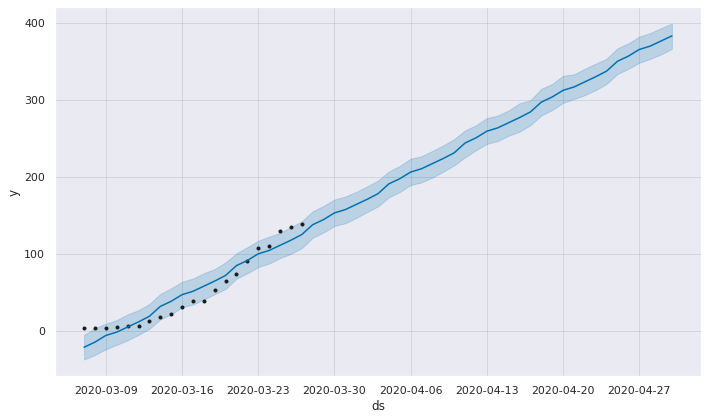

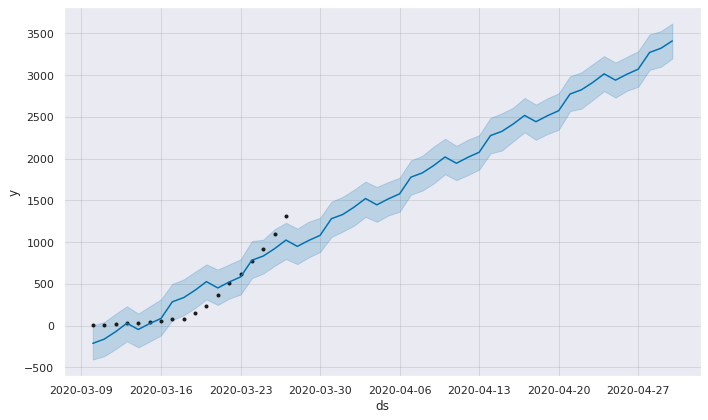

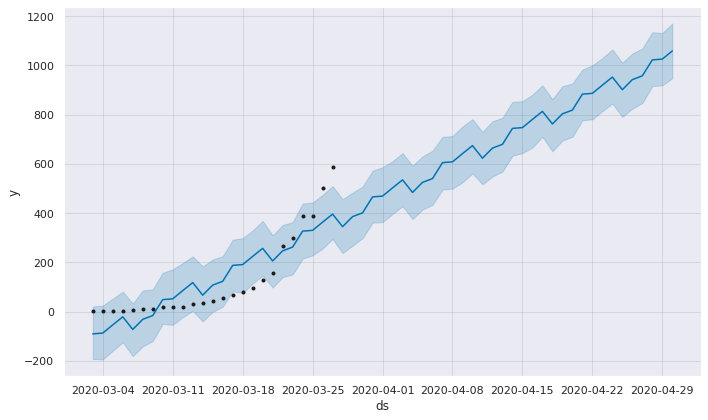

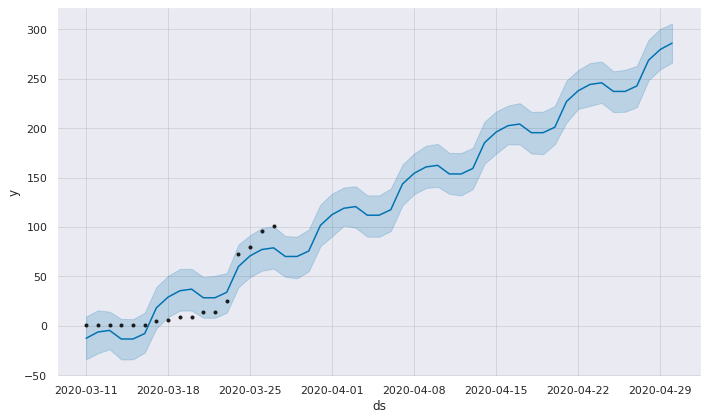

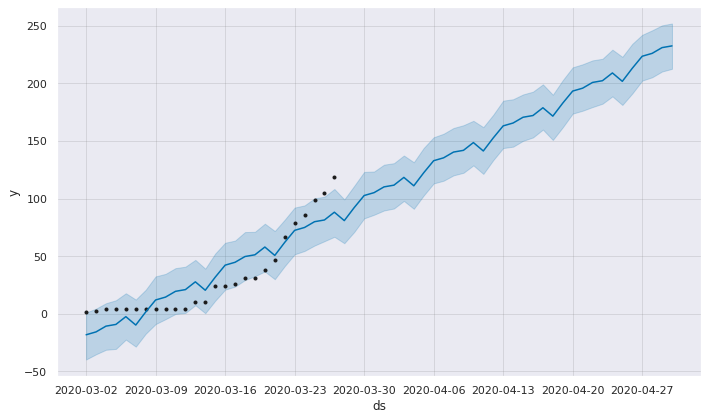

...

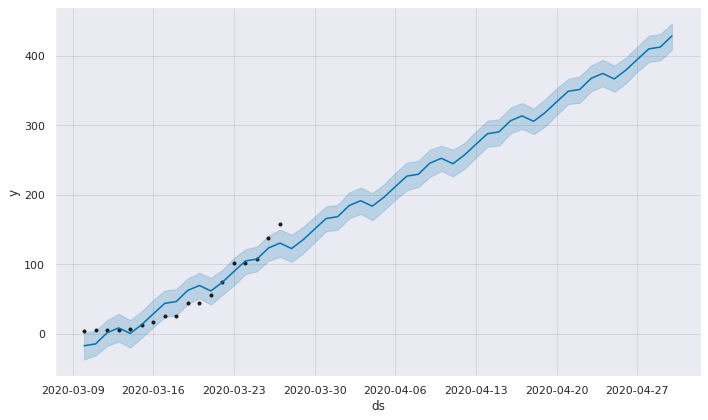

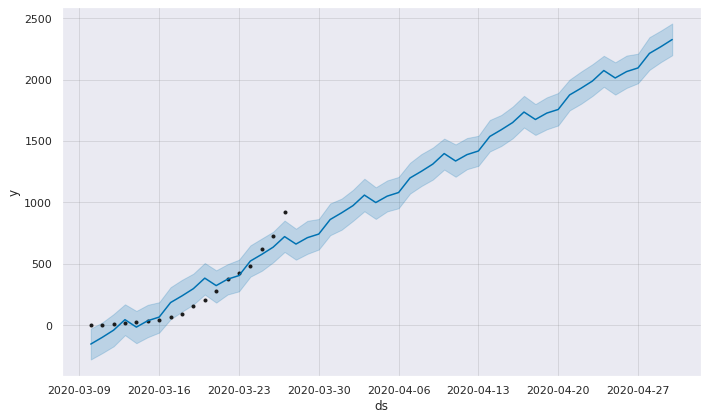

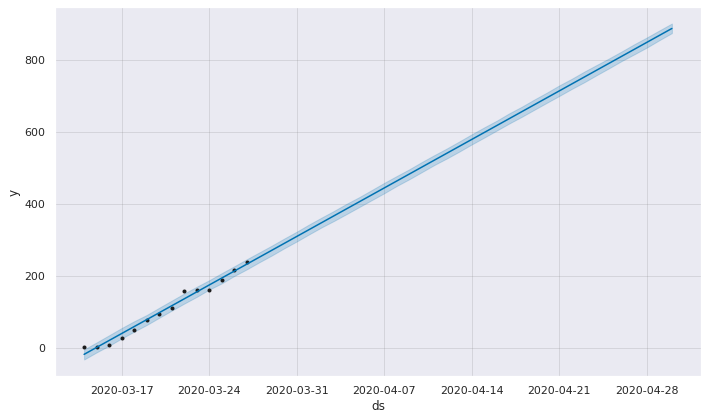

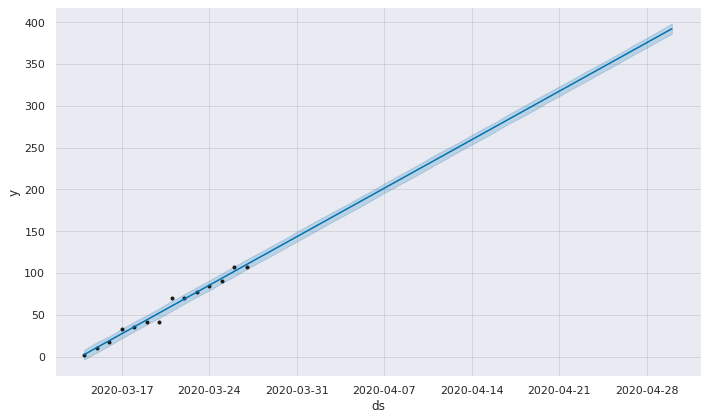

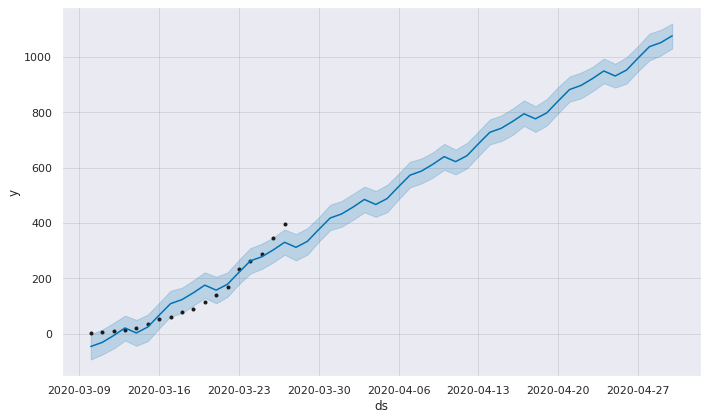

In [58]:
countries = set(train['Province_State'])
big_df = pd.DataFrame()
# for country in list(countries)[:3]:
for country in list(countries):  
  df = train[train['Province_State'] == country]
  # df = train[train['Country_Region'] == country]
  df_0 = df[df['ConfirmedCases'] > 0]
  sm = df_0[['Date','ConfirmedCases']]
  sm.columns = ['ds', 'y']
  results = get_prof_preds_for(sm, 34)
  new_df = results[['ds', 'trend', 'yhat']]
  new_df['country'] = country
  big_df = big_df.append(new_df)
  print('COUNTRY:', country)
  print(results)
  

  # train model
  # run model
  # make predictions
  # print predictions

In [57]:
big_df

,ds,trend,yhat,country
0,2020-03-07,-1.430856,-21.759509,Malta
1,2020-03-08,6.151689,-15.098138,Malta
2,2020-03-09,13.734234,-6.437629,Malta
3,2020-03-10,21.316779,-2.110366,Malta
4,2020-03-11,28.899323,4.549267,Malta
...,...,...,...,...
54,2020-04-26,1066.623472,942.658959,Argentina
55,2020-04-27,1086.501276,957.976186,Argentina
56,2020-04-28,1106.379080,1022.765024,Argentina
57,2020-04-29,1126.256884,1026.011058,Argentina


In [122]:
df

,country,ConfirmedCases
0,Liechtenstein,0 -0.621744 1 -0.092180 2 0.43738...
1,Uzbekistan,0 -0.696099 1 -0.105463 2 0.48517...
2,Montenegro,0 -0.492852 1 -0.077356 2 0.33814...


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:7: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



COUNTRY: Cote d'Ivoire
           ds         trend  ...  multiplicative_terms_upper          yhat
0  2020-02-01   -596.422150  ...                         0.0 -11395.214857
1  2020-02-02     33.008232  ...                         0.0 -10770.005452
2  2020-02-03    662.438613  ...                         0.0  -9653.099997
3  2020-02-04   1291.868995  ...                         0.0  -8751.441998
4  2020-02-05   1921.299377  ...                         0.0  -7198.481803
..        ...           ...  ...                         ...           ...
81 2020-04-22  50561.920798  ...                         0.0  41442.139618
82 2020-04-23  51194.995473  ...                         0.0  42989.369190
83 2020-04-24  51828.070148  ...                         0.0  44677.654360
84 2020-04-25  52461.144823  ...                         0.0  41662.352116
85 2020-04-26  53094.219498  ...                         0.0  42291.205814

[86 rows x 19 columns]


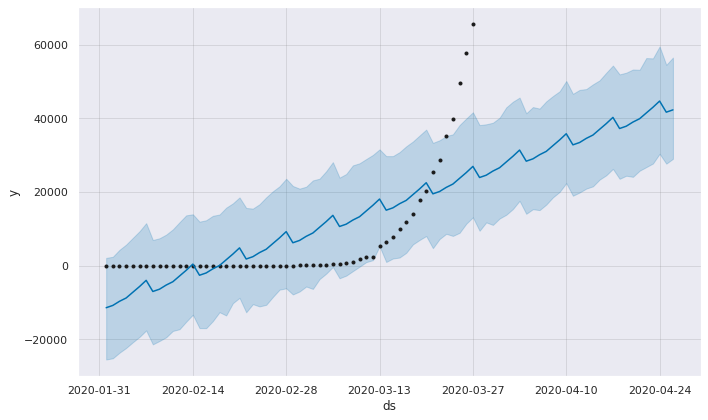

In [40]:
  # df = train[train['Country_Region'] == 'Spain']
  # df_0 = df[df['ConfirmedCases'] > 0]
  # sm = df_0[['Date','ConfirmedCases']]
  # sm.columns = ['ds', 'y']
  # results = get_prof_preds_for(sm, 30)
  # new_df = results[['ds', 'trend', 'yhat']]
  # new_df['country'] = country
  # big_df = big_df.append(new_df)
  # print('COUNTRY:', country)
  # print(results)

In [0]:
train_spain = train[train['Country_Region'] == 'Spain']

In [44]:
train_spain

,Id,Province_State,Country_Region,Date,ConfirmedCases,Fatalities
13794,20901,NaN,Spain,2020-01-22,0.0,0.0
13795,20902,NaN,Spain,2020-01-23,0.0,0.0
13796,20903,NaN,Spain,2020-01-24,0.0,0.0
13797,20904,NaN,Spain,2020-01-25,0.0,0.0
13798,20905,NaN,Spain,2020-01-26,0.0,0.0
...,...,...,...,...,...,...
13855,20962,NaN,Spain,2020-03-23,35136.0,2311.0
13856,20963,NaN,Spain,2020-03-24,39885.0,2808.0
13857,20964,NaN,Spain,2020-03-25,49515.0,3647.0
13858,20965,NaN,Spain,2020-03-26,57786.0,4365.0


In [45]:
big_df

,ds,trend,country
0,2020-03-07,-1.430856,Malta
1,2020-03-08,6.151689,Malta
2,2020-03-09,13.734234,Malta
3,2020-03-10,21.316779,Malta
4,2020-03-11,28.899323,Malta
...,...,...,...
81,2020-04-22,50561.920798,Cote d'Ivoire
82,2020-04-23,51194.995473,Cote d'Ivoire
83,2020-04-24,51828.070148,Cote d'Ivoire
84,2020-04-25,52461.144823,Cote d'Ivoire


In [49]:
test.tail()

,ForecastId,Province_State,Country_Region,Date
12637,12638,Zimbabwe,Zimbabwe,2020-04-26
12638,12639,Zimbabwe,Zimbabwe,2020-04-27
12639,12640,Zimbabwe,Zimbabwe,2020-04-28
12640,12641,Zimbabwe,Zimbabwe,2020-04-29
12641,12642,Zimbabwe,Zimbabwe,2020-04-30


In [53]:
big_df

,ds,trend,country
0,2020-03-07,-1.430856,Malta
1,2020-03-08,6.151689,Malta
2,2020-03-09,13.734234,Malta
3,2020-03-10,21.316779,Malta
4,2020-03-11,28.899323,Malta
...,...,...,...
54,2020-04-26,1066.623472,Argentina
55,2020-04-27,1086.501276,Argentina
56,2020-04-28,1106.379080,Argentina
57,2020-04-29,1126.256884,Argentina
